In [ ]:
import itertools
import plotly.express as px
import plotly.graph_objs as go
import plotly

import numpy as np
import seaborn as sns

import pingouin
import statsmodels.api as sm
import statsmodels.formula.api as smf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import colors
import json
import time
import pandas as pd
import glob
from copy import deepcopy
import os
import sys
from joblib import Parallel, delayed, cpu_count, dump,load
import plotly.express as px

from zpyhelper.filesys import checkdir
from zpyhelper.MVPA.rdm import compute_rdm,lower_tri,upper_tri, compute_rdm_nomial, compute_rdm_identity
from zpyhelper.MVPA.preprocessors import scale_feature, split_data, concat_data

project_path = r'D:\OneDrive - Nexus365\pirate_ongoing'
sys.path.append(project_path)
from scripts.Exp1_fmri.multivariate.modelrdms import ModelRDM
from scripts.Exp1_fmri.multivariate.pirateOMutils import parallel_axes_cosine_sim, minmax_scale, generate_filters

import scipy

import warnings

warnings.simplefilter('ignore', category=FutureWarning)

In [2]:
from plotting_utils import plot_rdm_withlabel, grouped_barscatter_withstats,gen_pval_annot

In [3]:
sns.color_palette("colorblind",10)
sns.color_palette("colorblind6",6)

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [4]:
choose_color_from = sns.color_palette("colorblind",10).as_hex()

print(choose_color_from)
choose_color_from

['#0173b2', '#de8f05', '#029e73', '#d55e00', '#cc78bc', '#ca9161', '#fbafe4', '#949494', '#ece133', '#56b4e9']


['#0173b2',
 '#de8f05',
 '#029e73',
 '#d55e00',
 '#cc78bc',
 '#ca9161',
 '#fbafe4',
 '#949494',
 '#ece133',
 '#56b4e9']

In [5]:
#plotting palettes
stimycolornames = dict(zip(
    [-2,-1,0,1,2],
    ['yellow', 'quagmire', 'blue', 'wine', 'jade']
))

#replace the central one that was actually used in the task('#8484FF') 
#with the color palette for training stimuli for easy understanding
stimycolorhex = dict(zip(
    [-2,-1,0,1,2],
    ['#FFD300', '#005800', choose_color_from[0], '#9E4F46', '#00FFC1'] 
))

stimxanimalnames = dict(zip(
    [-2,-1,0,1,2],
    ["crab","duck","elephant","giraffe","whale"]

))

participantgrouphex = dict(zip(
    ["Generalizer","nonGeneralizer"],
    [choose_color_from[2],choose_color_from[4]]  
))

axis_group_markers = dict(zip(["x","y"],["o","D"]))
psgroup_huedict = dict(zip(["top-right","orthogonal","top-left"],
                           #["#15B01A","#BF9000","#030764"],# GREEN, yellow, darkblue
                           [choose_color_from[5],choose_color_from[7],choose_color_from[8]]
                           )) 
psgroupnum_huedict = dict(zip([-1,0,1],
                           #["#15B01A","#BF9000","#030764"],# GREEN, yellow, darkblue
                           [choose_color_from[5],choose_color_from[7],choose_color_from[8]]
                           )) 

train_test_color_pal = dict(zip(["Training Stimuli","Test Stimuli"],[choose_color_from[0],choose_color_from[1]]))

print("stimycolorhex: ", stimycolorhex)
print("participantgrouphex: ", participantgrouphex)
print("axis_group_markers: ", axis_group_markers)
print("psgroup_huedict: ", psgroup_huedict)
print("psgroupnum_huedict: ", psgroupnum_huedict)
print("train_test_color_pal: ", train_test_color_pal)


stimycolorhex:  {-2: '#FFD300', -1: '#005800', 0: '#0173b2', 1: '#9E4F46', 2: '#00FFC1'}
participantgrouphex:  {'Generalizer': '#029e73', 'nonGeneralizer': '#cc78bc'}
axis_group_markers:  {'x': 'o', 'y': 'D'}
psgroup_huedict:  {'top-right': '#ca9161', 'orthogonal': '#949494', 'top-left': '#ece133'}
psgroupnum_huedict:  {-1: '#ca9161', 0: '#949494', 1: '#ece133'}
train_test_color_pal:  {'Training Stimuli': '#0173b2', 'Test Stimuli': '#de8f05'}


In [6]:
#plotting markers
from svgpath2mpl import parse_path
from matplotlib.path import Path
from xml.dom import minidom
from matplotlib.transforms import Affine2D

# Function to extract path data from an SVG file
def extract_svg_path(svg_file):
    doc = minidom.parse(svg_file)
    path_strings = [path.getAttribute('d') for path in doc.getElementsByTagName('path')]
    doc.unlink()
    return path_strings  # Assuming there's only one path in the SVG file

# Load the SVG file and extract the path data
svg_folder = r'D:\OneDrive - Nexus365\pirate_ongoing\animalsvg'
stimxanimalmarkers = {}
for xloc,animal in stimxanimalnames.items():
    svg_file = os.path.join(svg_folder, f'{animal}.svg')
    svg_path_strings = extract_svg_path(svg_file)
    # Convert the SVG path to a Matplotlib path
    custom_markers = [parse_path(svg_path_string) for svg_path_string in svg_path_strings]
    
    for marker in custom_markers:
       marker.vertices -= marker.vertices.mean(axis=0)  # Center the marker
       
    stimxanimalmarkers[xloc] = Path(
                                    np.vstack([m.vertices for m in custom_markers]),
                                    np.hstack([m.codes for m in custom_markers])
                               ).transformed(Affine2D().scale(1, -1))


In [7]:
# load data
study_scripts   = r"D:\OneDrive - Nexus365\pirate_ongoing\scripts\Exp1_fmri"
with open(os.path.join(study_scripts,'pirate_defaults.json')) as f:
    pirate_defaults = json.load(f)
    subid_list = pirate_defaults['participants']['validids']
    cohort1ids = [x for x in pirate_defaults['participants']['cohort1ids'] if x in subid_list]
    cohort2ids = [x for x in pirate_defaults['participants']['cohort2ids'] if x in subid_list]
    nongeneralizers = pirate_defaults['participants']["nongeneralizerids"]
    generalizers    = pirate_defaults['participants']["generalizerids"]

print("N_cohort 1: ",len(cohort1ids), "  N_cohort 2: ",len(cohort2ids), "N_Total: ",len(subid_list))

ROIRSAdir = r"D:\OneDrive - Nexus365\pirate_ongoing\AALandHCPMMP1andFUNCcluster"
roi_data = load(os.path.join(ROIRSAdir,"roi_data_4r.pkl"))
rois =  list(roi_data.keys())

keep_rois = [x for x in rois if "bilateral" in x] + ["allgtlocPrecentral_left"]
print(len(keep_rois))

N_cohort 1:  29   N_cohort 2:  27 N_Total:  56
8


In [8]:
keep_rois

['testgtlocTPMid_bilateral',
 'testgtlocParietalSup_bilateral',
 'HPCPHPC_bilateral',
 'HPC_bilateral',
 'vmPFC_bilateral',
 'V1_bilateral',
 'V2_bilateral',
 'allgtlocPrecentral_left']

In [9]:
def ttest1samp_equiv_permutation(y,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y,),
                                       statistic=np.mean,
                                       n_resamples=n_perm,
                                       permutation_type="samples",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res

def ttestpairedsamp_equiv_permutation(y1,y2,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: np.mean(y1-y2),
                                       n_resamples=n_perm,permutation_type="samples",
                                       random_state = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res
    
def ttestindsamp_equiv_permutation(y1,y2,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: np.mean(y1)-np.mean(y2),
                                       n_resamples=n_perm,permutation_type="independent",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res

def correlation_equiv_permutation(y1,y2,corrfun,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: corrfun(y1,y2),
                                       n_resamples=n_perm,permutation_type="pairings",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res

# Load analysis results (and plotting as a whole)

## Dimensionality Data

In [10]:
svdestdim_df = pd.read_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"trainingstim_withinax_svdestdim_df.csv"))
#svdestdim_df = pd.read_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"teststim_withinax_svdestdim_df.csv"))

svdestdim_df = svdestdim_df[svdestdim_df.roi.isin(rois)]    
svdestdim_df["roi"] = pd.Categorical(svdestdim_df.roi, categories=rois,ordered=True)
svdestdim_df_sum = svdestdim_df.groupby(["roi","subid","dimonaxis"]).mean().reset_index()
svdestdim_df_sum[["region","side"]] = svdestdim_df_sum.roi.str.split("_",expand=True)
svdestdim_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdestdim_df_sum["subid"]]    
svdestdim_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in svdestdim_df_sum["subid"]] 

print(svdestdim_df_sum.shape)
svdestdim_df_sum



(2240, 11)


,roi,subid,dimonaxis,est_dim,reconstruction_corr,reconstruction_r2,run,region,side,subgroup,subcohort
0,testgtlocTPMid_bilateral,sub001,x axis,1.50,0.027326,-1.608429,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
1,testgtlocTPMid_bilateral,sub001,y axis,2.50,0.011305,-2.302037,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
2,testgtlocTPMid_bilateral,sub002,x axis,2.75,-0.007428,-2.385979,1.5,testgtlocTPMid,bilateral,nonGeneralizer,first cohort
3,testgtlocTPMid_bilateral,sub002,y axis,1.75,0.031507,-3.754122,1.5,testgtlocTPMid,bilateral,nonGeneralizer,first cohort
4,testgtlocTPMid_bilateral,sub003,x axis,2.00,0.135556,-1.997085,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
...,...,...,...,...,...,...,...,...,...,...,...
2235,allgtlocPrecentral_left,sub128,y axis,2.00,0.004608,-2.386244,1.5,allgtlocPrecentral,left,Generalizer,second cohort
2236,allgtlocPrecentral_left,sub129,x axis,1.00,0.138199,-1.911592,1.5,allgtlocPrecentral,left,Generalizer,second cohort
2237,allgtlocPrecentral_left,sub129,y axis,1.75,0.073952,-2.253376,1.5,allgtlocPrecentral,left,Generalizer,second cohort
2238,allgtlocPrecentral_left,sub130,x axis,1.00,0.066563,-1.697071,1.5,allgtlocPrecentral,left,Generalizer,second cohort


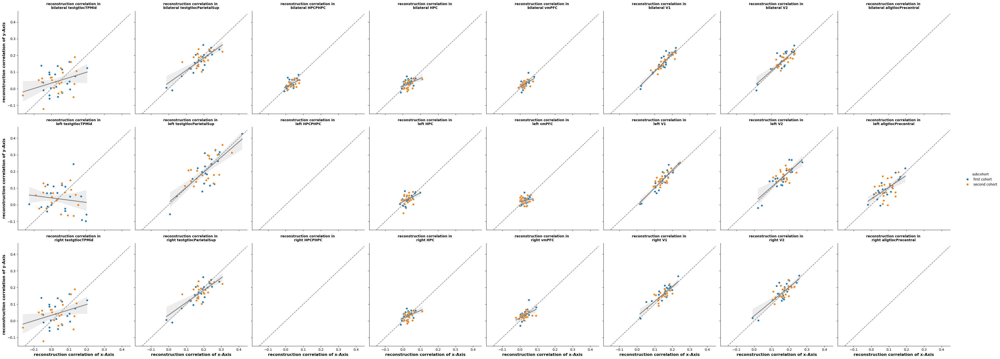

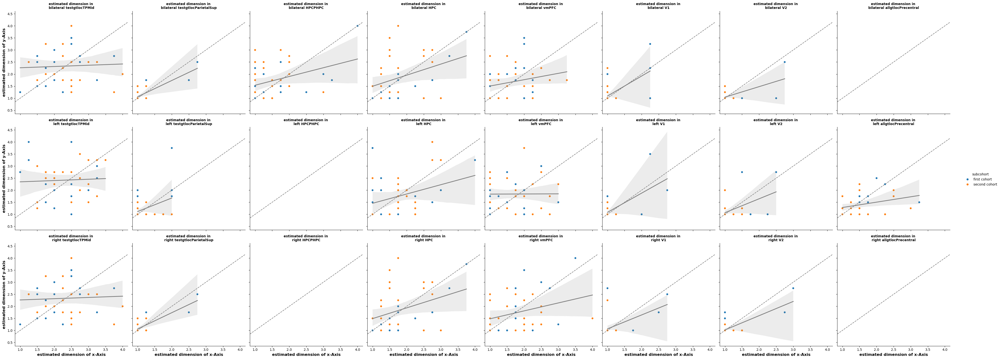

In [32]:
# see if the estimation for x axis and y axis are consistent
plot_yvars = {"reconstruction correlation":"reconstruction_corr","estimated dimension":"est_dim"}
for yname, ycol in plot_yvars.items():
    plotdf = svdestdim_df_sum[svdestdim_df_sum.subgroup=="Generalizer"].copy().pivot(index=["roi","region","side","subgroup","subcohort","subid"], columns="dimonaxis", values=ycol).reset_index()
    gs = sns.relplot(data=plotdf,
                     x="x axis",
                     y= "y axis",
                     hue="subcohort",palette="tab10",
                     col="region",
                     row="side",
                     kind="scatter")
    gs.map_dataframe(sns.regplot,
                     x="x axis",
                     y= "y axis",
                     color="grey",scatter=False)
    for ax in gs.axes.flatten():
        if "dim" in yname:
            ax.axline((1,1),slope=1,color="grey",linestyle="--")
        else:
            ax.axline((0,0),slope=1,color="grey",linestyle="--")
    gs.set_titles("%s in \n{row_name} {col_name}"%(yname),fontdict={"fontsize":15,"fontweight":"bold"})
    gs.set_axis_labels(x_var=f"{yname} of x-Axis", y_var=f"{yname} of y-Axis", clear_inner=False, fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    gs.tight_layout()


In [56]:
svdestdim_df_sum_wide = svdestdim_df_sum.pivot(index=["roi","subid","subgroup"],columns="dimonaxis",values="est_dim").reset_index()
for roiname, roidf in svdestdim_df_sum_wide[(svdestdim_df_sum_wide.subgroup=="Generalizer")].copy().groupby("roi"):
    if "vmPFC_bilateral" in roiname:
        print(roiname)
        print(correlation_equiv_permutation(roidf["x axis"].values,roidf["y axis"].values,
                                            corrfun=lambda x,y: scipy.stats.pearsonr(x,y).statistic,
                                            return_ponly=False))
        print(ttestpairedsamp_equiv_permutation(roidf["y axis"].values,roidf["x axis"].values,
                                            return_ponly=False))

vmPFC_bilateral
PermutationTestResult(statistic=0.21645233703786837, pvalue=0.1917808219178082, null_distribution=array([ 0.11111648, -0.01616434, -0.06883227, ..., -0.09516624,
        0.01894761,  0.13306145]))
PermutationTestResult(statistic=0.024390243902439025, pvalue=0.8799120087991201, null_distribution=array([ 0.06097561,  0.08536585,  0.14634146, ...,  0.03658537,
        0.09756098, -0.01219512]))


In [11]:
svdestdim_df_sum_overaxis = svdestdim_df_sum.groupby(["roi","subid"])[["est_dim","reconstruction_corr"]].mean().reset_index()
svdestdim_df_sum_overaxis["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdestdim_df_sum_overaxis["subid"]]
svdestdim_df_sum_overaxis.shape
svdestdim_df_sum_overaxis.columns

Index(['roi', 'subid', 'est_dim', 'reconstruction_corr', 'subgroup'], dtype='object')

In [12]:
svdestdim_df_sum_overaxis_wide = svdestdim_df_sum_overaxis.pivot(index=["subid","subgroup"],columns="roi",values="est_dim").reset_index()
svdestdim_df_sum_overaxis_wide

roi,subid,subgroup,testgtlocTPMid_bilateral,testgtlocParietalSup_bilateral,HPCPHPC_bilateral,HPC_bilateral,vmPFC_bilateral,V1_bilateral,V2_bilateral,testgtlocTPMid_left,...,vmPFC_left,V1_left,V2_left,testgtlocTPMid_right,testgtlocParietalSup_right,HPC_right,vmPFC_right,V1_right,V2_right,allgtlocPrecentral_left
0,sub001,Generalizer,2.000,1.000,1.625,1.875,1.250,1.000,1.000,1.625,...,1.000,1.000,1.000,2.000,1.000,1.875,2.750,1.000,1.000,1.000
1,sub002,nonGeneralizer,2.250,1.125,1.125,1.250,1.750,1.000,1.000,2.625,...,2.000,1.125,1.125,2.250,1.125,1.250,1.375,1.000,1.000,1.000
2,sub003,Generalizer,2.250,1.000,1.000,1.875,1.125,1.000,1.000,2.000,...,1.500,1.000,1.000,2.250,1.000,1.875,1.250,1.000,1.000,1.625
3,sub004,nonGeneralizer,2.000,1.000,1.500,2.375,1.750,1.000,1.000,3.125,...,1.875,1.000,1.000,2.000,1.000,2.375,1.125,1.125,1.000,1.250
4,sub005,Generalizer,3.000,1.000,1.625,1.125,1.500,1.000,1.000,2.500,...,2.250,1.000,1.250,3.000,1.000,1.125,1.625,1.000,1.000,2.250
5,sub006,Generalizer,2.500,1.000,1.250,1.500,1.750,1.000,1.000,2.125,...,2.125,1.000,1.125,2.500,1.000,1.500,1.750,1.000,1.000,1.250
6,sub007,Generalizer,2.500,1.000,1.500,1.250,1.125,1.000,1.000,2.625,...,1.875,1.000,1.000,2.500,1.000,1.250,1.000,1.000,1.000,1.000
7,sub008,Generalizer,3.250,1.125,1.000,2.250,2.000,1.625,1.250,2.875,...,2.250,1.500,1.375,3.250,1.125,2.250,1.750,1.375,1.250,1.625
8,sub009,Generalizer,2.875,2.125,2.500,3.000,2.750,2.750,2.625,2.625,...,2.000,2.375,2.625,2.875,2.125,3.000,2.750,2.125,2.250,2.250
9,sub010,nonGeneralizer,3.000,1.250,2.125,2.125,3.000,1.375,2.875,3.000,...,2.125,2.125,2.125,3.000,1.250,2.125,3.375,1.625,2.875,2.375


In [ ]:
HPCavedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["HPC_bilateral"].values
vmPFCavedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["vmPFC_bilateral"].values
V1avedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["V1_bilateral"].values
SPGavedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["testgtlocParietalSup_bilateral"]

print("HPC vs V1/SPG")
print(ttestpairedsamp_equiv_permutation(HPCavedim,V1avedim,return_ponly=False))
print(ttestpairedsamp_equiv_permutation(HPCavedim,SPGavedim,return_ponly=False))

print("vmPFC vs V1/SPG")
print(ttestpairedsamp_equiv_permutation(vmPFCavedim,V1avedim,return_ponly=False))
print(ttestpairedsamp_equiv_permutation(vmPFCavedim,SPGavedim,return_ponly=False))

print("vmPFC vs HPC")
print(ttestpairedsamp_equiv_permutation(vmPFCavedim,HPCavedim,return_ponly=False))



HPC vs V1/SPG
PermutationTestResult(statistic=0.6951219512195121, pvalue=0.00019998000199980003, null_distribution=array([-0.23780488,  0.01219512, -0.07317073, ...,  0.09146341,
        0.15243902,  0.09756098]))
PermutationTestResult(statistic=0.7134146341463414, pvalue=0.00019998000199980003, null_distribution=array([-0.25      ,  0.0304878 , -0.09756098, ...,  0.14634146,
        0.15243902,  0.15243902]))
vmPFC vs V1/SPG
PermutationTestResult(statistic=0.524390243902439, pvalue=0.00019998000199980003, null_distribution=array([-0.14634146,  0.02439024, -0.04878049, ...,  0.20121951,
        0.01829268,  0.06707317]))
PermutationTestResult(statistic=0.5426829268292683, pvalue=0.00019998000199980003, null_distribution=array([-0.15853659,  0.04268293, -0.07317073, ...,  0.25609756,
        0.01829268,  0.12195122]))
vmPFC vs HPC
PermutationTestResult(statistic=-0.17073170731707318, pvalue=0.1311868813118688, null_distribution=array([ 0.09146341,  0.01219512,  0.02439024, ...,  0.10975

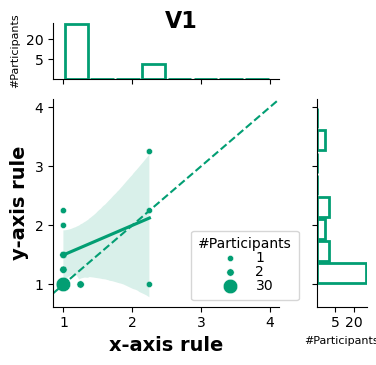

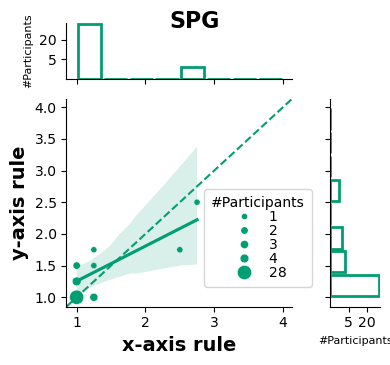

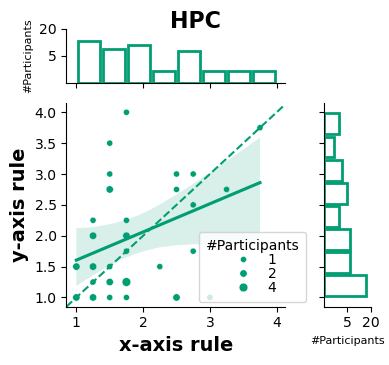

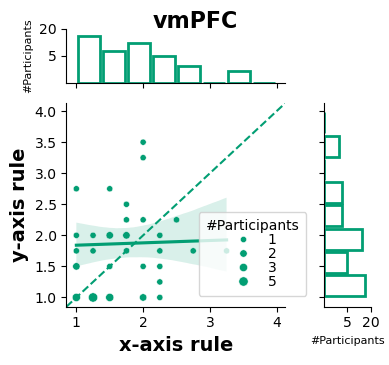

In [87]:
roishortnames = dict(zip(
    ["V1_bilateral","testgtlocParietalSup_bilateral","HPC_bilateral","vmPFC_bilateral"],
    ["V1","SPG","HPC","vmPFC"]
))
legendbbox = dict(zip(  
    ["V1_bilateral","testgtlocParietalSup_bilateral","HPC_bilateral","vmPFC_bilateral"],
    [(0.85,0.4),(0.85,0.6),(0.85,0.4),(0.85,0.5)]
)
)
for roi in ["V1_bilateral","testgtlocParietalSup_bilateral","HPC_bilateral","vmPFC_bilateral"]:
    pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.roi==roi)].copy()

    pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
        
    pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')

    dot_color=  colors.hex2color(participantgrouphex["Generalizer"])
    gs = sns.JointGrid(data=pdf_counts, x="x axis", y="y axis",
                    marginal_ticks=True,ratio=3,space=0.,height=4)
    unique_sizes = np.sort(pdf_counts["counts"].unique())
    
    plot_sizes = np.sqrt(unique_sizes)*20
    
    sns.scatterplot(pdf_counts,
                    x="x axis",
                    y="y axis",
                    size="counts",
                    sizes=dict(zip(
                        unique_sizes,
                        plot_sizes                                
                        )), 
                    #hue="subgroup",palette=participantgrouphex,
                    color=dot_color,
                    ax=gs.ax_joint
                    )

    #gs.ax_joint.set_aspect(1.1)

    sns.histplot(x="x axis", 
                fill=False, linewidth=2, 
                binrange=[1,4], bins=8, element="bars", 
                shrink=0.9, line_kws={'width':0.1}, 
                ax=gs.ax_marg_x,kde=False, color=dot_color,data=pdf_wide
                )
    gs.ax_marg_x.set_yscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
    gs.ax_marg_x.set_yticks([5,20])
    gs.ax_marg_x.set_ylabel("#Participants",fontdict={"fontsize":8,"fontweight":"regular"})
    sns.histplot(y="y axis", fill=False, linewidth=2, 
                binrange=[1,4], bins=8, element="bars", 
                shrink=0.9, line_kws={'width':0.1}, 
                ax=gs.ax_marg_y,kde=False, color=dot_color,data=pdf_wide)
    gs.ax_marg_y.set_xscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
    gs.ax_marg_y.set_xticks([5,20])
    gs.ax_marg_y.set_xlabel("#Participants",fontdict={"fontsize":8,"fontweight":"regular"})

    handles, labels = gs.ax_joint.get_legend_handles_labels()
    for handle in handles:
        handle.set_color(dot_color)
    
    gs.ax_joint.legend(handles=handles,#[handles[1],handles[3],handles[-1]],
                    labels=labels,#[labels[1],labels[3],labels[-1]], 
                    title="#Participants",
                    labelspacing=0,
                    borderpad=0.5,
                    loc="upper center",bbox_to_anchor=legendbbox[roi])

    sns.regplot(data=pdf_counts, x="x axis", y="y axis",scatter=False,ax=gs.ax_joint,color=dot_color,ci=95, n_boot=10000)
    gs.ax_joint.axline((1,1),slope=1,color=dot_color,linestyle="--")

    gs.ax_joint.set_xlabel("x-axis rule",fontdict={"fontsize":14,"fontweight":"bold"})
    gs.ax_joint.set_ylabel("y-axis rule",fontdict={"fontsize":14,"fontweight":"bold"})
    #gs.fig.set_figwidth(4.5/1.1)
    #gs.fig.set_figheight(4.5)
    #jointax_pos = gs.ax_joint.get_position()
    #xmargax_pos = gs.ax_marg_x.get_position()
    #ymargax_pos = gs.ax_marg_y.get_position()
    #gs.ax_marg_x.set_position([jointax_pos.x0,xmargax_pos.y0,jointax_pos.width,xmargax_pos.height])
    #gs.ax_marg_y.set_position([ymargax_pos.x0,jointax_pos.y0,ymargax_pos.width,jointax_pos.height])
    gs.figure.suptitle(roishortnames[roi],fontsize=16,fontweight="bold",y=0.9)
    gs.figure.tight_layout()


## identity decoding

In [11]:
TSstim_decoding_res = load(os.path.join(ROIRSAdir,"TSstimidentity_decoding_results","allstimidendity_LRdecoding_acc_skf_HPC_bilateral.pkl"))
print(TSstim_decoding_res.keys())
print(TSstim_decoding_res['GSresults'].columns)
print(TSstim_decoding_res['performance'].columns)
print(TSstim_decoding_res['performance'].shape)

dict_keys(['decoder', 'performance', 'confusion_matrices', 'GSresults'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'roi', 'subid', 'target', 'straifiedfold'],
      dtype='object')
Index(['fit_acc', 'eval_acc', 'straifiedfold', 'roi', 'subid', 'target',
       'random_state'],
      dtype='object')
(1120, 7)


In [12]:
TSstim_decoding_res["performance"].shape[0]/len(subid_list)/TSstim_decoding_res["performance"].target.nunique()/TSstim_decoding_res["performance"].straifiedfold.nunique()/TSstim_decoding_res["performance"].random_state.nunique()/TSstim_decoding_res["performance"].roi.nunique()

1.0

In [13]:
TSstimiddc_performance_df = TSstim_decoding_res["performance"].copy()
TSstimiddc_performance_dfsum = TSstimiddc_performance_df.groupby(["roi","subid","target"])[["fit_acc","eval_acc"]].mean().reset_index()

TSstimiddc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TSstimiddc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
TSstimiddc_performance_dfsum[['region','side']] = TSstimiddc_performance_dfsum.roi.str.split("_",expand=True)

TSstimiddc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TSstimiddc_performance_df["subid"]]
TSstimiddc_performance_df[['region','side']] = TSstimiddc_performance_df.roi.str.split("_",expand=True)

In [ ]:
gs = sns.catplot(data=TSstimiddc_performance_dfsum,
            x="region",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            row="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6).set_titles("")
gs.map_dataframe(sns.stripplot,
                 x="region",y="eval_acc",alpha=0.3,
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)

for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Evaluation) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(1/25,linestyle="--",color="grey",label="stim ID decoding chance level")
    

gs = sns.catplot(data=TSstimiddc_performance_dfsum,
            x="region",y="fit_acc",
            hue="subgroup",palette=participantgrouphex,
            row="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6)
gs.map_dataframe(sns.stripplot,
                 x="region",y="fit_acc",
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
    


## Feature Decoding Data

In [88]:
nctrstim_decoding_res = load(os.path.join(ROIRSAdir,"trainingstim_decoding_results","noncenter_trainingstim_LRdecoding_acc_skf.pkl"))
print(nctrstim_decoding_res.keys())
print(nctrstim_decoding_res['GSresults'].columns)
print(nctrstim_decoding_res['performance'].columns)
print(nctrstim_decoding_res['performance'].shape)

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'roi', 'subid', 'target', 'straifiedfold'],
      dtype='object')
Index(['fit_acc', 'eval_acc', 'straifiedfold', 'roi', 'subid', 'target',
       'random_state'],
      dtype='object')
(94080, 7)


In [16]:
nctrstim_decoding_res["performance"].shape[0]/len(subid_list)/nctrstim_decoding_res["performance"].target.nunique()/nctrstim_decoding_res["performance"].straifiedfold.nunique()/nctrstim_decoding_res["performance"].random_state.nunique()/nctrstim_decoding_res["performance"].roi.nunique()

1.0

In [89]:
nctrstimdc_performance_df = nctrstim_decoding_res["performance"].copy()
nctrstimdc_performance_dfsum = nctrstimdc_performance_df.groupby(["roi","subid","target"])[["fit_acc","eval_acc"]].mean().reset_index()

nctrstimdc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrstimdc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
nctrstimdc_performance_dfsum[['region','side']] = nctrstimdc_performance_dfsum.roi.str.split("_",expand=True)
#
nctrstimdc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrstimdc_performance_df["subid"]]
nctrstimdc_performance_df[['region','side']] = nctrstimdc_performance_df.roi.str.split("_",expand=True)

In [ ]:
gs = sns.catplot(data=nctrstimdc_performance_dfsum[(nctrstimdc_performance_dfsum.target=="stim_id")&(nctrstimdc_performance_dfsum.roi=="HPC_bilateral")],
            x="region",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            row="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6).set_titles("")
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    if "stim_id" in ax.get_title():
        ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
    else:
        ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
gs.map_dataframe(sns.stripplot,
                 x="region",y="eval_acc",alpha=0.3,
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)


gs = sns.catplot(data=nctrstimdc_performance_dfsum[(nctrstimdc_performance_dfsum.target=="stim_id")&(nctrstimdc_performance_dfsum.roi=="HPC_bilateral")],
            x="region",y="fit_acc",
            hue="subgroup",palette=participantgrouphex,
            row="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6).set_titles("")
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    if "stim_id" in ax.get_title():
        ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
    else:
        ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
gs.map_dataframe(sns.stripplot,
                 x="region",y="fit_acc",
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)


In [90]:
# correlation between decoding accuracy and dimensionality separately for each axis
nctrstimdc_performance_dfsum["target"] = pd.Categorical(nctrstimdc_performance_dfsum["target"],categories=["stim_id","stim_x","stim_y"],ordered=True)

training_feature_decoding = nctrstimdc_performance_df.query("target!='stim_id'").groupby(["roi","subid","target"])[["fit_acc","eval_acc"]].mean().reset_index()
training_feature_decoding["dimonaxis"] = training_feature_decoding["target"].map(dict(zip(['stim_x', 'stim_y'], ['x axis', 'y axis'])))
training_feature_decoding = training_feature_decoding.join(svdestdim_df_sum.set_index(["roi","subid","dimonaxis"]),on=["roi","subid","dimonaxis"],rsuffix="_svd")
training_feature_decoding.shape

(784, 14)

In [95]:
training_feature_decoding_sumoveraxs = training_feature_decoding.groupby(["roi","subid"])[["fit_acc","eval_acc","est_dim","reconstruction_corr"]].mean().reset_index()
training_feature_decoding_sumoveraxs
training_feature_decoding_sumoveraxs["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in training_feature_decoding_sumoveraxs["subid"]]


0.020492653791687732


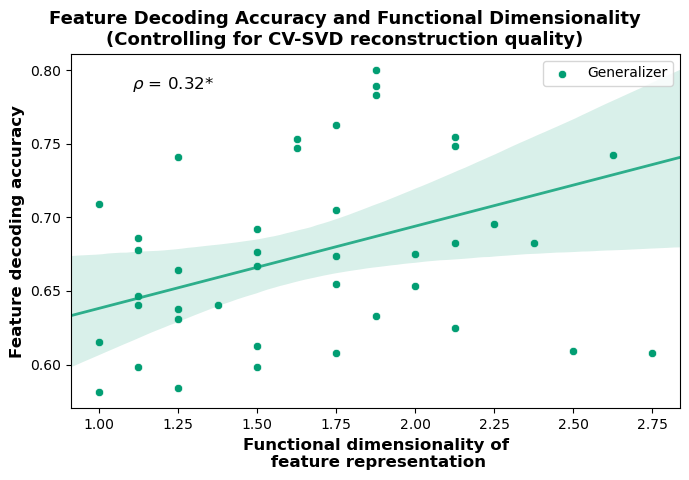

In [99]:
pdf = training_feature_decoding_sumoveraxs[(training_feature_decoding_sumoveraxs.subgroup=="Generalizer")&(training_feature_decoding_sumoveraxs.roi==f"vmPFC_bilateral")].copy() #(training_feature_decoding.subgroup=="Generalizer")
dot_color=  colors.hex2color(participantgrouphex["Generalizer"])


def partialrankcorr(data,x, y,covar, ax=None,**kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,x_covar=covar,method="pearson",alternative="greater")
    rho,pval = res.r[0], res["p-val"][0]
    print(pval)
    ax = ax if ax is not None else plt.gca()
    if pval<=0.05:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}{gen_pval_annot(pval,show_pval=False)}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    else:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)

fig, ax = plt.subplots(1,1,figsize=(7,5),
                         sharey=True,sharex=True)
    
sns.scatterplot(data=pdf.copy(),
                x="est_dim",y="eval_acc",
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,label="Generalizer",
                ax=ax)
sns.regplot(data=pdf,
            x="est_dim",y="eval_acc",
            scatter=False,truncate=False,
            #hue="subgroup",palette=participantgrouphex,
            color=dot_color,
            line_kws={"alpha":0.8,"linewidth":2},
            x_partial="reconstruction_corr",
            ci=95, n_boot=10000,
            ax=ax)
partialrankcorr(pdf,"est_dim","eval_acc","reconstruction_corr",ax=ax)

ax.tick_params(axis='both', which='both', labelsize=10,labelleft=True, labelbottom=True)
ax.set_ylabel("Feature decoding accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
ax.set_xlabel("Functional dimensionality of\n feature representation",fontdict={"fontsize":12,"fontweight":"bold"})

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=labels, title="")

fig.suptitle("Feature Decoding Accuracy and Functional Dimensionality\n(Controlling for CV-SVD reconstruction quality)",
                   fontsize=13,fontweight="bold",y=0.95)
fig.tight_layout()


## Cross Condition Train-Test Decoding Data

In [20]:
nctrtestim_decoding_res = load(os.path.join(ROIRSAdir,"train2test_decoding_results","noncenter_train2test_LRdecoding_acc_skf_vmPFC_bilateral.pkl"))
print(nctrtestim_decoding_res.keys())
print(nctrtestim_decoding_res['GSresults'].columns)

dict_keys(['decoder', 'performance', 'confusion_matrices', 'GSresults'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'split15_test_score', 'split16_test_score',
       'split17_test_score', 'split18_test_score', 'split19_test_score',
       'split20_test_score', 'split21_test_score', 'split22_test_score',
       'split23_test_score', 'split24_test_score', 'split25_test_score',
       'split26_test_score', 'split27_test_score', 'split28_test_score',
       'split29_test_score', 'split30_test_score', 'split31_test_score',
       'split32_test_score', 'split33_test_score', 'split3

In [21]:
trtedecodingcheckgsdfsummax = []
for gname,gdf in nctrtestim_decoding_res['GSresults'][nctrtestim_decoding_res['GSresults'].subid.isin(generalizers)].copy().groupby(["subid","roi","target"]):
    gdfsum = gdf.groupby(["subid","roi","target"])["mean_test_score"].max().reset_index()
    gdfsum["param_C"] = gdf.param_C.to_numpy()[np.argmax(gdf.mean_test_score.to_numpy())]
    trtedecodingcheckgsdfsummax.append(gdfsum)
trtedecodingcheckgsdfsummax = pd.concat(trtedecodingcheckgsdfsummax,axis=0).reset_index(drop=True)


In [14]:
print(nctrtestim_decoding_res["performance"].heldouttype.unique())
nctrtestim_decoding_res["performance"].head(5)

['train2test' 'test2train']


,fit_acc,eval_acc,fit_f1micro,eval_f1micro,fit_precision,eval_precision,fit_recall,eval_recall,heldoutgroup,heldouttype,roi,subid,target,random_state
0,1.0,0.296875,1.0,0.296875,1.0,0.296875,1.0,0.296875,0,train2test,HPC_bilateral,sub001,stim_x,0
1,1.0,0.187500,1.0,0.187500,1.0,0.187500,1.0,0.187500,1,test2train,HPC_bilateral,sub001,stim_x,0
2,1.0,0.281250,1.0,0.281250,1.0,0.281250,1.0,0.281250,0,train2test,HPC_bilateral,sub001,stim_y,0
3,1.0,0.250000,1.0,0.250000,1.0,0.250000,1.0,0.250000,1,test2train,HPC_bilateral,sub001,stim_y,0
4,1.0,0.265625,1.0,0.265625,1.0,0.265625,1.0,0.265625,0,train2test,HPC_bilateral,sub002,stim_x,0


In [16]:
nctrtesstimdc_performance_df = nctrtestim_decoding_res["performance"].copy()
nctrtesstimdc_performance_df = nctrtesstimdc_performance_df[nctrtesstimdc_performance_df.roi.str.contains("bilateral")].copy().reset_index(drop=True)   
#nctrtesstimdc_performance_df = nctrtesstimdc_performance_df[nctrtesstimdc_performance_df.heldouttype.str.contains("test2train")].copy().reset_index(drop=True)   
nctrtesstimdc_performance_dfsum = nctrtesstimdc_performance_df.groupby(["roi","subid","heldouttype","target"])[["fit_acc","eval_acc"]].mean().reset_index()
nctrtesstimdc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
nctrtesstimdc_performance_dfsum["target"] = pd.Categorical(nctrtesstimdc_performance_dfsum["target"],categories=["stim_x","stim_y"],ordered=True)
nctrtesstimdc_performance_dfsum[['region','side']] = nctrtesstimdc_performance_dfsum.roi.str.split("_",expand=True)

nctrtesstimdc_performance_df[["region","side"]] = nctrtesstimdc_performance_df.roi.str.split("_",expand=True)
nctrtesstimdc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_df["subid"]]

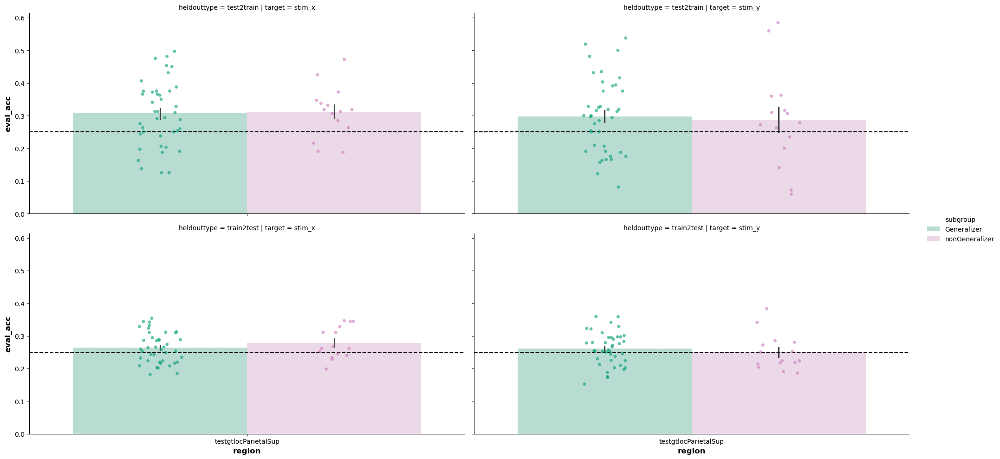

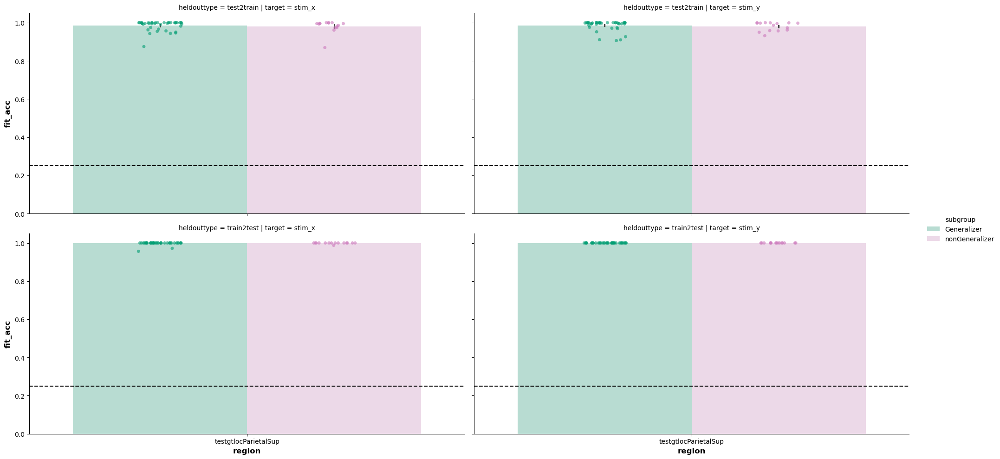

In [17]:
gs = sns.catplot(data=nctrtesstimdc_performance_dfsum,
            x="region",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            col="target", row="heldouttype",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="region",y="eval_acc",
                hue="subgroup",palette=participantgrouphex,alpha=0.6,
                dodge=True)

gs = sns.catplot(data=nctrtesstimdc_performance_dfsum,
            x="region",y="fit_acc",
            hue="subgroup",palette=participantgrouphex,
            col="target", row="heldouttype",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="region",y="fit_acc",
                hue="subgroup",palette=participantgrouphex,alpha=0.6,
                dodge=True)

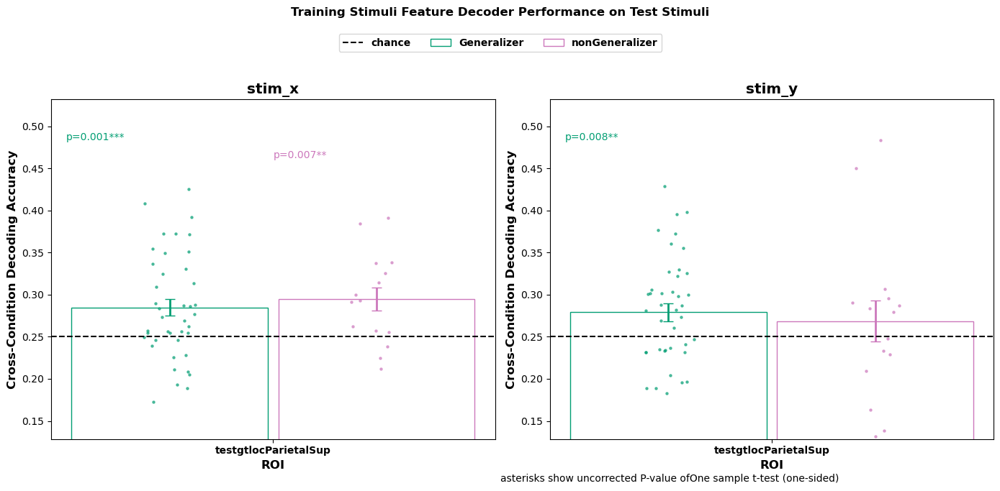

In [18]:
nctrtesstimdc_performance_dfsum["eval_acc_above_chance"] = nctrtesstimdc_performance_dfsum.eval_acc - 0.25

nctrtesstimdc_performance_dfsum["region"] = [x.split("_")[0] for x in nctrtesstimdc_performance_dfsum["roi"]]
nctrtesstimdc_performance_dfsum["region"] = pd.Categorical(nctrtesstimdc_performance_dfsum["region"],ordered=True)
nctrtesstimdc_performance_dfsumoversplits = nctrtesstimdc_performance_dfsum.groupby(["region","subid","target"])[["eval_acc","eval_acc_above_chance"]].mean().reset_index()
nctrtesstimdc_performance_dfsumoversplits["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_dfsumoversplits["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
xvar, gvar, yvar, yvartest = "region",  "subgroup", "eval_acc","eval_acc_above_chance"
fig,axes = grouped_barscatter_withstats(nctrtesstimdc_performance_dfsumoversplits,
                             facet_vars = "target", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                             hues=participantgrouphex,
                             prows=1,pcols=2,
                             
                             statfunc=lambda yt: ttest1samp_equiv_permutation(yt,n_perm=10000))
for ifacet, _ in enumerate(axes.flatten()):
    axes.flatten()[ifacet].set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].axhline(0.25,label="chance",color="k",ls='--')
    
hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
fig.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.05),ncol = 4,
           prop = dict(weight="bold"))
fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
fig.suptitle("Training Stimuli Feature Decoder Performance on Test Stimuli",fontweight="bold",fontsize="large",y=1.1)
fig.tight_layout()

## Cross Task Decoding Data

In [71]:
#nclocnavi_decoding_res = load(os.path.join(ROIRSAdir,"navi2loc_decoding_results","noncenter_navi2loc_LRdecoding_acc_skf_flzeralignedprocrustes_testgtlocParietalSup_bilateral.pkl"))
nclocnavi_decoding_res = load(os.path.join(ROIRSAdir,"navi2loc_decoding_results","noncenter_navi2loc_LRdecoding_acc_skf.pkl"))

print(nclocnavi_decoding_res.keys())
print(nclocnavi_decoding_res['performance'].columns)
print(nclocnavi_decoding_res['performance'].target.unique())

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['fit_acc', 'eval_acc', 'analysis', 'roi', 'subid', 'target',
       'random_state', 'dataset'],
      dtype='object')
['stim_x' 'stim_y']


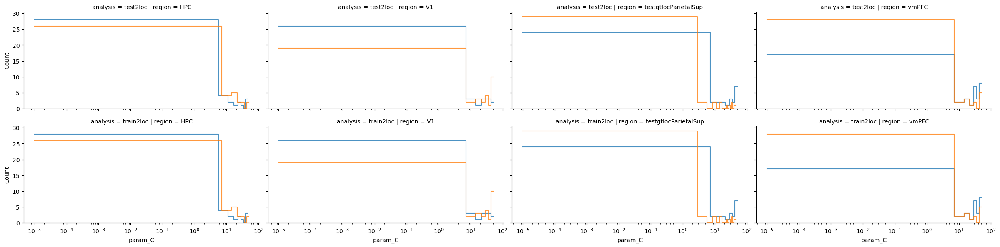

In [133]:
#print(nclocnavi_decoding_res['GSresults'].columns)

nclocnavidecodingcheckgsdfsummax = []
for gname,gdf in nclocnavi_decoding_res['GSresults'][nclocnavi_decoding_res['GSresults'].subid.isin(generalizers)].copy().groupby(["subid","roi","target"]):
    gdfsum = gdf.groupby(["subid","roi","target","analysis"])["mean_test_score"].max().reset_index()
    gdfsum["param_C"] = gdf.param_C.to_numpy()[np.argmax(gdf.mean_test_score.to_numpy())]
    nclocnavidecodingcheckgsdfsummax.append(gdfsum)
nclocnavidecodingcheckgsdfsummax = pd.concat(nclocnavidecodingcheckgsdfsummax,axis=0).reset_index(drop=True)

nclocnavidecodingcheckgsdfsummax[['region','side']] = nclocnavidecodingcheckgsdfsummax.roi.str.split("_",expand=True)
gs = sns.FacetGrid(nclocnavidecodingcheckgsdfsummax, col="region", row="analysis",hue="target",palette="tab10",aspect=2)
#for ifacet, (gnam,gdf) in enumerate(trtedecodingcheckgsdfsummax.groupby(["target","roi"])):
#    sns.histplot(gdf,x="param_C",ax=gs.axes.flatten()[ifacet])
gs.map_dataframe(sns.histplot,x="param_C",alpha=0.8,element="step",fill=False,multiple="layer")
gs.set(xscale="log")


In [ ]:
#check if gridsearch cover sufficient range of parameter range
hyperparamname = "param_C" # "param_C"
decodingcheckgsdf = nclocnavi_decoding_res['GSresults'][nclocnavi_decoding_res['GSresults'].subid.isin(generalizers)].copy()
decodingcheckgsdf.roi = pd.Categorical(decodingcheckgsdf.roi, categories=decodingcheckgsdf.roi.unique(),ordered=True)
decodingcheckgsdfsum = decodingcheckgsdf.groupby(["subid","roi","analysis","target",hyperparamname])["mean_test_score"].mean().reset_index()
gs = sns.relplot(data=decodingcheckgsdfsum,x=hyperparamname,y="mean_test_score",hue="subid",col="analysis",row="target",kind="scatter",facet_kws=dict(sharex=True,sharey=True),alpha=0.5,s=2)
gs.map_dataframe(sns.lineplot,x=hyperparamname,y="mean_test_score",hue="subid",alpha=0.5) #show individual lines
gs.map_dataframe(sns.lineplot,x=hyperparamname,y="mean_test_score",alpha=0.8,color="black") # show average line
gs.set(xscale="log")
for j,ax in enumerate(gs.axes.flatten()):
    ax.axhline(0.25,c="grey")

In [73]:
#check average decoding accuracy of all conditions
nclocnavidc_performance_df = nclocnavi_decoding_res["performance"].copy()
nclocnavidc_performance_dfsum = nclocnavidc_performance_df.groupby(["roi","subid","analysis","target"])[["fit_acc","eval_acc"]].mean().reset_index()
nclocnavidc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nclocnavidc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
nclocnavidc_performance_dfsum["target"] = pd.Categorical(nclocnavidc_performance_dfsum["target"],categories=["stim_x","stim_y"],ordered=True)
nclocnavidc_performance_dfsum[['region','side']] = nclocnavidc_performance_dfsum.roi.str.split("_",expand=True)

nclocnavidc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nclocnavidc_performance_df["subid"]]
nclocnavidc_performance_df[['region','side']] = nclocnavidc_performance_df.roi.str.split("_",expand=True)

In [ ]:
nclocnavidc_performance_df.columns

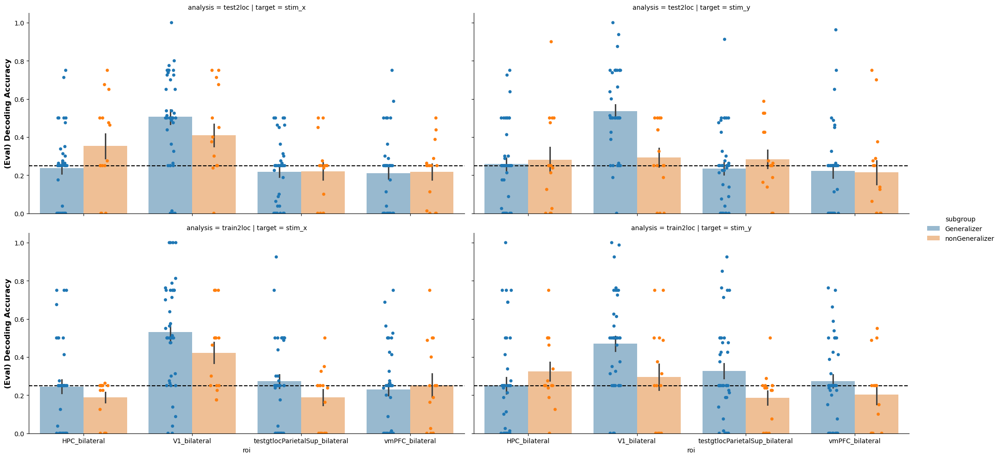

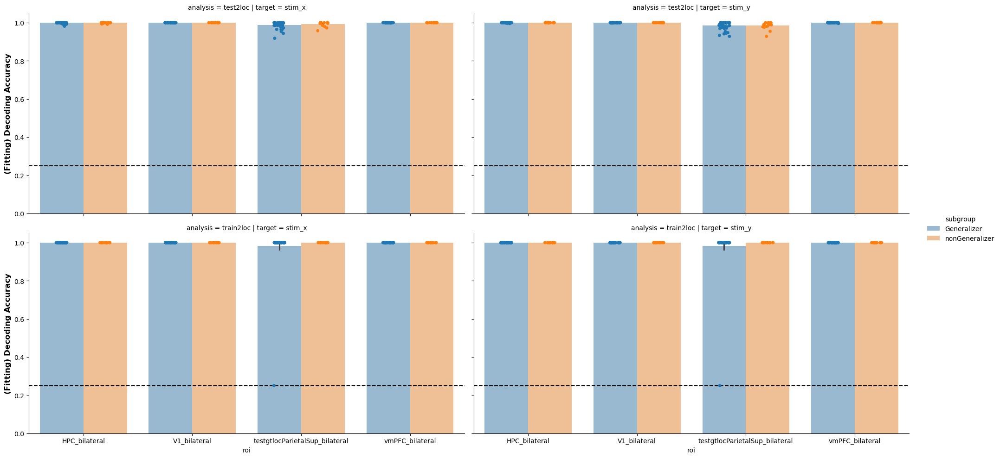

In [138]:
gs = sns.catplot(data=nclocnavidc_performance_dfsum,
            x="roi",y="eval_acc",
            hue="subgroup",palette="tab10",
            col="target",row="analysis",
            kind="bar",errorbar="se",alpha=0.5,aspect=2)
gs.map_dataframe(sns.stripplot,
                 x="roi",y="eval_acc",
                hue="subgroup",palette="tab10",
                dodge=True)
for ax in gs.axes.flatten():
    ax.set_ylabel("(Eval) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")

gs = sns.catplot(data=nclocnavidc_performance_dfsum,
            x="roi",y="fit_acc",
            hue="subgroup",palette="tab10",
            col="target",row="analysis",
            kind="bar",errorbar="se",alpha=0.5,aspect=2)
gs.map_dataframe(sns.stripplot,
                 x="roi",y="fit_acc",
                hue="subgroup",palette="tab10",
                dodge=True)
for ax in gs.axes.flatten():
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")


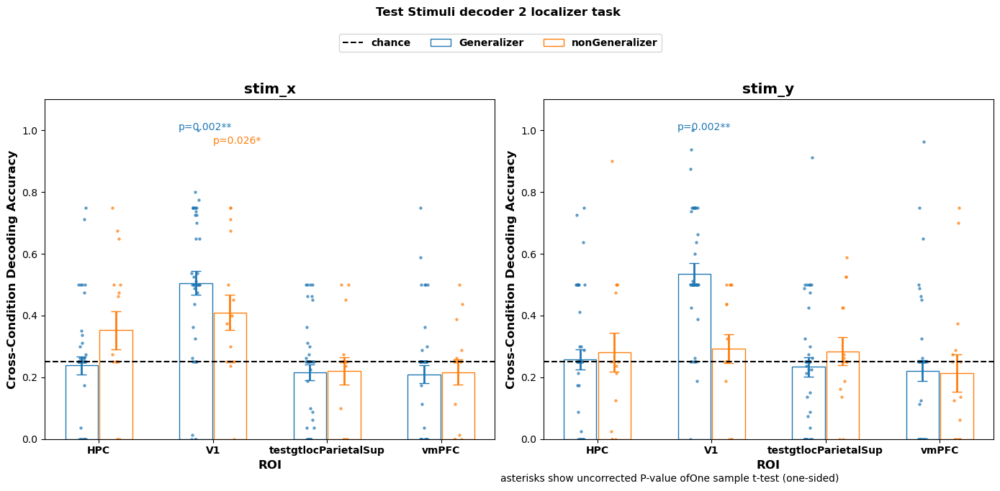

In [226]:
nclocnavidc_performance_dfsum["eval_acc_above_chance"] = nclocnavidc_performance_dfsum.eval_acc - 0.25

nclocnavidc_performance_dfsum["region"] = pd.Categorical(nclocnavidc_performance_dfsum["region"],ordered=True)
xvar, gvar, yvar, yvartest = "region",  "subgroup", "eval_acc","eval_acc_above_chance"
fig,axes = grouped_barscatter_withstats(nclocnavidc_performance_dfsum[nclocnavidc_performance_dfsum.analysis=="test2loc"].copy(),
                             facet_vars = "target", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                             prows=1,pcols=2,
                             
                             statfunc=lambda yt: ttest1samp_equiv_permutation(yt,n_perm=1000))
for ifacet, _ in enumerate(axes.flatten()):
    axes.flatten()[ifacet].set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].axhline(0.25,label="chance",color="k",ls='--')
    plt.setp(axes.flatten()[ifacet].get_xticklabels(),rotation=0)
    
hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
fig.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.05),ncol = 4,
           prop = dict(weight="bold"))
fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
fig.suptitle("Test Stimuli decoder 2 localizer task ",fontweight="bold",fontsize="large",y=1.1)
fig.tight_layout()

## Train-Test Separation

In [227]:
septraintest_decoding_res = load(os.path.join(ROIRSAdir,"navitraintestsplit_decoding_results","navi_septraintest_LRdecoding_acc.pkl"))
print(septraintest_decoding_res.keys())
print(septraintest_decoding_res['GSresults'].columns)
print(septraintest_decoding_res['performance'].columns)
print(septraintest_decoding_res['performance'].target.unique())

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'roi', 'subid', 'target', 'straifiedfold'],
      dtype='object')
Index(['fit_acc', 'eval_acc', 'fit_f1micro', 'eval_f1micro', 'fit_precision',
       'eval_precision', 'fit_recall', 'eval_recall', 'straifiedfold', 'roi',
       'subid', 'target'],
      dtype='object')
['stim_group']


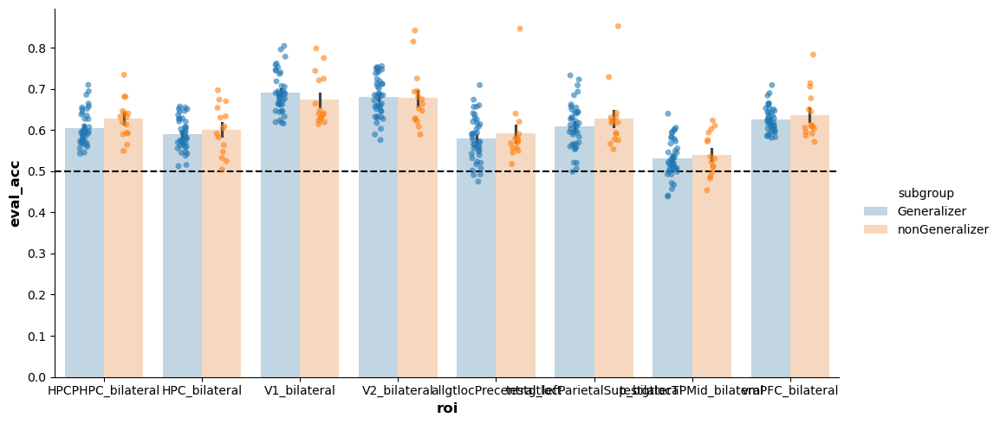

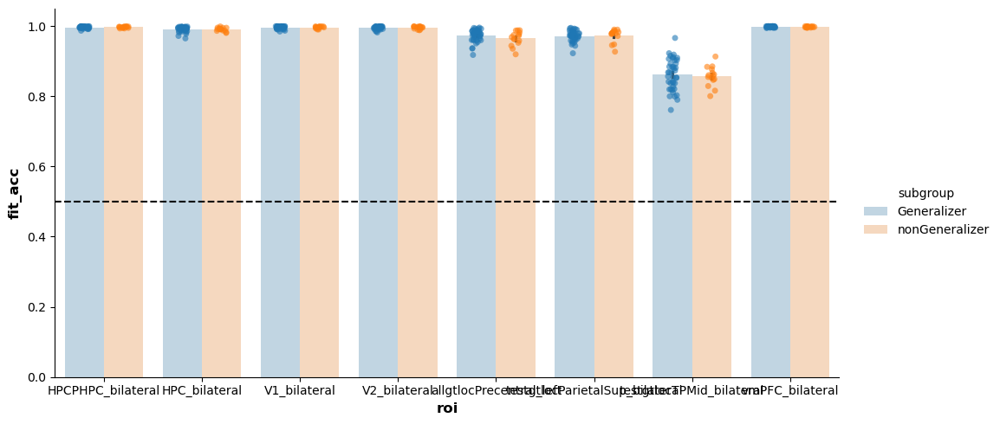

In [228]:
septraintestdc_performance_df = septraintest_decoding_res["performance"].copy()
keep_rois = [x for x in rois if "bilateral" in x] + ["allgtlocPrecentral_left"]
septraintestdc_performance_df = septraintestdc_performance_df[septraintestdc_performance_df.roi.isin(keep_rois)]
septraintestdc_performance_df_sum = septraintestdc_performance_df.groupby(["roi","subid"])[["fit_acc","eval_acc"]].mean().reset_index()
septraintestdc_performance_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in septraintestdc_performance_df_sum["subid"]]
gs = sns.catplot(data=septraintestdc_performance_df_sum,
            x="roi",y="eval_acc",
            hue="subgroup",palette="tab10",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.5,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="roi",y="eval_acc",
                hue="subgroup",palette="tab10",alpha=0.6,
                dodge=True)

gs = sns.catplot(data=septraintestdc_performance_df_sum,
            x="roi",y="fit_acc",
            hue="subgroup",palette="tab10",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.5,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="roi",y="fit_acc",
                hue="subgroup",palette="tab10",alpha=0.6,
                dodge=True)

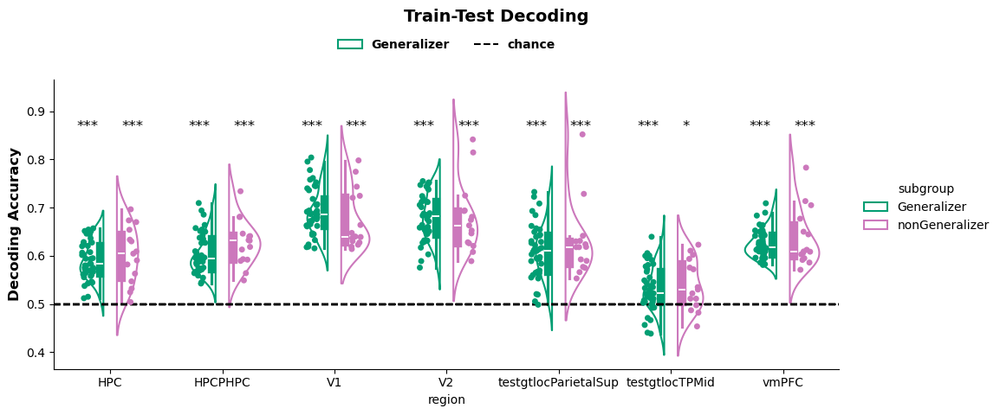

In [229]:
pdf = septraintestdc_performance_df.copy()
#pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("HPC"))].copy()
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.5

pdf_sum = pdf.groupby(["roi","subid"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))].copy().reset_index(drop=True)
pdf_sum["region"] = [x.split("_")[0] for x in pdf_sum["roi"]]
pdf_sum["region"] = pd.Categorical(pdf_sum["region"],ordered=True)
gs = sns.catplot(data=pdf_sum,
            x="region",
            y="eval_acc",
            kind="violin",
            inner="box",
            fill=False,
            hue="subgroup",palette=participantgrouphex,split=True,gap=0.3,
            #color="white",label=None,
            height=5,aspect=2
            )
gs.map_dataframe(sns.stripplot,x="region",
                y="eval_acc",
                 #color="grey",label="generalizers",alpha=0.8
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 )


for ax in gs.axes.flatten():
    for j, (gname,gdf) in enumerate(pdf_sum.groupby(["region","subgroup"])):
        ax.set_ylabel("Decoding Accuracy",fontweight="bold",fontsize=12)
        ax.axhline(0.5,label="chance",color="k",ls='--')
        pval = ttest1samp_equiv_permutation(gdf.eval_acc_above_chance.values)
        dm = [-0.3,0.1][j%2]
        ax.text(x=np.floor(j/2)+dm,
                y=1.01*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontsize=12)
        hs,ls = ax.get_legend_handles_labels()
        ax.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="lower center",bbox_to_anchor=(0.5,1.06),ncol = 2,
                prop = dict(weight="bold"),frameon=False)  
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.figure.suptitle("Train-Test Decoding",fontweight="bold",fontsize=14,y=0.95)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"HPChighdim","HPC_traintestCCGP.png"),dpi=300)

## Predicting test pattern from training stimuli 

In [28]:
from scipy.spatial.distance import cdist
from sklearn.linear_model import LinearRegression
config_locrep  = np.array(list(itertools.product([-2,-1,1,2],[-2,-1,1,2])))
compo_locrep   = np.vstack([list(itertools.product([-2,-1,1,2],[0])),
                           list(itertools.product([0],[-2,-1,1,2]))])
compo_locrep

percept_reg_coefs = cdist(config_locrep, compo_locrep, lambda u,v: sum(u==v))
dist_mod_reg_coefs = LinearRegression(fit_intercept=False,positive=False).fit(compo_locrep.T, config_locrep.T).coef_


In [59]:
retrivepat_res = load(os.path.join(ROIRSAdir,"retrievalpatternCV_rotated","resoverview","retrievalpatternCV_results.pkl"))


compositionretrieval_resdf = retrivepat_res["results"].copy()
compositionretrieval_resdf[["analysis","metricname"]] = compositionretrieval_resdf.metric.str.split("-",expand=True)
dsshortname={"rotated":"R","rotatedshuffle":"RS"}
compositionretrieval_resdf["anagroup"] = [x if ds=="orginal" else f"{dsshortname[ds]}{x}" for x,ds in compositionretrieval_resdf[['analysis','dataset']].to_numpy()]
compositionretrieval_resdf["region"] = [x.split("_")[0] for x in compositionretrieval_resdf.roi]

train2testencoding_resdf = compositionretrieval_resdf.query("anagroup=='train2test' and dataset=='orginal'").copy()
train2testencoding_resdf = train2testencoding_resdf.join(svdestdim_df_sum_overaxis.set_index(["roi","subid"]),on=["roi","subid"],rsuffix="_svd")
train2testencoding_resdf = train2testencoding_resdf[train2testencoding_resdf.roi.isin(keep_rois)]
print(train2testencoding_resdf.metricname.unique())

compositionretrieval_resdf["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in compositionretrieval_resdf["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True    
)


['fit_corr_O2E' 'eval_corr_O2E' 'fit_corr_E2O' 'eval_corr_E2O' 'fit_r2'
 'eval_r2' 'fit_corr' 'eval_corr' 'reg_distmod' 'reg_percept'
 'compoweight_x' 'compoweight_y' 'compoweight' 'noncompoweight_x'
 'noncompoweight_y' 'noncompoweight' 'meanweightdiff' 'sumweightdiff']


In [232]:
compositionretrieval_resdf.query("anagroup=='train2test'").copy()

,value,metric,roi,subid,dataset,perm,analysis,metricname,anagroup,region,subgroup
0,0.563371,train2test-fit_corr_O2E,testgtlocParietalSup_bilateral,sub001,orginal,NaN,train2test,fit_corr_O2E,train2test,testgtlocParietalSup,Generalizer
1,0.430801,train2test-eval_corr_O2E,testgtlocParietalSup_bilateral,sub001,orginal,NaN,train2test,eval_corr_O2E,train2test,testgtlocParietalSup,Generalizer
2,0.531545,train2test-fit_corr_E2O,testgtlocParietalSup_bilateral,sub001,orginal,NaN,train2test,fit_corr_E2O,train2test,testgtlocParietalSup,Generalizer
3,0.502084,train2test-eval_corr_E2O,testgtlocParietalSup_bilateral,sub001,orginal,NaN,train2test,eval_corr_E2O,train2test,testgtlocParietalSup,Generalizer
4,0.303728,train2test-fit_r2,testgtlocParietalSup_bilateral,sub001,orginal,NaN,train2test,fit_r2,train2test,testgtlocParietalSup,Generalizer
...,...,...,...,...,...,...,...,...,...,...,...
320503,0.074219,train2test-noncompoweight_x,V1_bilateral,sub130,orginal,NaN,train2test,noncompoweight_x,train2test,V1,Generalizer
320504,0.079923,train2test-noncompoweight_y,V1_bilateral,sub130,orginal,NaN,train2test,noncompoweight_y,train2test,V1,Generalizer
320505,0.077071,train2test-noncompoweight,V1_bilateral,sub130,orginal,NaN,train2test,noncompoweight,train2test,V1,Generalizer
320506,0.031354,train2test-meanweightdiff,V1_bilateral,sub130,orginal,NaN,train2test,meanweightdiff,train2test,V1,Generalizer


In [81]:
compositionretrieval_resdf.dataset.unique()

array(['orginal', 'rotated', 'rotatedshuffle'], dtype=object)

In [233]:
print(retrivepat_res.keys())
reg_coefs = retrivepat_res["unrotated_coefs"]

retrivepat_res["unrotated_coefs"]["V1_bilateral"]["train2test"][0].shape

dict_keys(['results', 'unrotated_coefs', 'rotated_coefs'])


(16, 8)

In [234]:
retrivepat_res["results"][["analysis","metricname"]] = retrivepat_res["results"].metric.str.split("-",expand=True)
    

In [47]:
retrivepat_res["results"].columns

Index(['value', 'metric', 'roi', 'subid', 'dataset', 'perm', 'analysis',
       'metricname'],
      dtype='object')

In [31]:
training_df.columns

Index(['stim_id', 'stim_group', 'stim_session', 'stim_x', 'stim_y',
       'stim_color', 'stim_shape', 'stim_xsign', 'stim_ysign', 'stim_xdist',
       'stim_ydist', 'stim_lrbux', 'stim_lrbuy', 'resp_x', 'resp_y',
       'resp_xsign', 'resp_ysign', 'resp_xdist', 'resp_ydist',
       'training_axset', 'training_axlocTL', 'training_axlocTR', 'taskname'],
      dtype='object')

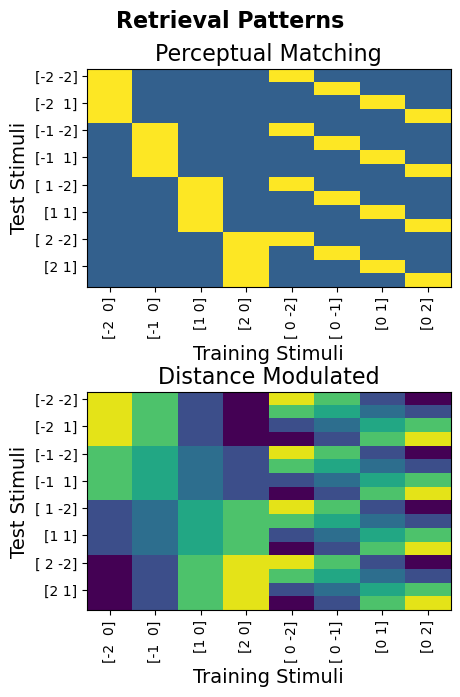

In [ ]:
stim_df = roi_data["V1_bilateral"][0]["stimdf"].copy()
test_df = stim_df[stim_df.stim_group==0].copy().reset_index(drop=True)
training_df = stim_df[stim_df.stim_group==1].copy().reset_index(drop=True)
training_df.sort_values(by=["training_axset","training_axlocTL"],inplace=True)
allylabs = (test_df[test_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[training_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,2)

def rescale_mat(mat,newmin=0,newmax=1):
    mat = np.array(mat)
    omin,omax = mat.min(),mat.max()
    return (mat-omin)/(omax-omin)*(newmax-newmin)+newmin

roi = "V1_bilateral"
ana="train2test"
fig,axes = plt.subplots(2,1,figsize=(5,7))
pmodel = scale_feature(percept_reg_coefs,2)
dmodel = scale_feature(dist_mod_reg_coefs,2)

# create a single norm to be shared across all images
norm = colors.Normalize(vmin=np.min([pmodel,dmodel]), vmax=np.max([pmodel,dmodel]))

im1 = axes[0].imshow(pmodel,cmap="viridis",norm=norm)
axes[0].set_title(f"Perceptual Matching",fontsize=16)
im2 = axes[1].imshow(dmodel,cmap="viridis",norm=norm)
axes[1].set_title(f"Distance Modulated",fontsize=16)
 

for ax,im in zip(axes.flatten(),[im1,im2]):
    ax.set_xticks(xticksat)
    ax.set_yticks(yticksat)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90,fontsize=10)
    ax.set_yticklabels(allylabs[yticksat],rotation=0,fontsize=10)
    ax.set_xlabel("Training Stimuli/Locations",fontsize=14)
    ax.set_ylabel("Test Stimuli",fontsize=14)
    ax.set_aspect(0.3)
    #cb =fig.colorbar(im, orientation="horizontal", pad = 0.2)
    #cb.set_label(label='Average Weight',weight='bold')

#divider = make_axes_locatable(ax)
#cax = divider.new_vertical(size='5%', pad=0.05, pack_start = True)
#fig.add_axes(cax)
#fig.colorbar(im, cax = cax, orientation = 'horizontal')

fig.suptitle("Retrieval Patterns",fontweight="bold",fontsize=16)
fig.tight_layout()

#cb =fig.colorbar(im1, ax=axes,orientation="vertical", fraction = 0.1)
#cb.set_label(label='Weight',weight='bold',fontsize=16)
#cb.set_ticks(ticks=[np.min([pmodel,dmodel]), np.max([pmodel,dmodel])],
#             labels=["small","large"],fontsize=16,rotation=90,va="center")
#cb.ax.yaxis.set_tick_params(pad=5)



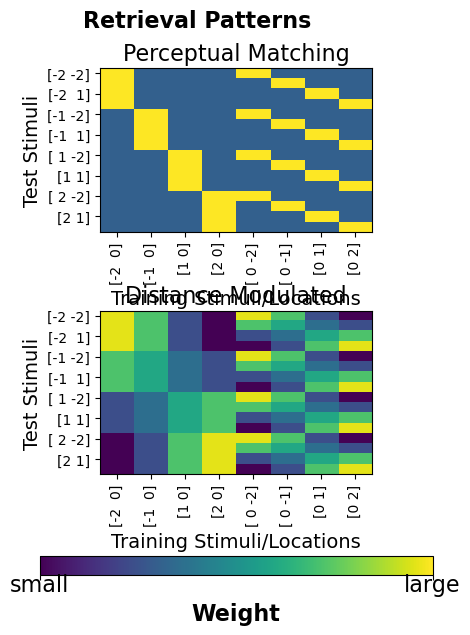

In [43]:
cb =fig.colorbar(im1, ax=axes,orientation="horizontal", fraction = 0.1)
cb.set_label(label='Weight',weight='bold',fontsize=16)
cb.set_ticks(ticks=[np.min([pmodel,dmodel]), np.max([pmodel,dmodel])],
             labels=["small","large"],fontsize=16,rotation=0,va="center")
cb.ax.yaxis.set_tick_params(pad=10)
fig

In [87]:
compositionretrieval_resdf.metricname.unique()

array(['fit_corr_O2E', 'eval_corr_O2E', 'fit_corr_E2O', 'eval_corr_E2O',
       'fit_r2', 'eval_r2', 'fit_corr', 'eval_corr', 'reg_distmod',
       'reg_percept', 'compoweight_x', 'compoweight_y', 'compoweight',
       'noncompoweight_x', 'noncompoweight_y', 'noncompoweight',
       'meanweightdiff', 'sumweightdiff'], dtype=object)

c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\scipy\stats\_resampling.py:992: RuntimeWarning: overflow encountered in scalar power
  n_max = factorial(n_obs_sample)**n_samples


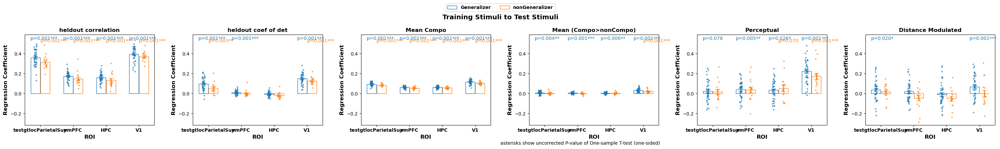

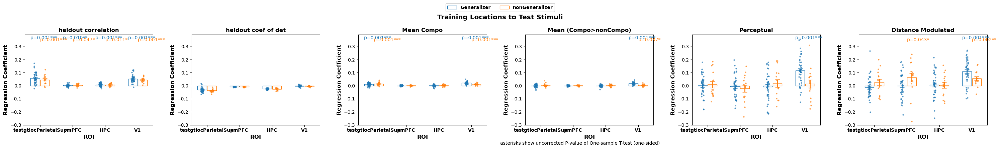

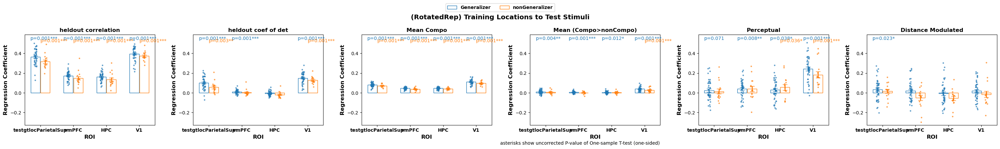

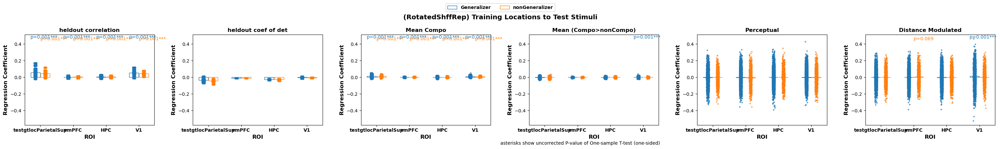

In [236]:
xvar, gvar, yvar, yvartest = "region",  "subgroup", "value", "value"
plt_mts = ["eval_corr","eval_r2","compoweight","meanweightdiff","reg_percept","reg_distmod"]
facet_names = dict(zip(plt_mts,["heldout correlation","heldout coef of det","Mean Compo","Mean (Compo>nonCompo)","Perceptual", "Distance Modulated"]))
plt_ana = dict(zip(["train2test","loc2test"]+["Rloc2test","RSloc2test"], #,"loc2train","loc2test"
                   [
                    "Training Stimuli to Test Stimuli", 
                    #"Training Locations to Training Stimuli",
                    "Training Locations to Test Stimuli"
                   ]+[
                       "(RotatedRep) Training Locations to Test Stimuli",
                       "(RotatedShffRep) Training Locations to Test Stimuli"]))
for a, atitle in plt_ana.items():
    curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)].copy()
    curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
    curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar],categories=curr_pdf[xvar].unique(),ordered=True)
    fig,axes = grouped_barscatter_withstats(curr_pdf,
                                facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                prows=1,pcols=len(plt_mts),
                                hrow=4,wcol=5,
                                statfunc=lambda yt: ttest1samp_equiv_permutation(yt,alternative="greater",n_perm=1000))
    for ifacet, _ in enumerate(axes.flatten()):
        axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
        oldtitle = axes.flatten()[ifacet].title.get_text()
        axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
        
    hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
    fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
            prop = dict(weight="bold"))
    fig.suptitle(f"{atitle}",fontweight="bold",fontsize="x-large")
    fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of One-sample T-test (one-sided)')
    fig.tight_layout()


c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\scipy\stats\_resampling.py:992: RuntimeWarning: overflow encountered in scalar power
  n_max = factorial(n_obs_sample)**n_samples


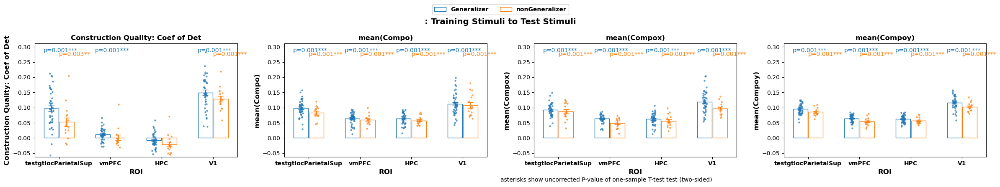

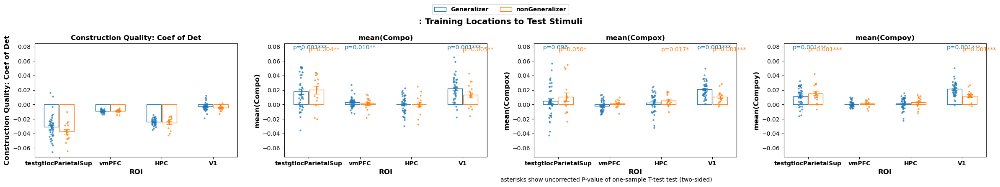

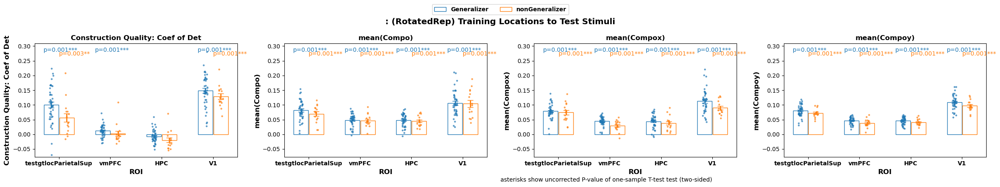

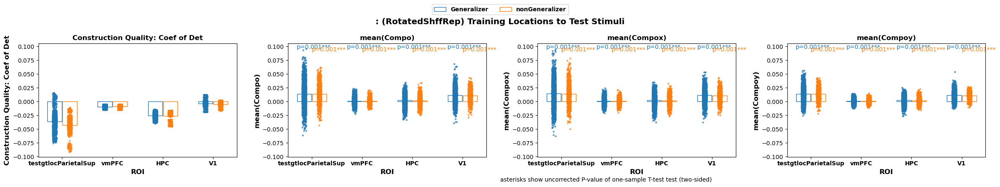

In [237]:
# sanity check, see if coefficient of Compo is greater than zero, and if compo>noncompo
xvar, gvar, yvar, yvartest = "region",  "subgroup", "value", "value"
plt_mts = ["eval_r2","compoweight_x","compoweight_y","compoweight"] #"eval_corr",
facet_names = dict(zip(plt_mts,
                       ["Construction Quality: Coef of Det",# "Construction Quality: Cor",
                        "mean(Compo)", "mean(Compox)", "mean(Compoy)"]))
plt_ana = dict(zip(["train2test","loc2test"]+["Rloc2test","RSloc2test"],
                   ["Training Stimuli to Test Stimuli", #"Training Locations to Training Stimuli",
                     "Training Locations to Test Stimuli"]+[
                         "(RotatedRep) Training Locations to Test Stimuli",
                         "(RotatedShffRep) Training Locations to Test Stimuli"]))
sname,slist ="",subid_list
for a, atitle in plt_ana.items():
    curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
    curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
    curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar],categories=curr_pdf[xvar].unique(),ordered=True)
    fig,axes = grouped_barscatter_withstats(curr_pdf,
                                facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                prows=1,pcols=len(plt_mts),
                                hrow=4,wcol=6,
                                statfunc=lambda yt: ttest1samp_equiv_permutation(yt,alternative="greater",n_perm=1000))
    for ifacet, _ in enumerate(axes.flatten()):
        oldtitle = axes.flatten()[ifacet].title.get_text()
        axes.flatten()[ifacet].set_ylabel(facet_names[oldtitle],fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
        
    hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
    fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
            prop = dict(weight="bold"))
    fig.suptitle(f"{sname}: {atitle}",fontweight="bold",fontsize="x-large")
    fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of one-sample T-test test (two-sided)')
    fig.tight_layout()


c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\scipy\stats\_resampling.py:992: RuntimeWarning: overflow encountered in scalar power
  n_max = factorial(n_obs_sample)**n_samples


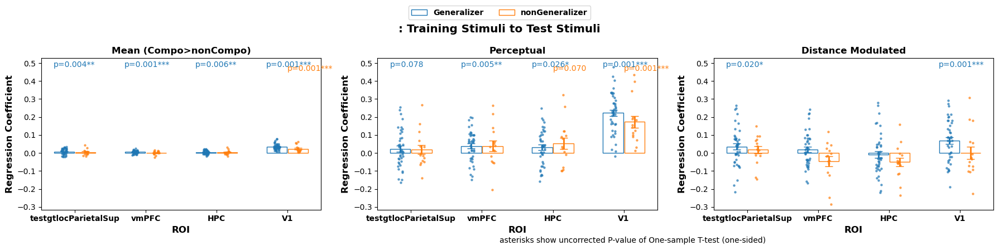

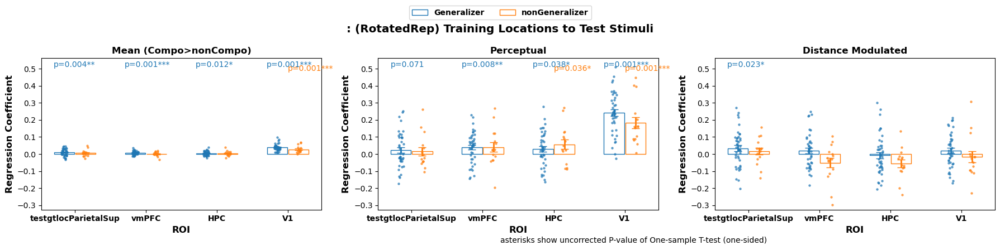

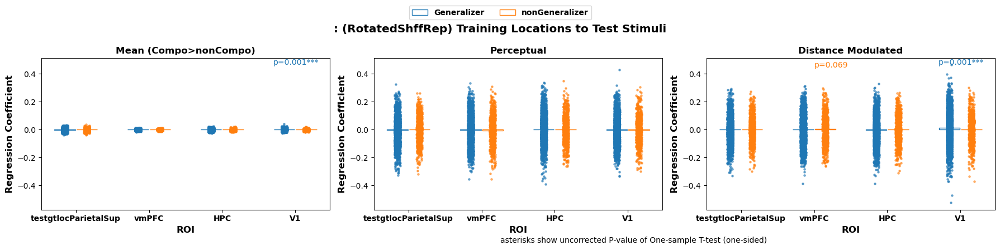

In [238]:
xvar, gvar, yvar, yvartest = "region",  "subgroup", "value", "value"
plt_mts = ["meanweightdiff","reg_percept","reg_distmod"]
facet_names = dict(zip(plt_mts,["Mean (Compo>nonCompo)","Perceptual", "Distance Modulated"]))
plt_ana = dict(zip(["train2test"]+["Rloc2test","RSloc2test"], #,"loc2train","loc2test"
                   ["Training Stimuli to Test Stimuli"#, 
                    #"Training Locations to Training Stimuli",
                    #"Training Locations to Test Stimuli"
                   ]+[
                       "(RotatedRep) Training Locations to Test Stimuli",
                       "(RotatedShffRep) Training Locations to Test Stimuli"]))
for a, atitle in plt_ana.items():
    curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
    curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
    curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar],categories=curr_pdf[xvar].unique(),ordered=True)
    fig,axes = grouped_barscatter_withstats(curr_pdf,
                                facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                prows=1,pcols=len(plt_mts),
                                hrow=4,wcol=6,
                                statfunc=lambda yt: ttest1samp_equiv_permutation(yt,alternative="greater",n_perm=1000))
    for ifacet, _ in enumerate(axes.flatten()):
        axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
        oldtitle = axes.flatten()[ifacet].title.get_text()
        axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
        
    hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
    fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
            prop = dict(weight="bold"))
    fig.suptitle(f"{sname}: {atitle}",fontweight="bold",fontsize="x-large")
    fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of One-sample T-test (one-sided)')
    fig.tight_layout()


In [239]:
train2testencoding_resdf["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in train2testencoding_resdf["subid"]]
print(train2testencoding_resdf.columns)
train2testencoding_resdf["highD"] = [1 if x>1 else 0 for x in train2testencoding_resdf["est_dim"]]
reganalysisdf = train2testencoding_resdf[(train2testencoding_resdf.subgroup=="Generalizer")&(train2testencoding_resdf.roi=="vmPFC_bilateral")].copy().query("anagroup=='train2test' and metricname=='reg_percept'").copy()
reganalysisdf['z_reconstruction_corr'] = np.arctanh(reganalysisdf['reconstruction_corr'])
ols_res = smf.ols('value ~ highD + z_reconstruction_corr',
       data=reganalysisdf,
       ).fit()
print(ols_res.summary())


Index(['value', 'metric', 'roi', 'subid', 'dataset', 'perm', 'analysis',
       'metricname', 'anagroup', 'region', 'est_dim', 'reconstruction_corr',
       'subgroup'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:                  value   R-squared:                       0.117
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     5.183
Date:                Tue, 01 Apr 2025   Prob (F-statistic):             0.0284
Time:                        14:54:16   Log-Likelihood:                 44.645
No. Observations:                  41   AIC:                            -85.29
Df Residuals:                      39   BIC:                            -81.86
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  

0.00019998000199980003
0.0013998600139986002
0.0005999400059994001
0.9605039496050395
0.16398360163983602
0.04179582041795821
0.0081991800819918
0.22297770222977703


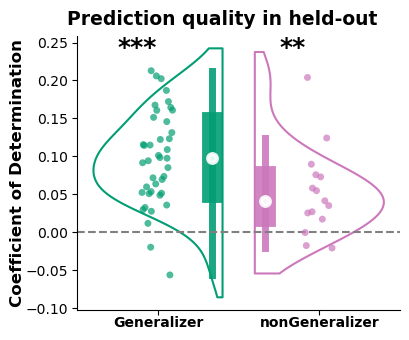

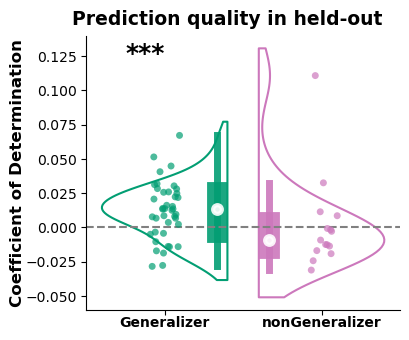

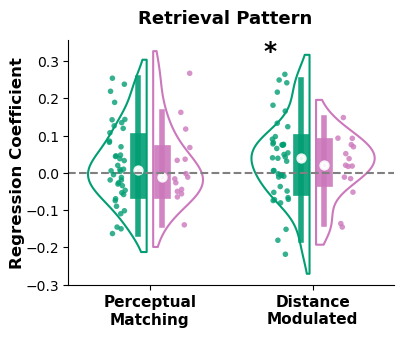

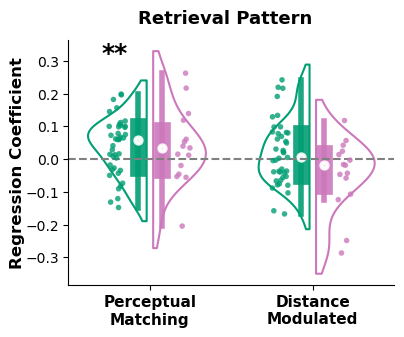

In [70]:
for roi in ["testgtlocParietalSup_bilateral","vmPFC_bilateral"]:
    compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi==roi)].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
    pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight','eval_r2']))].copy()

    pdf["metricname"] = pd.Categorical(
        pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
        categories=["Coefficient of Determination"],ordered=True
    )

    gs = sns.catplot(data=pdf,
                x="subgroup",y="value",
                col="metricname",
                hue="subgroup",palette=participantgrouphex,
                #kind="bar",errorbar="se",fill=True,alpha=0.2,dodge=False,
                kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
                inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                height=3.5,aspect=1.2,sharey=False,
                ).set_titles("{col_name}").refline(y=0)
    gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                    #color="grey",
                    hue="subgroup",palette=participantgrouphex,dodge=False,
                    alpha=0.7)


    for ax in gs.axes.flatten():
        axdf = pdf[pdf.metricname==ax.title.get_text()]
        ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
        ax.set_xlabel('')
        #ax.set_xticks([-.25,.25],["Generalizer","nonGeneralizer"],fontweight="bold",fontsize=12)
        plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,
                rotation=0,ha="center")
        ax.tick_params(axis='x', which='major', pad=1)
                
        ax.set_title('')
        for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
            pval = ttest1samp_equiv_permutation(tardf.value.values)
            print(pval)
            ax.text(x=j-0.25,y=1.1*axdf.value.max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
    gs.axes.flatten()[0].set_title("Prediction quality in held-out",fontweight="bold",fontsize=13.5,x=0.45,y=1.01)
    #ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
    #sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.9),ncol=2)
    #gs.legend.remove()
    #gs.figure.suptitle("Prediction quality in held-out",fontweight="bold",fontsize=14,y=0.95,x=0.35)
    gs.tight_layout()
    #gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)
    #inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),

for roi in ["testgtlocParietalSup_bilateral","vmPFC_bilateral"]:
    compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi==roi)].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
    pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()

    pdf["metricname"] = pd.Categorical(
        pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
        categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
    )

    gs = sns.catplot(data=pdf,
                x="metricname",y="value",
                hue="subgroup",palette=participantgrouphex,
                #kind="bar",errorbar="se",fill=True,alpha=0.2,
                kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                height=3.5,aspect=1.2
                ).refline(y=0)
    gs.map_dataframe(sns.stripplot,x="metricname",y="value",
                    jitter=0.1,
                    hue="subgroup",palette=participantgrouphex,dodge=True,
                    alpha=0.8,s=4
                    )


    for ax in gs.axes.flatten():
        ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=12,labelpad=0)
        ax.set_xlabel("")
        plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,rotation=0)
        for j,(tar,tardf) in enumerate(pdf.groupby(["metricname","subgroup"])):
            if tar[1]=="Generalizer":
                pval = ttest1samp_equiv_permutation(tardf.value.values)
                print(pval)
                minorplus = 1*((j%2)==1)
                dw = [-.3,0.15][minorplus]
                ax.text(x=np.floor(j/2)+dw,y=1.15*pdf.value.max(),
                        s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                        size=18,fontweight="bold")
        
    #ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
    #sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
    #gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
    gs.legend.remove()
    gs.figure.suptitle("Retrieval Pattern",fontweight="bold",fontsize=13,y=0.95,x=0.4)
    gs.tight_layout()


## correlation between RDM from different task

In [916]:
loadedres = load(os.path.join(ROIRSAdir,"tsloc_rdmcorr","TSLZERcorr.pkl"))
print(loadedres.keys())
TRcorr_res_df = loadedres["TRLZERcorr"]
TEcorr_res_df = loadedres["TELZERcorr"]
cross_corr_res_df = loadedres["corrclfacc"]
TEcompocorr_res_df = loadedres["TEcompoLZERcorr"]

TEcorr_res_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TEcorr_res_df["subid"]]
TRcorr_res_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TRcorr_res_df["subid"]]
cross_corr_res_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in cross_corr_res_df["subid"]]
TEcompocorr_res_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TEcompocorr_res_df["subid"]]

dict_keys(['TEcompoLZERcorr', 'TRLZERcorr', 'TELZERcorr', 'corrclfacc'])


In [ ]:
TRcorr_res_df.columns


Index(['tssim2loc', 'tssim2euc', 'locsim2euc', 'subid', 'roi'], dtype='object')

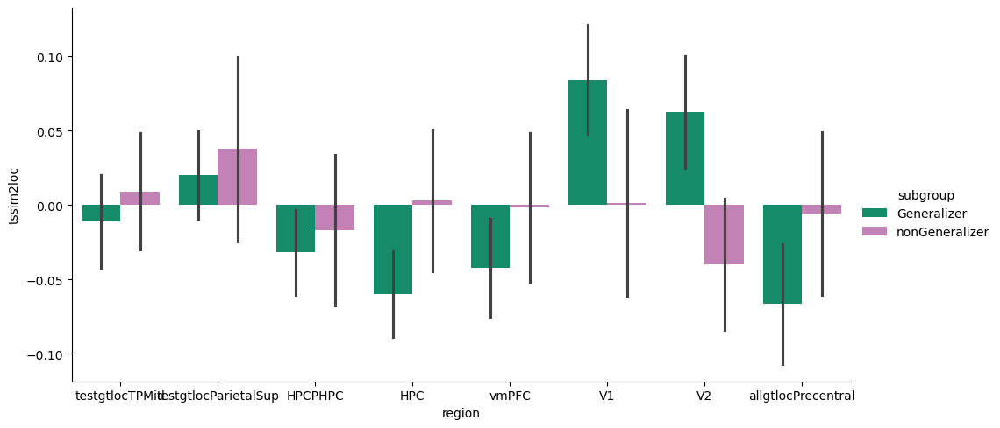

In [870]:
TRcorr_res_df["region"] = [x.split("_")[0] for x in TRcorr_res_df.roi]
sns.catplot(data=TRcorr_res_df,x="region",y="tssim2loc",
            hue="subgroup",palette=participantgrouphex,
            #col="tarvar",
            kind="bar", errorbar="se",
            aspect=2)

In [818]:
TEcorr_res_df.columns

Index(['tssim2loc', 'tssim2euc', 'locsim2euc', 'subid', 'tarvar', 'roi',
       'subgroup', 'region'],
      dtype='object')

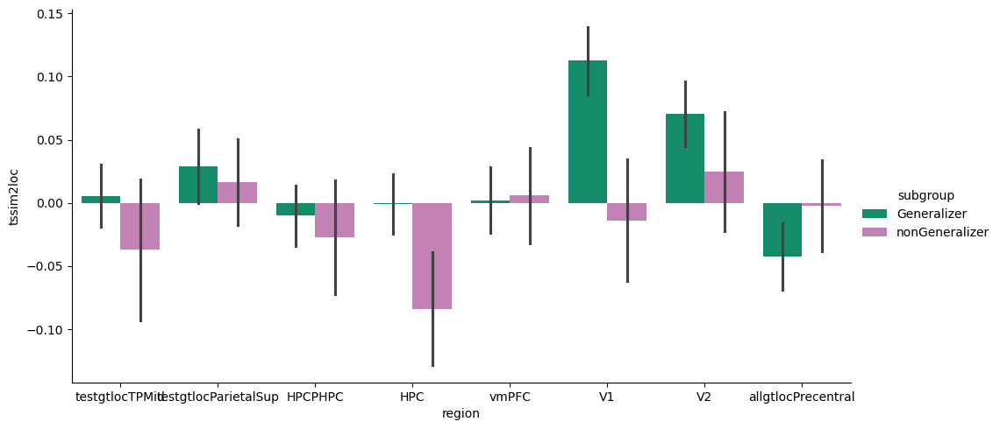

In [871]:
TEcorr_res_df["region"] = [x.split("_")[0] for x in TEcorr_res_df.roi]
sns.catplot(data=TEcorr_res_df,x="region",y="tssim2loc",#tssim2loc",
            hue="subgroup",palette=participantgrouphex,
            #col="tarvar",
            kind="bar", errorbar="se",
            aspect=2)

In [ ]:
TEcompocorr_res_df["region"] = [x.split("_")[0] for x in TEcompocorr_res_df.roi]
sns.catplot(data=TEcompocorr_res_df,x="region",y="corr",#tssim2loc",
            hue="subgroup",palette=participantgrouphex,
            #col="axis",
            kind="bar", errorbar="se",
            aspect=2)

In [917]:
TEcompocorr_res_df.columns
TEcompocorr_res_df_long = pd.melt(
        TEcompocorr_res_df,
        id_vars=["subid","roi","subgroup"],
        value_vars=["xcoef","ycoef","compocoef"],#"ftcoef2"
        var_name="predictor",value_name="coef"
        )

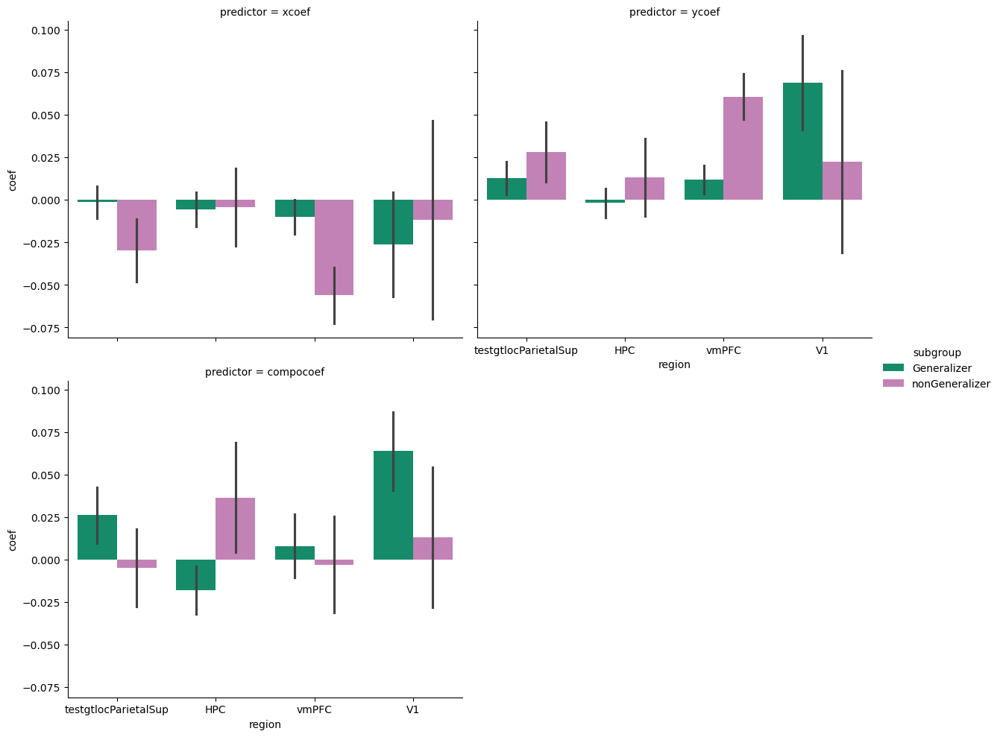

In [918]:
TEcompocorr_res_df_long["region"] = [x.split("_")[0] for x in TEcompocorr_res_df_long.roi]
TEcompocorr_res_df_long = TEcompocorr_res_df_long[TEcompocorr_res_df_long.region.isin(["HPC","V1","vmPFC","testgtlocParietalSup"])].copy()
sns.catplot(data=TEcompocorr_res_df_long,x="region",y="coef",#tssim2loc",
            hue="subgroup",palette=participantgrouphex,
            col="predictor",col_wrap=2,
            kind="bar", errorbar="se",
            aspect=1.2)

# TEcompocorr_res_df_long = TEcompocorr_res_df_long.groupby(["subid","roi"])["coef"].mean().reset_index()
# TEcompocorr_res_df_long["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TEcompocorr_res_df_long["subid"]]
# TEcompocorr_res_df_long["region"] = [x.split("_")[0] for x in TEcompocorr_res_df_long.roi]
# sns.catplot(data=TEcompocorr_res_df_long,x="region",y="coef",#tssim2loc",
#             hue="subgroup",palette=participantgrouphex,
#             #col="axis",
#             kind="bar", errorbar="se",
#             aspect=2)

In [806]:
cross_corr_res_df.columns

Index(['corrclfacc', 'subid', 'tarvar', 'roi', 'subgroup'], dtype='object')

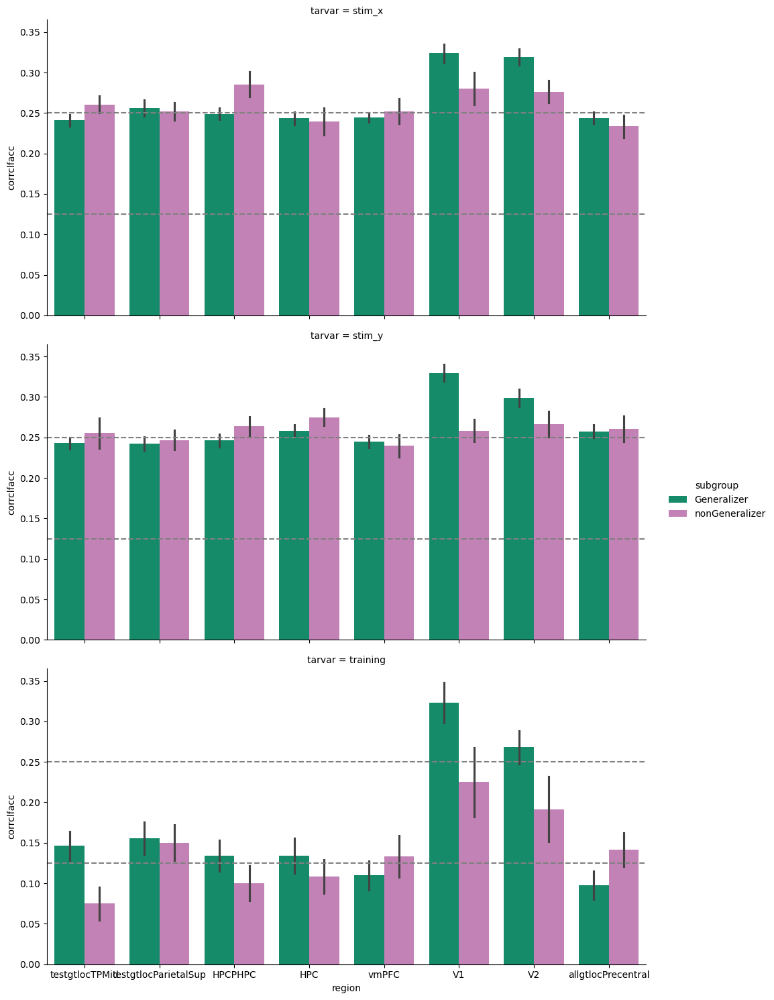

In [847]:
cross_corr_res_df["region"] = [x.split("_")[0] for x in cross_corr_res_df.roi]
sns.catplot(data=cross_corr_res_df,x="region",y="corrclfacc",
            hue="subgroup",palette=participantgrouphex,
            row="tarvar",
            kind="bar", errorbar="se",
            aspect=2).refline(y=1/8).refline(y=1/4)

# Plot for HPC

### distribution of dimensionality

In [107]:
svdestdim_df_sum.roi.unique()

['testgtlocTPMid_bilateral', 'testgtlocParietalSup_bilateral', 'HPCPHPC_bilateral', 'HPC_bilateral', 'vmPFC_bilateral', ..., 'HPC_right', 'vmPFC_right', 'V1_right', 'V2_right', 'allgtlocPrecentral_left']
Length: 20
Categories (20, object): ['testgtlocTPMid_bilateral' < 'testgtlocParietalSup_bilateral' < 'HPCPHPC_bilateral' < 'HPC_bilateral' ... 'vmPFC_right' < 'V1_right' < 'V2_right' < 'allgtlocPrecentral_left']

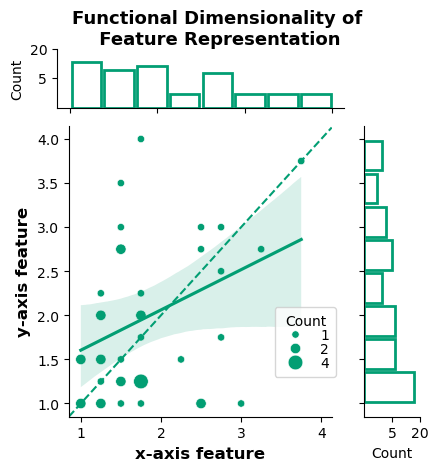

In [294]:
pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.roi==f"HPC_bilateral")].copy()

pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
    
pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')

dot_color=  colors.hex2color(participantgrouphex["Generalizer"])
gs = sns.JointGrid(data=pdf_counts, x="x axis", y="y axis",
                   marginal_ticks=True,ratio=4,space=0.,height=5)
sns.scatterplot(pdf_counts,
                x="x axis",
                y="y axis",
                size="counts",
                sizes=dict(zip(
                    np.sort(pdf_counts["counts"].unique()),
                    (np.exp2(np.arange(pdf_counts["counts"].nunique())+2))*7         
                    )), 
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,
                ax=gs.ax_joint
                )

gs.ax_joint.set_aspect(1.1)

sns.histplot(x="x axis", 
             fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_x,kde=False, color=dot_color,data=pdf_wide
             )
gs.ax_marg_x.set_yscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_x.set_yticks([5,20])
sns.histplot(y="y axis", fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_y,kde=False, color=dot_color,data=pdf_wide)
gs.ax_marg_y.set_xscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_y.set_xticks([5,20])

handles, labels = gs.ax_joint.get_legend_handles_labels()
for handle in handles:
    handle.set_color(dot_color)
gs.ax_joint.legend(handles=handles,#[handles[1],handles[3],handles[-1]],
                   labels=labels,#[labels[1],labels[3],labels[-1]], 
                   title="Count",
                   labelspacing=0,
                   borderpad=0.5,
                   loc="upper center",bbox_to_anchor=(0.9,0.4))

sns.regplot(data=pdf_counts, x="x axis", y="y axis",scatter=False,ax=gs.ax_joint,color=dot_color,ci=95, n_boot=10000)
gs.ax_joint.axline((1,1),slope=1,color=dot_color,linestyle="--")

gs.ax_joint.set_xlabel("x-axis feature",fontdict={"fontsize":12,"fontweight":"bold"})
gs.ax_joint.set_ylabel("y-axis feature",fontdict={"fontsize":12,"fontweight":"bold"})
gs.fig.set_figwidth(5/1.1)
gs.fig.set_figheight(5)
jointax_pos = gs.ax_joint.get_position()
xmargax_pos = gs.ax_marg_x.get_position()
ymargax_pos = gs.ax_marg_y.get_position()
gs.ax_marg_x.set_position([jointax_pos.x0,xmargax_pos.y0,jointax_pos.width,xmargax_pos.height])
gs.ax_marg_y.set_position([ymargax_pos.x0,jointax_pos.y0,ymargax_pos.width,jointax_pos.height])
gs.figure.suptitle("Functional Dimensionality of\n Feature Representation",fontsize=13,fontweight="bold",y=0.93)
gs.figure.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"HPChighdim","HPC_dimonaxis_xydistscatter.png"),dpi=300)

In [1173]:
pdf

,roi,subid,dimonaxis,est_dim,reconstruction_corr,reconstruction_r2,run,region,side,subgroup,subcohort
0,testgtlocTPMid_bilateral,sub001,x axis,1.50,0.027326,-1.608429,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
1,testgtlocTPMid_bilateral,sub001,y axis,2.50,0.011305,-2.302037,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
4,testgtlocTPMid_bilateral,sub003,x axis,2.00,0.135556,-1.997085,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
5,testgtlocTPMid_bilateral,sub003,y axis,2.50,0.074227,-1.671650,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
8,testgtlocTPMid_bilateral,sub005,x axis,2.50,-0.044852,-3.898072,1.5,testgtlocTPMid,bilateral,Generalizer,first cohort
...,...,...,...,...,...,...,...,...,...,...,...
2181,allgtlocPrecentral_left,sub028,y axis,1.25,0.104310,-1.452591,1.5,allgtlocPrecentral,left,Generalizer,first cohort
2182,allgtlocPrecentral_left,sub029,x axis,1.25,0.043595,-1.717744,1.5,allgtlocPrecentral,left,Generalizer,first cohort
2183,allgtlocPrecentral_left,sub029,y axis,1.50,0.075060,-1.843597,1.5,allgtlocPrecentral,left,Generalizer,first cohort
2184,allgtlocPrecentral_left,sub030,x axis,1.50,0.107489,-2.056893,1.5,allgtlocPrecentral,left,Generalizer,first cohort


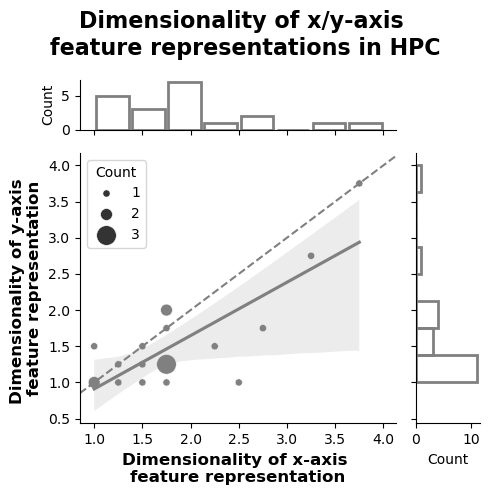

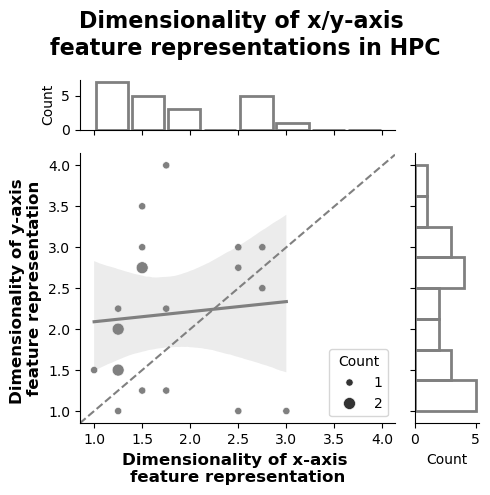

In [1174]:
for slist in [cohort1ids,cohort2ids]:
    pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.subid.isin(slist))&(svdestdim_df_sum.roi==f"HPC_bilateral")].copy()

    pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
        
    pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')

    gs = sns.JointGrid(data=pdf_counts, x="x axis", y="y axis",marginal_ticks=True,ratio=4,space=0.3,height=5)
    sns.scatterplot(pdf_counts,
                    x="x axis",
                    y="y axis",
                    size="counts",
                    sizes=dict(zip(
                        np.sort(pdf_counts["counts"].unique()),
                        np.exp(np.arange(pdf_counts["counts"].nunique())+1)*10)
                        ), 
                    c="grey",
                    ax=gs.ax_joint
                    )
    sns.histplot(x="x axis", fill=False, linewidth=2, binrange=[1,4], bins=8, element="bars", shrink=0.9, ax=gs.ax_marg_x,kde=False, color="grey",data=pdf_wide)
    sns.histplot(y="y axis", fill=False, linewidth=2, binrange=[1,4], bins=8, element="bars", line_kws={'width':0.1}, ax=gs.ax_marg_y,kde=False, color="grey",data=pdf_wide)

    handles, labels = gs.ax_joint.get_legend_handles_labels()
    for handle in handles:
        handle.set_color("grey")
    gs.ax_joint.legend(handles=handles, labels=labels, title="Count")

    sns.regplot(data=pdf_counts, x="x axis", y="y axis",scatter=False,ax=gs.ax_joint,color="grey",ci=95, n_boot=10000)
    gs.ax_joint.axline((1,1),slope=1,color="grey",linestyle="--")

    gs.ax_joint.set_xlabel("Dimensionality of x-axis \nfeature representation",fontdict={"fontsize":12,"fontweight":"bold"})
    gs.ax_joint.set_ylabel("Dimensionality of y-axis \nfeature representation",fontdict={"fontsize":12,"fontweight":"bold"})

    gs.figure.suptitle("Dimensionality of x/y-axis \nfeature representations in HPC",fontsize=16,fontweight="bold")
    gs.figure.tight_layout()

### correlation between dimensionality and decodability

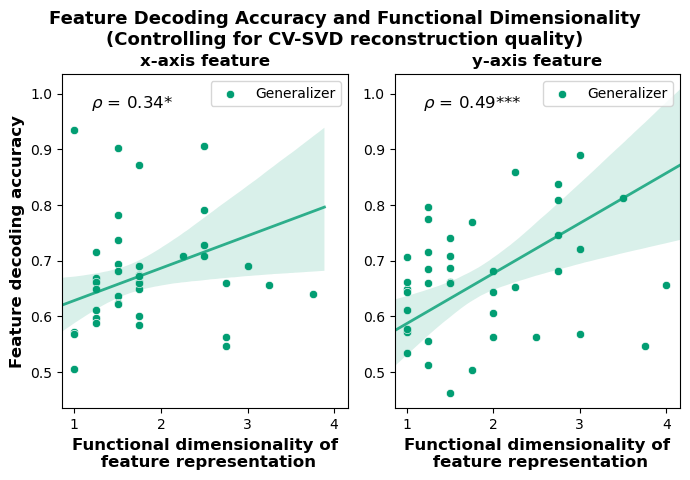

In [137]:
pdf = training_feature_decoding[(training_feature_decoding.subgroup=="Generalizer")&(training_feature_decoding.roi==f"HPC_bilateral")].copy() #(training_feature_decoding.subgroup=="Generalizer")
dot_color=  colors.hex2color(participantgrouphex["Generalizer"])


def partialrankcorr(data,x, y,covar, ax=None,**kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,x_covar=covar,method="pearson",alternative="greater")
    rho,pval = res.r[0], res["p-val"][0]
    ax = ax if ax is not None else plt.gca()
    if pval<=0.05:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}{gen_pval_annot(pval,show_pval=False)}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    else:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)

fig, axes = plt.subplots(1,2,figsize=(7,5),
                         sharey=True,sharex=True)
for ax, (gname,gdf) in zip(axes, pdf.groupby("dimonaxis")): 
    
    sns.scatterplot(data=pdf[pdf.dimonaxis==gname].copy(),
                    x="est_dim",y="eval_acc",
                    #hue="subgroup",palette=participantgrouphex,
                    color=dot_color,label="Generalizer",
                    ax=ax)
    sns.regplot(data=gdf,
                x="est_dim",y="eval_acc",
                scatter=False,truncate=False,
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,
                line_kws={"alpha":0.8,"linewidth":2},
                x_partial="reconstruction_corr",
                ci=95, n_boot=10000,
                ax=ax)
    partialrankcorr(gdf,"est_dim","eval_acc","reconstruction_corr",ax=ax)

    ax.tick_params(axis='both', which='both', labelsize=10,labelleft=True, labelbottom=True)
    ax.set_ylabel("Feature decoding accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.set_xlabel("Functional dimensionality of\n feature representation",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.set_title("%s feature"%(gname.replace(" ","-")),fontdict={"fontsize":12,"fontweight":"bold"})

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=labels, title="")

fig.suptitle("Feature Decoding Accuracy and Functional Dimensionality\n(Controlling for CV-SVD reconstruction quality)",
                   fontsize=13,fontweight="bold",y=0.95)
fig.tight_layout()
fig.savefig(os.path.join(ROIRSAdir,"HPChighdim","HPC_dimonaxis_corrfeatureDC.png"),dpi=300)

In [ ]:
plt.subplots(1,3,figsize=(15,5))
    
for j,side in enumerate(["bilateral","left","right"]):
    pdf = training_feature_decoding[(training_feature_decoding.subgroup=="Generalizer")&(training_feature_decoding.roi==f"vmPFC_{side}")].copy()

        
    pdf_counts = pdf.groupby(['est_dim', 'eval_acc']).size().reset_index(name='counts')

    plt.subplot(1,3,j+1)
    sns.scatterplot(pdf_counts,
                    x='est_dim',
                    y='eval_acc',
                    size="counts",
                    sizes=dict(zip(
                        np.sort(pdf_counts["counts"].unique()),
                        np.exp(np.arange(pdf_counts["counts"].nunique())+1)*3)
                        ), 
                    c="grey"
                    )
    sns.regplot(pdf,
                x='est_dim',
                y='eval_acc',
                scatter=False,
                x_partial="reconstruction_corr",)

In [ ]:
### f

## train-test separations

('Generalizer',) 0.00019998000199980003
('nonGeneralizer',) 0.00019998000199980003


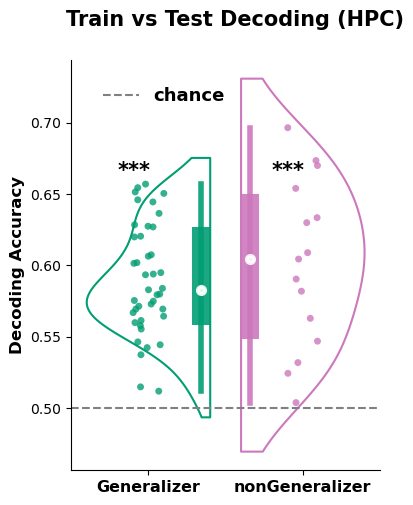

In [317]:
pdf = septraintestdc_performance_df[(septraintestdc_performance_df.roi=="HPC_bilateral")].copy() # &(nclocnavidc_performance_dfsum.subid.isin(generalizers))
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.5

pdf_sum = pdf.groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)


gs = sns.catplot(data=pdf_sum,
            x="subgroup",y="eval_acc",
            kind="violin", fill=False,split=True, gap=0,cut=True,
            inner="box",
            inner_kws = dict(box_width = 13, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),

            hue="subgroup",palette=participantgrouphex,
            #color="white", label=None,
            height=5,aspect=0.8
            )
gs.map_dataframe(sns.stripplot,x="subgroup",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=0.8,
                 hue="subgroup",palette=participantgrouphex,#dodge=True
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11.5,rotation=0)
    ax.axhline(0.5,label="chance",color="grey",ls='--')
    for j, (tar,tardf) in enumerate(pdf_sum.groupby(["subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
        print(tar, pval)
        dw = [-.2,0.0][0]
        ax.text(x=j+dw,y=0.95*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontweight="bold",size=15)
    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[0]],[ls[0]],loc="lower center",bbox_to_anchor=(0.3,0.85),ncol = 2,
            prop = dict(weight="bold",size=13),frameon=False)  
  
gs.figure.suptitle("Train vs Test Decoding (HPC)",fontweight="bold",fontsize=15,x=0.6,y=1)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"HPChighdim","traintest_separation.png"),dpi=300)

## sharing of embedding space in high D

#### train2test decoder performance

In [ ]:
nctrtesstimdc_performance_df.roi.unique()

('stim_x', 'Generalizer') 0.5669433056694331
('stim_x', 'nonGeneralizer') 0.0425957404259574
('stim_y', 'Generalizer') 0.09299070092990701
('stim_y', 'nonGeneralizer') 0.20517948205179481


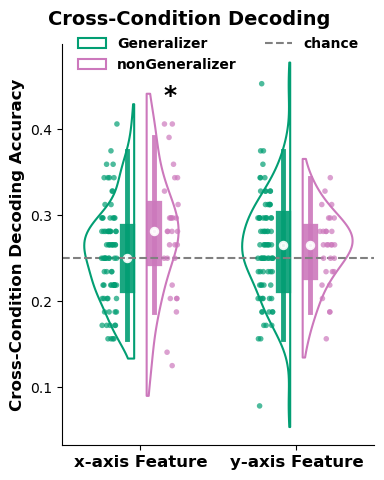

In [1245]:
pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("HPC"))].copy() # &(nctrtesstimdc_performance_df.subid.isin(generalizers))

pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.25

pdf_sum = pdf.groupby(["roi","subid","target","heldouttype"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))&(pdf_sum.heldouttype=="train2test")].copy().reset_index(drop=True)
pdf_sum["target"] = pd.Categorical(pdf_sum["target"],categories=["stim_x","stim_y"],ordered=True)

gs = sns.catplot(data=pdf_sum,
            x="target",y="eval_acc",
            kind="violin", inner="box", fill=False,split=True, gap=0.2,cut=True,
            inner_kws = dict(box_width = 11, whis_width=3.5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            hue="subgroup",palette=participantgrouphex,
            height=5,aspect=0.8
            )
gs.map_dataframe(sns.stripplot,x="target",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=0.7,size=4,jitter=0.1,
                 hue="subgroup",palette=participantgrouphex,dodge=True
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    ax.set_xticks([0,1],["x-axis Feature","y-axis Feature"],fontweight="bold",fontsize=12,rotation=0,ha="center")
    ax.axhline(0.25,label="chance",color="grey",ls='--')
    for j, (tar,tardf) in enumerate(pdf_sum.groupby(["target","subgroup"])):
       # if tar[1] == "Generalizer":
        #pval = scipy.stats.ttest_1samp(tardf.eval_acc_above_chance.values,0,alternative='two-sided').pvalue
        pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
        print(tar, pval)
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        ax.text(x=np.floor(j/2)+dw,y=0.95*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="lower center",bbox_to_anchor=(0.5,0.9),ncol = 2,
            prop = dict(weight="bold"),frameon=False)  
  
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.legend.remove()
gs.figure.suptitle("Cross-Condition Decoding",fontweight="bold",fontsize=14,x=0.35,y=0.95)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"HPChighdim","HPC_traintestCCGP.png"),dpi=300)

#### Predicting test pattern from training stimuli 

0.0347965203479652
0.032596740325967405
0.00019998000199980003
0.00019998000199980003


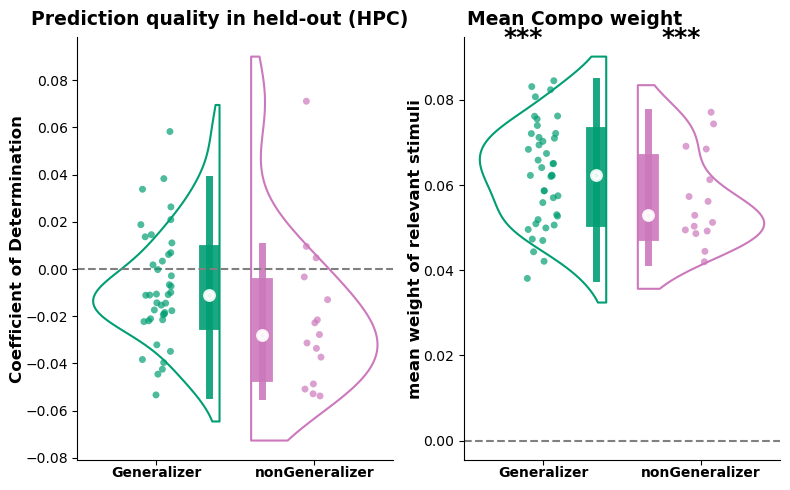

In [321]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="HPC_bilateral")].copy() 
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight','eval_r2']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination",
                        "compoweight":"mean weight of relevant stimuli"}),
    categories=["Coefficient of Determination","mean weight of relevant stimuli"],ordered=True
)


# pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight']))].copy()

# pdf["metricname"] = pd.Categorical(
#     pdf.metricname.map({"compoweight":"Mean weight of relevant stimuli"}),
#     categories=["Mean weight of relevant stimuli"],ordered=True
# )

# pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()

# pdf["metricname"] = pd.Categorical(
#     pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
#     categories=["Coefficient of Determination"],ordered=True
# )

gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="metricname",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,dodge=False,
            kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=5,aspect=0.8,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.metricname==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    #ax.set_xticks([-.25,.25],["Generalizer","nonGeneralizer"],fontweight="bold",fontsize=12)
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,
             rotation=0,ha="center")
    ax.tick_params(axis='x', which='major', pad=1)
             
    ax.set_title('')
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(pval)
        if np.mean(tardf.value.values)>0:
            ax.text(x=j-0.25,y=1.1*axdf.value.max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
gs.axes.flatten()[0].set_title("Prediction quality in held-out (HPC)",fontweight="bold",fontsize=13.5,x=0.45,y=1.01)
gs.axes.flatten()[1].set_title("Mean Compo weight",fontweight="bold",fontsize=13.5,x=0.35,y=1.01)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"HPChighdim","HPC_trteEncodingSC.png"),dpi=300)


# Plot for V1

### distribution of dimensionality

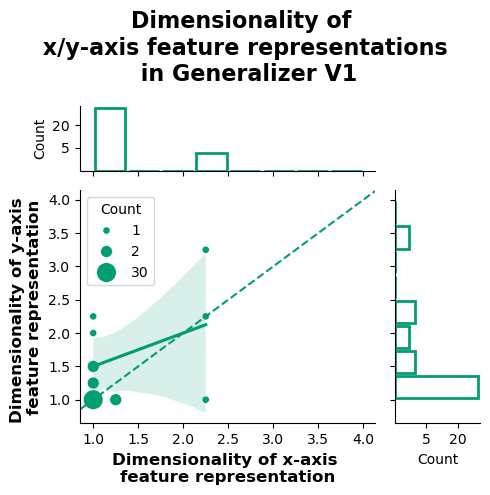

In [293]:
pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.roi==f"V1_bilateral")].copy() #

pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')

dot_color=  colors.hex2color(participantgrouphex["Generalizer"])
gs = sns.JointGrid(data=pdf_counts, x="x axis", y="y axis",marginal_ticks=True,ratio=3,space=0.3,height=5)
sns.scatterplot(pdf_counts,
                x="x axis",
                y="y axis",
                size="counts",
                sizes=dict(zip(
                    np.sort(pdf_counts["counts"].unique()),
                    np.exp(np.arange(pdf_counts["counts"].nunique())+1)*10)
                    ), 
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,
                ax=gs.ax_joint
                )
sns.histplot(x="x axis", 
             fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_x,kde=False, color=dot_color,data=pdf_wide
             )
gs.ax_marg_x.set_yscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_x.set_yticks([5,20])
sns.histplot(y="y axis", fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_y,kde=False, color=dot_color,data=pdf_wide)
gs.ax_marg_y.set_xscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_y.set_xticks([5,20])

handles, labels = gs.ax_joint.get_legend_handles_labels()
for handle in handles:
    handle.set_color(dot_color)
gs.ax_joint.legend(handles=handles, labels=labels, title="Count")

sns.regplot(data=pdf_counts, x="x axis", y="y axis",scatter=False,ax=gs.ax_joint,color=dot_color,ci=95, n_boot=10000)
gs.ax_joint.axline((1,1),slope=1,color=dot_color,linestyle="--")

gs.ax_joint.set_xlabel("Dimensionality of x-axis \nfeature representation",fontdict={"fontsize":12,"fontweight":"bold"})
gs.ax_joint.set_ylabel("Dimensionality of y-axis \nfeature representation",fontdict={"fontsize":12,"fontweight":"bold"})

gs.figure.suptitle("Dimensionality of \n x/y-axis feature representations \n in Generalizer V1",fontsize=16,fontweight="bold")
gs.figure.tight_layout()
checkdir(os.path.join(ROIRSAdir,"V1lowdim"))
gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_dimonaxis_xydistscatter.png"),dpi=300)

### sharing of embedding space in low D

#### train2test decoder performance

In [ ]:
nctrtesstimdc_performance_df.roi.unique()

('stim_x', 'Generalizer') 0.00019998000199980003
('stim_x', 'nonGeneralizer') 0.0221977802219778
('stim_y', 'Generalizer') 0.00019998000199980003
('stim_y', 'nonGeneralizer') 0.013798620137986202


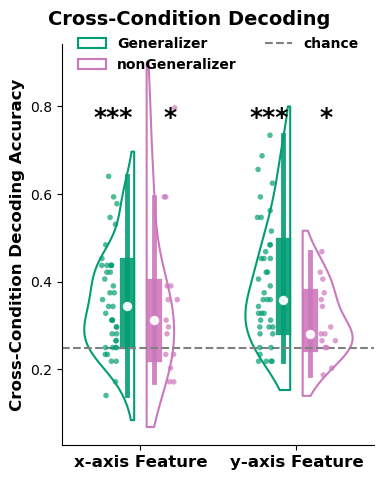

In [264]:
pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("V1"))].copy() # &(nctrtesstimdc_performance_df.subid.isin(generalizers))
#pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("HPC"))].copy()
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.25

pdf_sum = pdf.groupby(["roi","subid","target","heldouttype"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))&(pdf_sum.heldouttype=="train2test")].copy().reset_index(drop=True)
pdf_sum["target"] = pd.Categorical(pdf_sum["target"],categories=["stim_x","stim_y"],ordered=True)

gs = sns.catplot(data=pdf_sum,
            x="target",y="eval_acc",
            kind="violin", inner="box", fill=False,split=True, gap=0.2,cut=True,
            inner_kws = dict(box_width = 11, whis_width=3.5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            hue="subgroup",palette=participantgrouphex,
            height=5,aspect=0.8
            )
gs.map_dataframe(sns.stripplot,x="target",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=0.7,size=4,jitter=0.1,
                 hue="subgroup",palette=participantgrouphex,dodge=True
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    ax.set_xticks([0,1],["x-axis Feature","y-axis Feature"],fontweight="bold",fontsize=12,rotation=0,ha="center")
    ax.axhline(0.25,label="chance",color="grey",ls='--')
    for j, (tar,tardf) in enumerate(pdf_sum.groupby(["target","subgroup"])):
       # if tar[1] == "Generalizer":
        #pval = scipy.stats.ttest_1samp(tardf.eval_acc_above_chance.values,0,alternative='two-sided').pvalue
        pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
        print(tar, pval)
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        ax.text(x=np.floor(j/2)+dw,y=0.95*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="lower center",bbox_to_anchor=(0.5,0.9),ncol = 2,
            prop = dict(weight="bold"),frameon=False)  
  
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.legend.remove()
gs.figure.suptitle("Cross-Condition Decoding",fontweight="bold",fontsize=14,x=0.35,y=0.95)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_traintestCCGP.png"),dpi=300)

#### Predicting test pattern from training stimuli 

In [ ]:
ana = "train2test"
brois = [x for x in rois if "bilateral" in x]
stim_df = roi_data["V1_bilateral"][0]["stimdf"].copy()
test_df = stim_df[stim_df.stim_group==0].copy().reset_index(drop=True)
training_df = stim_df[stim_df.stim_group==1].copy().reset_index(drop=True)
allylabs = (test_df[test_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[training_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,2)

def rescale_mat(mat,newmin=0,newmax=1):
    mat = np.array(mat)
    omin,omax = mat.min(),mat.max()
    return (mat-omin)/(omax-omin)*(newmax-newmin)+newmin

roi = "V1_bilateral"
fig,axes = plt.subplots(2,1,figsize=(4,6))
Gmeanmat = np.mean(reg_coefs[ana][roi]["Generalizer"],axis=0)
nGmeanmat = np.mean(reg_coefs[ana][roi]["nonGeneralizer"],axis=0)

datamats = dict(zip(
    ["Generalizer","nonGeneralizer"],
    [Gmeanmat,nGmeanmat]
))
# create a single norm to be shared across all images
norm = colors.Normalize(vmin=np.min(list(datamats.values())), vmax=np.max(list(datamats.values())))

for j, ((dname,dmat),ax) in enumerate(zip(datamats.items(),axes.flatten())):
    im = ax.imshow(dmat,cmap="viridis",norm=norm)
    ax.set_title(dname,fontsize=16,fontweight="bold",color=participantgrouphex[dname])
    ax.set_xticks(xticksat)
    ax.set_yticks(yticksat)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90,fontsize=10)
    ax.set_yticklabels(allylabs[yticksat],rotation=0,fontsize=10)
    ax.set_xlabel("Training Stimuli",fontsize=14)
    ax.set_ylabel("Test Stimuli",fontsize=14)
    if j < axes.flatten().size-1:
        ax.set_xticks([])
        ax.set_xlabel('')
        
    ax.set_aspect(0.4)
    #cb =fig.colorbar(im, orientation="horizontal", pad = 0.2)
    #cb.set_label(label='Average Weight',weight='bold')

#divider = make_axes_locatable(ax)
#cax = divider.new_vertical(size='5%', pad=0.05, pack_start = True)
#fig.add_axes(cax)
#fig.colorbar(im, cax = cax, orientation = 'horizontal')

fig.suptitle("Average Retrieval Pattern",fontweight="bold",fontsize=16) #Training-to-Test Prediction \n 
fig.tight_layout()

cb =fig.colorbar(im, ax=axes,orientation="vertical", fraction = 0.1)
cb.set_label(label='Average Weight',weight='bold',fontsize=14)




In [ ]:
ana = "loc2test"
brois = [x for x in rois if "bilateral" in x]
stim_df = roi_data["V1_bilateral"][0]["stimdf"].copy()
test_df = stim_df[stim_df.stim_group==0].copy().reset_index(drop=True)
training_df = stim_df[stim_df.stim_group==1].copy().reset_index(drop=True)
allylabs = (test_df[test_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[training_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,2)

def rescale_mat(mat,newmin=0,newmax=1):
    mat = np.array(mat)
    omin,omax = mat.min(),mat.max()
    return (mat-omin)/(omax-omin)*(newmax-newmin)+newmin

roi = "V1_bilateral"
fig,axes = plt.subplots(2,1,figsize=(4,6))
Gmeanmat = np.mean(reg_coefs[ana][roi]["Generalizer"],axis=0)
nGmeanmat = np.mean(reg_coefs[ana][roi]["nonGeneralizer"],axis=0)

datamats = dict(zip(
    ["Generalizer","nonGeneralizer"],
    [Gmeanmat,nGmeanmat]
))
# create a single norm to be shared across all images
norm = colors.Normalize(vmin=np.min(list(datamats.values())), vmax=np.max(list(datamats.values())))

for j, ((dname,dmat),ax) in enumerate(zip(datamats.items(),axes.flatten())):
    im = ax.imshow(dmat,cmap="viridis",norm=norm)
    ax.set_title(dname,fontsize=16,fontweight="bold",color=participantgrouphex[dname])
    ax.set_xticks(xticksat)
    ax.set_yticks(yticksat)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90,fontsize=10)
    ax.set_yticklabels(allylabs[yticksat],rotation=0,fontsize=10)
    ax.set_xlabel("Locations",fontsize=14)
    ax.set_ylabel("Test Stimuli",fontsize=14)
    if j < axes.flatten().size-1:
        ax.set_xticks([])
        ax.set_xlabel('')
        
    ax.set_aspect(0.4)
    #cb =fig.colorbar(im, orientation="horizontal", pad = 0.2)
    #cb.set_label(label='Average Weight',weight='bold')

#divider = make_axes_locatable(ax)
#cax = divider.new_vertical(size='5%', pad=0.05, pack_start = True)
#fig.add_axes(cax)
#fig.colorbar(im, cax = cax, orientation = 'horizontal')

fig.suptitle("Average Retrieval Pattern",fontweight="bold",fontsize=16) # Location-to-Test Prediction \n 
fig.tight_layout()

cb =fig.colorbar(im, ax=axes,orientation="vertical", fraction = 0.1)
cb.set_label(label='Average Weight',weight='bold',fontsize=14)




('Generalizer',) 0.00019998000199980003
('nonGeneralizer',) 0.00019998000199980003
G>nG 0.16698330166983302
('Generalizer',) 0.00019998000199980003
('nonGeneralizer',) 0.00019998000199980003
G>nG 0.030996900309969003


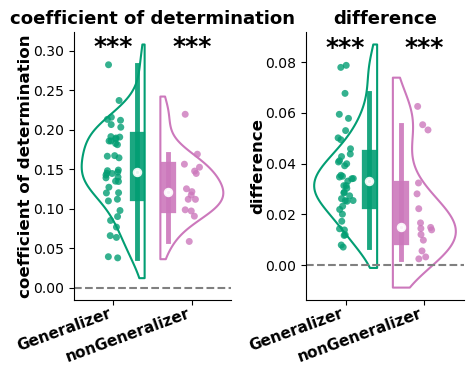

In [ ]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="V1_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))#
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2','meanweightdiff']))].copy()
#'meancompoweight', 'eval_r2
pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"coefficient of determination","meanweightdiff":"difference"}),
    categories=["coefficient of determination","difference"],ordered=True
)

#pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()
#pdf["metricname"] = pd.Categorical(
#    pdf.metricname.map({"eval_r2":"coefficient of determination"}),
#    categories=["coefficient of determination"],ordered=True
#)

gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="metricname",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,dodge=False,
            kind="violin",inner="box",fill=False,split=True,cut=True,
            inner_kws = dict(box_width = 11, whis_width=3.5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            #color="white",label=None,
            height=4,aspect=0.6,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.8)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.metricname==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,
             rotation=20,ha="right")
    ax.tick_params(axis='x', which='major', pad=1)
             
    plt.setp(ax.title,fontweight="bold",fontsize=13,y=1.05)
    for j,(tar,tardf) in enumerate(axdf.groupby(["subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(tar,pval)
        ax.text(x=j-0.25,y=1.05*axdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
    r2G = axdf.query("subgroup=='Generalizer'").value.values
    r2nG = axdf.query("subgroup=='nonGeneralizer'").value.values
    groupp = ttestindsamp_equiv_permutation(r2G,r2nG)
    print("G>nG",groupp)

gs.figure.suptitle("",fontweight="bold",fontsize=14,y=1.03,x=0.5)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_trteEncodingR2.png"),dpi=300)

('Perceptual\nMatching', 'Generalizer') 0.00019998000199980003
('Perceptual\nMatching', 'nonGeneralizer') 0.00019998000199980003
('Distance\nModulated', 'Generalizer') 0.0011998800119988001
('Distance\nModulated', 'nonGeneralizer') 0.9915008499150085


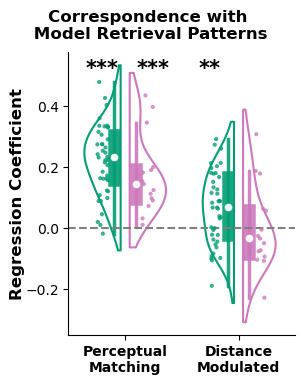

In [ ]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="V1_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            hue="subgroup",palette=participantgrouphex,
            kind="violin",split=True,inner="box",fill=False,gap=0.2,cut=True,
            inner_kws = dict(box_width = 9, whis_width=2.5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.8
            ).refline(y=0)
gs.map_dataframe(sns.stripplot,x="metricname",y="value",
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 alpha=0.8,size=3)


for ax in gs.axes.flatten():
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,rotation=0)
    for j,(tar,tardf) in enumerate(pdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)

        print(tar,pval)
        minorplus = 1*((j%2)==1)
        dw = [-.35,0.1][minorplus]
        ax.text(x=np.floor(j/2)+dw,y=1.05*pdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=15,fontweight="bold")

    
gs.legend.remove()
gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=12,y=0.95,x=0.32)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_trteEncoding.png"),dpi=300)

In [ ]:
compo_retrieve_roisubset_df.metricname.unique()

#### predicting test pattern from localizer

('coefficient of determination', 'Generalizer') 0.00019998000199980003
('coefficient of determination', 'nonGeneralizer') 0.00019998000199980003
0.1988


Text(0.5, 1.03, 'Prediction Quality\nin held-out')

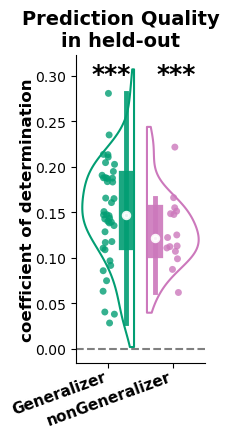

In [ ]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="V1_bilateral")].copy() 
#pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2','meanweightdiff']))].copy()
#'meancompoweight', 'eval_r2
#pdf["metricname"] = pd.Categorical(
#    pdf.metricname.map({"eval_r2":"coefficient of determination","meanweightdiff":"difference"}),
#    categories=["coefficient of determination","difference"],ordered=True
#)
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"coefficient of determination"}),
    categories=["coefficient of determination"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="metricname",
            hue="subgroup",palette=participantgrouphex,
            kind="violin",inner="box",fill=False,split=True,cut=True,
            inner_kws = dict(box_width = 11, whis_width=3.5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.6,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.8)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.metricname==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,
             rotation=20,ha="right")
    ax.tick_params(axis='x', which='major', pad=1)
             
    ax.set_title('')
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(tar,pval)
        ax.text(x=j-0.25,y=1.05*axdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
    r2G = axdf.query("subgroup=='Generalizer' and metricname=='coefficient of determination'").value.values
    r2nG = axdf.query("subgroup=='nonGeneralizer' and metricname=='coefficient of determination'").value.values
    groupp = scipy.stats.permutation_test((r2G,r2nG),
                                 lambda x1,x2: np.mean(x1)-np.mean(x2),
                                 permutation_type="independent").pvalue
    print(groupp)
gs.figure.suptitle("Prediction Quality\nin held-out",fontweight="bold",fontsize=14,y=1.03,x=0.5)


Generalizer 0.00019998000199980003
nonGeneralizer 0.00019998000199980003


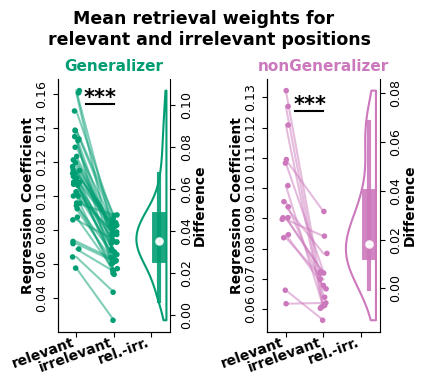

In [ ]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="V1_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
cncompoweightdiff = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['meanweightdiff','sumweightdiff']))].copy()
compoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight_x','compoweight_y']))].copy()
noncompoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['noncompoweight_x','noncompoweight_y']))].copy()

compoweightpdf_wide = compoweightpdf.pivot(index=["subid"], columns="metricname", values="value").reset_index()
noncompoweightpdf_wide = noncompoweightpdf.pivot(index=["subid"], columns="metricname", values="value").reset_index()
#(, id_vars=["subid","metricname"], value_vars=["compoweight_x","compoweight_y"], value_name="meanweight")
compoweightpdf_wide["value"] = compoweightpdf_wide[["compoweight_x","compoweight_y"]].mean(axis=1)
noncompoweightpdf_wide["value"] = noncompoweightpdf_wide[["noncompoweight_x","noncompoweight_y"]].mean(axis=1)
retrievalweight_comparedf = pd.concat(
    [
        compoweightpdf_wide[["subid","value"]].assign(metricname="relevant"),    
        noncompoweightpdf_wide[["subid","value"]].assign(metricname="irrelevant"),
        cncompoweightdiff[["subid","value","metricname"]]

    ]
).reset_index(drop=True)
retrievalweight_comparedf["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in retrievalweight_comparedf["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)

mnames = ["rel.","irr.","diff."]
mnames = ["relevant","irrelevant","rel.-irr."]
pdf = retrievalweight_comparedf[retrievalweight_comparedf.metricname.isin(mnames[:2])].copy()
pdf.metricname = pd.Categorical(pdf.metricname,categories=mnames,ordered=True)
    
gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            #col="metricname",
            sharex=True,sharey=False,
            col="subgroup",
            hue="subgroup",palette=participantgrouphex,
            kind="strip",size=4,
            height=4,aspect=0.55,
            ).set_titles('{col_name}')
gs.map_dataframe(sns.lineplot,x="metricname",y="value",
                 #color="grey",
                 units="subid",estimator=None,
                 hue="subgroup",palette=participantgrouphex,
                 alpha=0.5)


for ax,(mname,mdf) in zip(gs.axes.flatten(),pdf.groupby("subgroup")):
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=10,labelpad=0)
    ax.set_xlabel("")
    ax.set_title(mname,fontsize=11,fontweight="bold",y=1,color=participantgrouphex[mname])
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,rotation=20,ha="right")
    plt.setp(ax.get_yticklabels(),fontsize=9,rotation=90,va="center")
    axvio = ax.twinx()
    axvio.spines[['top']].set_visible(False)
    axvio.axhline(y=0,color="grey",ls="--",xmin=1.9)
    rel_w = mdf[mdf.metricname==mnames[0]].value.values
    irr_w = mdf[mdf.metricname==mnames[1]].value.values
    
    diffdata = pd.DataFrame({"value":rel_w-irr_w,"metricname":mnames[2]})
    diffdata.metricname = pd.Categorical(diffdata.metricname,categories=mnames,ordered=True)
    axvio.set_ylabel("Difference",fontweight="bold",fontsize=10,labelpad=0)
    plt.setp(axvio.get_yticklabels(),fontsize=9,rotation=90,va="center")
    sns.violinplot(data = diffdata,
                   x="metricname",y="value",color=participantgrouphex[mname],fill=False,cut=True,
                   inner_kws = dict(box_width = 10, whis_width=3,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                   ax=axvio,split=True,alpha=1)
    pval = ttestpairedsamp_equiv_permutation(rel_w,irr_w)
    print(mname,pval)
    if pval<0.05:
        ax.text(x=0.2,y=0.95*mdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=15,fontweight="bold")
        ax.axhline(xmin=0.25,xmax=0.5,y=0.95*mdf.value.max(),color="black")

    ax.tick_params(axis='x', which='major', pad=-0.8)
    axvio.tick_params(axis='x', which='major', pad=-0.8)
            
gs.legend.remove()

gs.figure.suptitle("Mean retrieval weights for \n relevant and irrelevant positions",fontweight="bold",fontsize=12.5,y=0.95,x=0.35)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","ParietalSup_locteEncoding.png"),dpi=300)

0.00019998000199980003
0.00019998000199980003
0.21637836216378362
0.6483351664833517


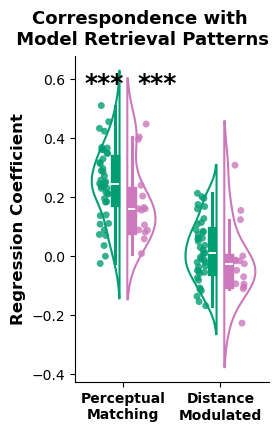

In [1258]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="V1_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,
            kind="violin",fill=False,split=True,inner="box",gap=0.2,
            #color="white",label=None,
            height=4.5,aspect=0.65
            )
gs.map_dataframe(sns.stripplot,x="metricname",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 alpha=0.8)


for ax in gs.axes.flatten():
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=12)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,rotation=0)
    for j,(tar,tardf) in enumerate(pdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(pval)
        #if tar[1]=="Generalizer":
        minorplus = 1*((j%2)==1)
        dw = [-.4,0.15][minorplus]
        ax.text(x=np.floor(j/2)+dw,y=1.1*pdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")

            
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
gs.legend.remove()
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.32)

gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=13,y=0.95,x=0.32)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)

#### Cross Task decoding performance

In [ ]:
print(pdf.analysis.unique())

('x-axis', 'Generalizer') 0.00019998000199980003
('x-axis', 'nonGeneralizer') 0.018198180181981802
('y-axis', 'Generalizer') 0.00019998000199980003
('y-axis', 'nonGeneralizer') 0.39536046395360464


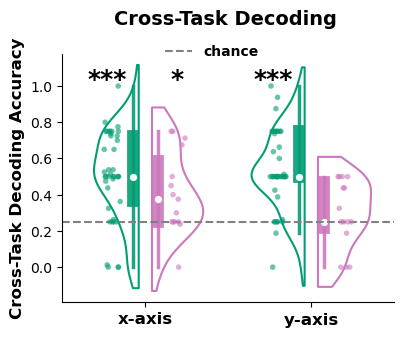

In [76]:
pdf = nclocnavidc_performance_dfsum[(nclocnavidc_performance_dfsum.roi.str.contains("V1_bilateral"))].copy() 
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.25

#we only plot for test2loc bc we are using training to align the representations

pdf_sum = pdf[pdf.analysis=='test2loc'].groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["target_str"] = pd.Categorical(
    pdf_sum["target"].map({"stim_x":"x-axis",
                           "stim_y":"y-axis"}),
    categories=["x-axis","y-axis"],ordered=True)
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)

gs = sns.catplot(data=pdf_sum,
            x="target_str",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            kind="violin",split=True,gap=0.2,inner="box",fill=False,cut=True,
            inner_kws = dict(box_width = 8.5, whis_width=2.5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                   
#            height=4,aspect=0.8,
            height=3.5,aspect=1.2,
            )
gs.map_dataframe(sns.stripplot,x="target_str",y="eval_acc",
                 size=4,alpha=0.6,jitter =0.1,
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Cross-Task Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    #ax.set_ylim([0,1])
    ax.axhline(0.25,label="chance",color="grey",ls='--')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=12,rotation=0)
    for j,(tar,tardf) in enumerate(pdf_sum.groupby(["target_str","subgroup"])):
        
        pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
        print(tar, pval)
        minorplus = 1*((j%2)==1)
        dw = [-.35,0.15][minorplus]
        ax.text(x=np.floor(j/2)+dw,y=1.*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")

    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[-1]],[ls[-1]],loc="lower center",bbox_to_anchor=(0.45,0.93),ncol = 1,
            prop = {"weight":"bold"},frameon=False)  
gs.legend.remove()  
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.figure.suptitle("Cross-Task Decoding",fontweight="bold",fontsize=14,x=0.4,y=0.95)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_navilzerCCGP.png"),dpi=300)

# Plot for Parietal

## Distribution of dimensionality

In [ ]:
pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.roi==f"testgtlocParietalSup_bilateral")].copy() #

pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')

np.exp(np.sqrt(np.sort(pdf_counts["counts"].unique())))*3
(np.exp2(np.arange(pdf_counts["counts"].nunique())+1))*5

In [ ]:
(np.exp2(np.arange(pdf_counts["counts"].nunique())+2))*7

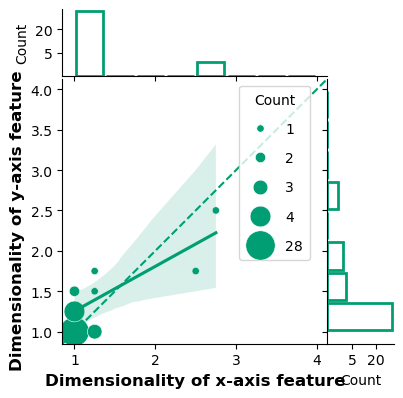

In [292]:
pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.roi==f"testgtlocParietalSup_bilateral")].copy() #

pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')                    

dot_color=  colors.hex2color(participantgrouphex["Generalizer"])
gs = sns.JointGrid(data=pdf_counts, x="x axis", y="y axis",
                   marginal_ticks=True,ratio=4,space=0.,height=5)
sns.scatterplot(pdf_counts,
                x="x axis",
                y="y axis",
                size="counts",
                sizes=dict(zip(
                    np.sort(pdf_counts["counts"].unique()),
                    (np.exp2(np.arange(pdf_counts["counts"].nunique())+2))*7         
                    )), 
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,
                ax=gs.ax_joint
                )

gs.ax_joint.set_aspect(1)

sns.histplot(x="x axis", 
             fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_x,kde=False, color=dot_color,data=pdf_wide
             )
gs.ax_marg_x.set_yscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_x.set_yticks([5,20])
sns.histplot(y="y axis", fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_y,kde=False, color=dot_color,data=pdf_wide)
gs.ax_marg_y.set_xscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_y.set_xticks([5,20])

handles, labels = gs.ax_joint.get_legend_handles_labels()
for handle in handles:
    handle.set_color(dot_color)
gs.ax_joint.legend(handles=handles,#[handles[1],handles[3],handles[-1]],
                   labels=labels,#[labels[1],labels[3],labels[-1]], 
                   title="Count",
                   labelspacing=1.1,
                   borderpad=0.5,
                   loc="upper center",bbox_to_anchor=(0.8,1))

sns.regplot(data=pdf_counts, x="x axis", y="y axis",scatter=False,ax=gs.ax_joint,color=dot_color,ci=95, n_boot=10000)
gs.ax_joint.axline((1,1),slope=1,color=dot_color,linestyle="--")

gs.ax_joint.set_xlabel("Dimensionality of x-axis feature",fontdict={"fontsize":12,"fontweight":"bold"})
gs.ax_joint.set_ylabel("Dimensionality of y-axis feature   ",fontdict={"fontsize":12,"fontweight":"bold"})
gs.fig.set_figwidth(4)
gs.fig.set_figheight(4)
jointax_pos = gs.ax_joint.get_position()
xmargax_pos = gs.ax_marg_x.get_position()
ymargax_pos = gs.ax_marg_y.get_position()
gs.ax_marg_x.set_position([jointax_pos.x0,xmargax_pos.y0,jointax_pos.width,xmargax_pos.height])
gs.ax_marg_y.set_position([ymargax_pos.x0,jointax_pos.y0,ymargax_pos.width,jointax_pos.height])
gs.figure.suptitle("",fontsize=16,fontweight="bold",y=0.95)
#gs.figure.tight_layout()
checkdir(os.path.join(ROIRSAdir,"testgtlocParietalSup"))
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","dimonaxis_xydistscatter.png"),dpi=300)

In [ ]:
jointax_pos.x0

In [ ]:
jointax_pos = gs.ax_joint.get_position()
xmargax_pos = gs.ax_marg_x.get_position()

jointax_pos
xmargax_pos

In [ ]:
handles, labels = gs.ax_joint.get_legend_handles_labels()
handles

In [ ]:
[handles[1],handles[3],handles[-1]]

## Cross-condition decoding performance

('stim_x', 'Generalizer') 0.012598740125987402
('stim_y', 'Generalizer') 0.010798920107989201


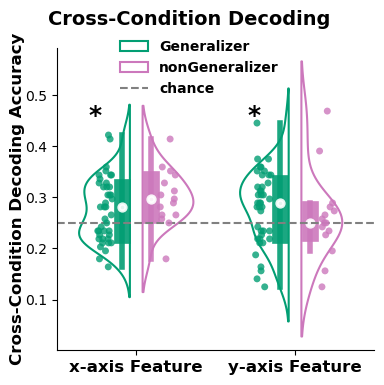

In [187]:
pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("testgtlocParietal"))].copy()
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.25

pdf_sum = pdf.groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))].copy().reset_index(drop=True)
pdf_sum["target"] = pd.Categorical(pdf_sum["target"],categories=["stim_x","stim_y"],ordered=True)

gs = sns.catplot(data=pdf_sum,
            x="target",y="eval_acc",
            kind="violin", inner="box", fill=False,split=True, gap=0.2,
            hue="subgroup",palette=participantgrouphex,
            inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1
            )
gs.map_dataframe(sns.stripplot,x="target",y="eval_acc",
                 alpha=0.8,
                 hue="subgroup",palette=participantgrouphex,dodge=True
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    ax.set_xticks([0,1],["x-axis Feature","y-axis Feature"],fontweight="bold",fontsize=12,rotation=0,ha="center")
    ax.axhline(0.25,label="chance",color="grey",ls='--')
    for j, (tar,tardf) in enumerate(pdf_sum.groupby(["target","subgroup"])):
        if tar[1] == "Generalizer":
            pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
            print(tar, pval)
            minorplus = 1*((j%2)==1)
            dw = [-.3,0.15][minorplus]
            ax.text(x=np.floor(j/2)+dw,y=0.95*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontweight="bold",size=18)
    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="lower center",bbox_to_anchor=(0.45,0.80),ncol = 1,
            prop = dict(weight="bold"),frameon=False)  


gs.legend.remove()
gs.figure.suptitle("Cross-Condition Decoding",fontweight="bold",fontsize=14,x=0.35,y=0.95)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","traintestCCGP.png"),dpi=300)

## predicting test pattern from train

In [ ]:
compo_retrieve_roisubset_df.metricname.unique()

0.00019998000199980003
0.0013998600139986002
0.00019998000199980003
0.00019998000199980003


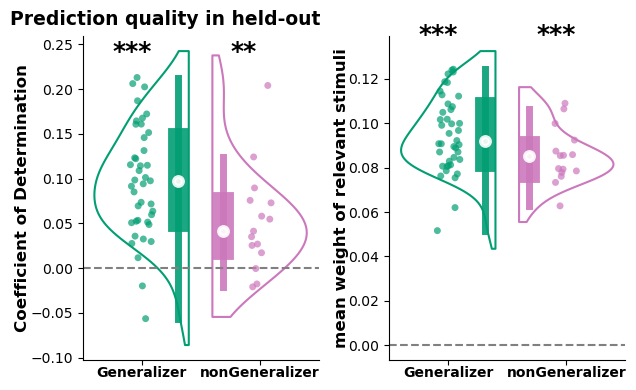

In [1269]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="testgtlocParietalSup_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight','eval_r2']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination",
                        "compoweight":"mean weight of relevant stimuli"}),
    categories=["Coefficient of Determination","mean weight of relevant stimuli"],ordered=True
)


# pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight']))].copy()

# pdf["metricname"] = pd.Categorical(
#     pdf.metricname.map({"compoweight":"Mean weight of relevant stimuli"}),
#     categories=["Mean weight of relevant stimuli"],ordered=True
# )

# pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()

# pdf["metricname"] = pd.Categorical(
#     pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
#     categories=["Coefficient of Determination"],ordered=True
# )

gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="metricname",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,dodge=False,
            kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.8,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.metricname==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    #ax.set_xticks([-.25,.25],["Generalizer","nonGeneralizer"],fontweight="bold",fontsize=12)
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,
             rotation=0,ha="center")
    ax.tick_params(axis='x', which='major', pad=1)
             
    ax.set_title('')
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(pval)
        ax.text(x=j-0.25,y=1.1*axdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
gs.axes.flatten()[0].set_title("Prediction quality in held-out",fontweight="bold",fontsize=13.5,x=0.35,y=1.01)
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.9),ncol=2)
#gs.legend.remove()
#gs.figure.suptitle("Prediction quality in held-out",fontweight="bold",fontsize=14,y=0.95,x=0.35)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)
#inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),

0.16398360163983602
0.04179582041795821


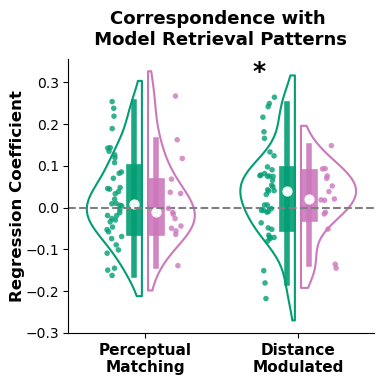

In [1271]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="testgtlocParietalSup_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,
            kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1
            ).refline(y=0)
gs.map_dataframe(sns.stripplot,x="metricname",y="value",
                 jitter=0.1,
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 alpha=0.8,s=4
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,rotation=0)
    for j,(tar,tardf) in enumerate(pdf.groupby(["metricname","subgroup"])):
        if tar[1]=="Generalizer":
            pval = ttest1samp_equiv_permutation(tardf.value.values)
            print(pval)
            minorplus = 1*((j%2)==1)
            dw = [-.3,0.15][minorplus]
            ax.text(x=np.floor(j/2)+dw,y=1.15*pdf.value.max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                    size=18,fontweight="bold")
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=13,y=0.95,x=0.4)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","ParietalSup_trteEncoding.png"),dpi=300)

## predicting test pattern from localizer

0.1623837616238376
0.5861413858614138
0.05419458054194581
0.44815518448155184


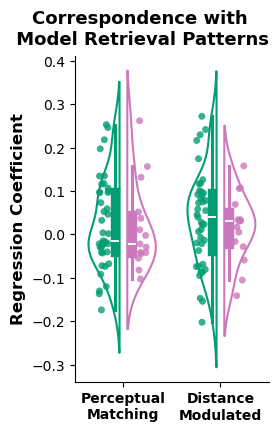

In [1272]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="testgtlocParietalSup_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,
            kind="violin",fill=False,split=True,inner="box",gap=0.2,
            #color="white",label=None,
            height=4.5,aspect=0.65
            )
gs.map_dataframe(sns.stripplot,x="metricname",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 alpha=0.8)


for ax in gs.axes.flatten():
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=12)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,rotation=0)
    for j,(tar,tardf) in enumerate(pdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(pval)
        if tar[1]=="Generalizer":
            minorplus = 1*((j%2)==1)
            dw = [-.3,0.15][minorplus]
            ax.text(x=np.floor(j/2)+dw,y=1.1*pdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""))

            
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
gs.legend.remove()
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.32)

gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=13,y=0.95,x=0.32)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","ParietalSup_locteEncoding.png"),dpi=300)

0.00019998000199980003
0.0011998800119988001
0.00019998000199980003
0.00019998000199980003


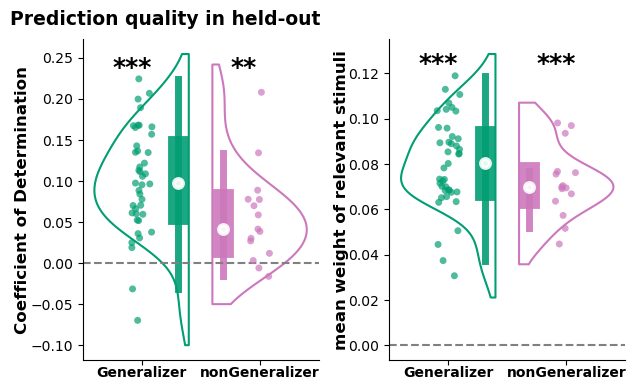

In [ ]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="testgtlocParietalSup_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight','eval_r2']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination",
                        "compoweight":"mean weight of relevant stimuli"}),
    categories=["Coefficient of Determination","mean weight of relevant stimuli"],ordered=True
)


gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="metricname",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,dodge=False,
            kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.8,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.metricname==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,
             rotation=0,ha="center")
    ax.tick_params(axis='x', which='major', pad=1)
             
    ax.set_title('')
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(pval)
        ax.text(x=j-0.25,y=1.02*axdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
gs.axes.flatten()[0].set_title("Prediction quality in held-out",fontweight="bold",fontsize=13.5,x=0.35,y=1.02)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","ParietalSup_locteEncodingSC.png"),dpi=300)
#inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),

In [ ]:
compositionretrieval_resdf.metricname.unique()

Generalizer 0.0057994200579942
nonGeneralizer 0.30016998300169984


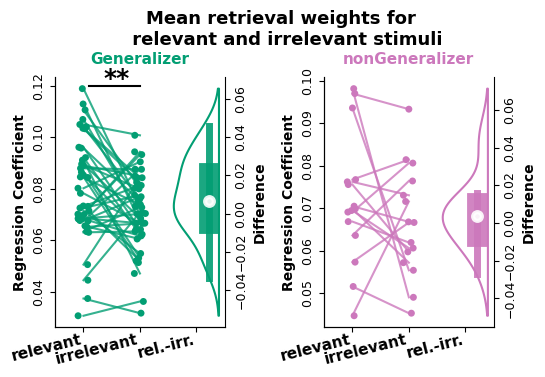

In [1342]:

compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="testgtlocParietalSup_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
compoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname==f"compoweight")].copy()[["subid","value"]].assign(metricname=mnames[0])
noncompoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname==f"noncompoweight")].copy()[["subid","value"]].assign(metricname=mnames[1])

assert compoweightpdf.shape[0]/len(subid_list) == 1
assert noncompoweightpdf.shape[0]/len(subid_list) == 1
compoweightpdf.sort_values(by="subid",inplace=True)
noncompoweightpdf.sort_values(by="subid",inplace=True)

retrievalweight_comparedf = pd.concat(
    [
        compoweightpdf,    
        noncompoweightpdf,
        pd.DataFrame({"subid":compoweightpdf.subid.values,
                        "value":compoweightpdf.value.values-noncompoweightpdf.value.values}).assign(metricname=mnames[2])

    ]
).reset_index(drop=True)
retrievalweight_comparedf["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in retrievalweight_comparedf["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True)


pdf = retrievalweight_comparedf[retrievalweight_comparedf.metricname.isin(mnames[:2])].copy()
pdf.metricname = pd.Categorical(pdf.metricname,categories=mnames,ordered=True)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            #col="metricname",
            sharex=True,sharey=False,
            col="subgroup",
            hue="subgroup",palette=participantgrouphex,
            kind="strip",
            height=4,aspect=0.7,
            ).set_titles('{col_name}')
gs.map_dataframe(sns.lineplot,x="metricname",y="value",
                #color="grey",
                units="subid",estimator=None,
                hue="subgroup",palette=participantgrouphex,
                alpha=0.8)


for ax,(sgname,sgdf) in zip(gs.axes.flatten(),pdf.groupby("subgroup")):
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=10)
    ax.set_xlabel("")
    ax.set_title(sgname,fontsize=11,fontweight="bold",y=1.02,color=participantgrouphex[sgname])
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,rotation=14,ha="right")
    ax.tick_params(axis='x', which='major', pad=0)
    plt.setp(ax.get_yticklabels(),fontsize=9,rotation=90,va="center")
    axvio = ax.twinx()
    axvio.spines[['top']].set_visible(False)
    axvio.axhline(y=0,color="grey",ls="--",xmin=1.9)
    rel_w = sgdf[sgdf.metricname==mnames[0]].value.values
    irr_w = sgdf[sgdf.metricname==mnames[1]].value.values
    diffdata = pd.DataFrame({"value":rel_w-irr_w,"metricname":mnames[2]})
    diffdata.metricname = pd.Categorical(diffdata.metricname,categories=mnames,ordered=True)
    axvio.set_ylabel("Difference",fontweight="bold",fontsize=10)
    plt.setp(axvio.get_yticklabels(),fontsize=9,rotation=90,va="center")
    sns.violinplot(data = diffdata,
                x="metricname",y="value",color=participantgrouphex[sgname],fill=False,
                inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                ax=axvio,split=True,alpha=1)
    pval = ttestpairedsamp_equiv_permutation(rel_w,irr_w)
    print(sgname,pval)
    if pval<0.05:
        ax.text(x=0.35,y=1.01*sgdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        ax.axhline(xmin=0.2,xmax=0.5,y=1.01*sgdf.value.max(),color="black")

            
gs.legend.remove()
gs.figure.suptitle(f"Mean retrieval weights for \n relevant and irrelevant stimuli",fontweight="bold",fontsize=13,y=0.93,x=0.4)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","ParietalSup_locteEncoding.png"),dpi=300)

## cross task rdm correlation

In [ ]:
TEcorr_res_df.columns 
#TEcompocorr_res_df

Index(['tssim2loc', 'tssim2euc', 'locsim2euc', 'subid', 'tarvar', 'roi',
       'subgroup', 'region'],
      dtype='object')

('Generalizer',) 0.28357164283571645
('nonGeneralizer',) 0.5781421857814218


Text(0.35, 1.02, 'tssim2loc')

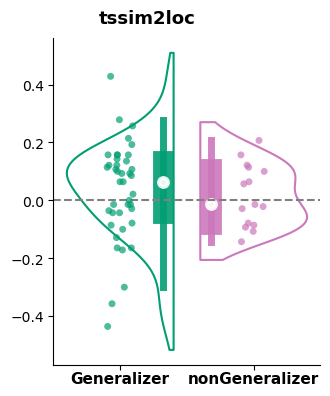

In [1291]:
pdf = TEcorr_res_df[(TEcorr_res_df.roi=="testgtlocParietalSup_bilateral")].copy() # &(TEcorr_res_df.subid.isin(generalizers))
#pdf["tssim2loc"] = np.arctanh(pdf["tssim2loc"])
pdf_sum = pdf.groupby("subid")[["tssim2loc"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(  
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
pdf["subgroup"] = pd.Categorical(
    pdf["subgroup"],categories=["Generalizer","nonGeneralizer"],ordered=True
    )
gs = sns.catplot(data=pdf_sum,
            x="subgroup",y="tssim2loc",
            #col="tarvar",
            hue="subgroup",palette=participantgrouphex,
            kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.9,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="tssim2loc",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf_sum.copy()
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,
             rotation=0,ha="center")
    ax.tick_params(axis='x', which='major', pad=1)
             
    ax.set_title('')
    for j,(tar,tardf) in enumerate(axdf.groupby(["subgroup"])):#"tarvar",
        pval=ttest1samp_equiv_permutation(tardf.tssim2loc.values)
        print(tar,pval)
        ax.text(x=j-0.25,y=1.02*axdf.tssim2loc.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
gs.axes.flatten()[0].set_title("tssim2loc",fontweight="bold",fontsize=13,x=0.35,y=1.02)


In [887]:
TEcompocorr_res_df_long.columns

Index(['subid', 'roi', 'subgroup', 'predictor', 'coef', 'region'], dtype='object')

('Generalizer',) 0.12218778122187782
('nonGeneralizer',) 0.8437156284371563


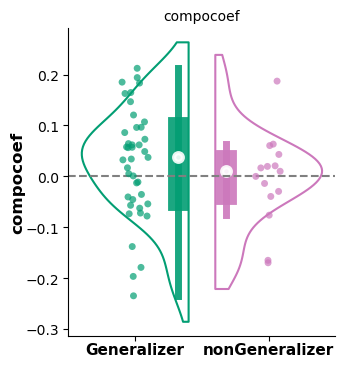

In [1292]:
pdf = TEcompocorr_res_df_long[(TEcompocorr_res_df_long.roi=="testgtlocParietalSup_bilateral")].copy() # &(TEcorr_res_df.subid.isin(generalizers))
pdf = pdf[pdf.predictor.isin(["compocoef"])].copy()
pdf["coef"] = np.arctanh(pdf["coef"])
pdf_sum = pdf.groupby(["subid"])[["coef"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
    )
pdf["subgroup"] = pd.Categorical(
    pdf["subgroup"],categories=["Generalizer","nonGeneralizer"],ordered=True
    )
gs = sns.catplot(data=pdf,
            x="subgroup",y="coef",
            col="predictor",
            hue="subgroup",palette=participantgrouphex,
            kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.9,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="coef",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.predictor==ax.title.get_text()]#pdf_sum.copy()#[pdf.tarvar==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,
             rotation=0,ha="center")
    ax.tick_params(axis='x', which='major', pad=1)
             
    
    for j,(tar,tardf) in enumerate(axdf.groupby(["subgroup"])):#"tarvar",
        pval = ttest1samp_equiv_permutation(tardf.coef.values)
        print(tar,pval)
        ax.text(x=j-0.25,y=1.02*axdf.coef.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
#gs.axes.flatten()[0].set_title("corr",fontweight="bold",fontsize=13,x=0.35,y=1.02)


## Cross-task decoding performance

In [ ]:
pdf = nclocnavidc_performance_dfsum[(nclocnavidc_performance_dfsum.roi.str.contains("testgtlocParietal"))].copy() # &(nclocnavidc_performance_dfsum.subid.isin(generalizers))
#pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("HPC"))].copy()
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.25

#we only plot for test2loc bc we are using training to align the representations

pdf_sum = pdf[pdf.analysis=='test2loc'].groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["target_str"] = pd.Categorical(
    pdf_sum["target"].map({"stim_x":"x-axis",
                           "stim_y":"y-axis"}),
    categories=["x-axis","y-axis"],ordered=True)
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))].copy().reset_index(drop=True)
#pdf_sum["target"] = pd.Categorical(pdf_sum["target"],categories=["stim_x","stim_y"],ordered=True)

gs = sns.catplot(data=pdf_sum,
            x="target_str",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            kind="violin",split=True,gap=0.2,fill=False,cut=0,
            inner="box",inner_kws=dict(box_width=6, whis_width=2,alpha=0.7),
            #col="target_str",
            #color="white", label=None,
            height=4,aspect=0.8,
            )#.set_titles(template="{col_name}", fontweight="bold",fontsize=12)
gs.map_dataframe(sns.stripplot,x="target_str",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=1,s=4,
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    #ax.set_ylim([0,1])
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=12,rotation=0)
    ax.axhline(0.25,label="chance",color="k",ls='--')
    for j,(tar,tardf) in enumerate(pdf_sum.groupby(["target_str","subgroup"])):
        if tar[1]=="Generalizer":
            pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
            print(tar, pval)
            minorplus = 1*((j%2)==1)
            dw = [-.2,0.15][minorplus]
            ax.text(x=np.floor(j/2)+dw,y=0.83,s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontweight="bold",size=18)

    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[-1]],[ls[-1]],loc="lower center",bbox_to_anchor=(0.45,0.95),ncol = 3,
            prop = {"weight":"bold"},frameon=False)  
gs.legend.remove()  
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.figure.suptitle("Cross-Task Decoding",fontweight="bold",fontsize=14,x=0.35,y=0.95)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","ParietalSup_navilzerCCGP.png"),dpi=300)

## Train-test separation

In [1300]:
septraintestdc_performance_df.roi.unique()

array(['testgtlocTPMid_bilateral', 'testgtlocParietalSup_bilateral',
       'HPCPHPC_bilateral', 'HPC_bilateral', 'vmPFC_bilateral',
       'V1_bilateral', 'V2_bilateral', 'allgtlocPrecentral_left'],
      dtype=object)

('Generalizer',) 0.00019998000199980003
('nonGeneralizer',) 0.00019998000199980003


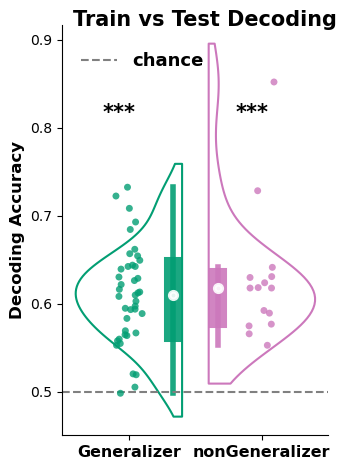

In [193]:
pdf = septraintestdc_performance_df[(septraintestdc_performance_df.roi=="testgtlocParietalSup_bilateral")].copy() # &(nclocnavidc_performance_dfsum.subid.isin(generalizers))
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.5

pdf_sum = pdf.groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)


gs = sns.catplot(data=pdf_sum,
            x="subgroup",y="eval_acc",
            kind="violin", fill=False,split=True, gap=0,cut=True,
            inner="box",
            inner_kws = dict(box_width = 13, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),

            hue="subgroup",palette=participantgrouphex,
            #color="white", label=None,
            height=5,aspect=0.7
            )
gs.map_dataframe(sns.stripplot,x="subgroup",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=0.8,
                 hue="subgroup",palette=participantgrouphex,#dodge=True
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11.5,rotation=0)
    ax.axhline(0.5,label="chance",color="grey",ls='--')
    for j, (tar,tardf) in enumerate(pdf_sum.groupby(["subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
        print(tar, pval)
        dw = [-.2,0.0][0]
        ax.text(x=j+dw,y=0.95*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontweight="bold",size=15)
    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[0]],[ls[0]],loc="lower center",bbox_to_anchor=(0.3,0.85),ncol = 2,
            prop = dict(weight="bold",size=13),frameon=False)  
  
gs.figure.suptitle("Train vs Test Decoding",fontweight="bold",fontsize=15,x=0.6,y=0.93)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","traintest_separation.png"),dpi=300)

## beta weights

In [603]:
parietal_gtloceuc_wbbetaw_df = pd.read_csv(os.path.join(ROIRSAdir,"wbsearchlight_meangtlocweight_ParietalSup.csv"))
parietal_gtloceuc_wbbetaw_df_long = pd.melt(parietal_gtloceuc_wbbetaw_df,id_vars=["subid"],var_name="stimuligroup",value_name="meancoef")
print(parietal_gtloceuc_wbbetaw_df_long.stimuligroup.unique())
parietal_gtloceuc_wbbetaw_df_long.head(5)

['localizer' 'trainingstim' 'teststim']


,subid,stimuligroup,meancoef
0,sub001,localizer,0.257026
1,sub002,localizer,0.055568
2,sub003,localizer,-0.058542
3,sub004,localizer,-0.139312
4,sub005,localizer,0.151941


In [604]:
parietal_gtloceuc_wbbetaw_df_long["subgroup"] = pd.Categorical( 
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in parietal_gtloceuc_wbbetaw_df_long["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
parietal_gtloceuc_wbbetaw_df_long["stimuligroup_str"] = pd.Categorical(
    parietal_gtloceuc_wbbetaw_df_long["stimuligroup"].map(
        {"localizer":"localizer\npirate positions",
         "teststim": "treasure hunt\ntest stimuli",
         "trainingstim": "treasure hunt\ntraining stimuli",
         }),
    categories=["treasure hunt\ntraining stimuli",
                "treasure hunt\ntest stimuli",
                "localizer\npirate positions"],
    ordered=True
    )

c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)


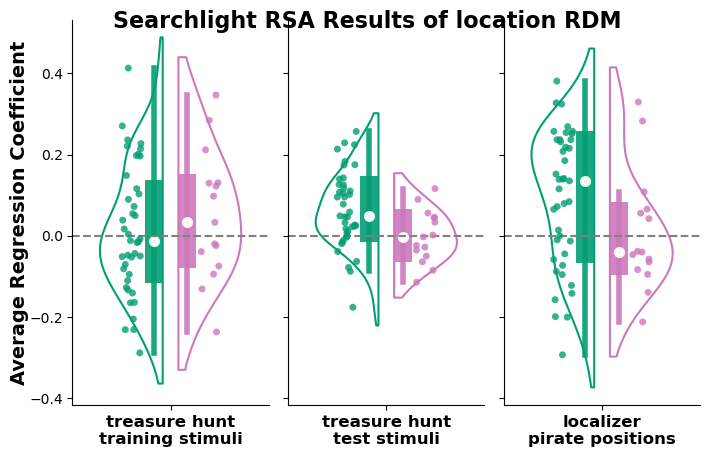

In [1303]:
gs = sns.catplot(data=parietal_gtloceuc_wbbetaw_df_long.assign(constavar="participant"),
x="constavar",y="meancoef",
hue="subgroup",palette=participantgrouphex,
col="stimuligroup_str", sharey=True,sharex=False,facet_kws=dict(gridspec_kws={"wspace":0.1}),
kind="violin", split=True, inner="box", fill=False, gap=0.2,cut=True,
inner_kws = dict(box_width = 13, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
aspect=0.5,height=5
            ).set_titles("{col_name}").refline(y=0)

gs.map_dataframe(sns.stripplot,x="constavar",y="meancoef",
                 alpha=0.8,
                 hue="subgroup",palette=participantgrouphex,dodge=True
                 )


for j,ax in enumerate(gs.axes.flatten()):
    if j==0:
        ax.set_ylabel("Average Regression Coefficient",fontweight="bold",fontsize=14,labelpad=0)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    ax.set_xticks([0],[ax.get_title()])
    ax.set_title('')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=12,rotation=0)

gs.legend.remove()    
for ax in gs.axes.flatten():
    ax.legend().remove()
  
gs.figure.suptitle("Searchlight RSA Results of location RDM",fontweight="bold",fontsize=16,x=0.45,y=0.9)
gs.figure.savefig(os.path.join(ROIRSAdir,"testgtlocParietalSup","locationrdm_meancoef.png"),dpi=300)

# Plot for vmPFC

## dimensionality

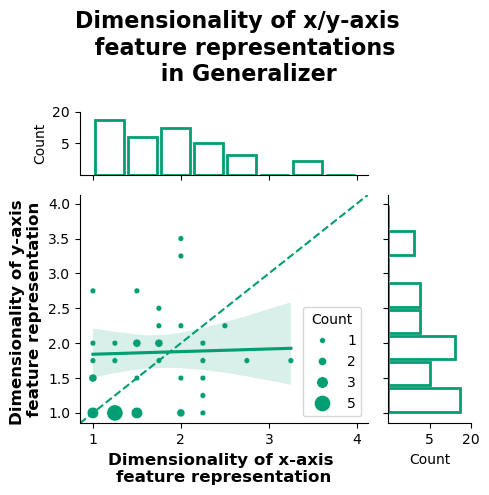

In [291]:
pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.roi==f"vmPFC_bilateral")].copy()

pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
    
pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')

dot_color=  colors.hex2color(participantgrouphex["Generalizer"])
gs = sns.JointGrid(data=pdf_counts, x="x axis", y="y axis",marginal_ticks=True,ratio=3,space=0.3,height=5)
sns.scatterplot(pdf_counts,
                x="x axis",
                y="y axis",
                size="counts",
                sizes=dict(zip(
                    np.sort(pdf_counts["counts"].unique()),
                    (np.exp2(np.arange(pdf_counts["counts"].nunique())+1.5))*6         
                    )), 
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,
                ax=gs.ax_joint
                )
sns.histplot(x="x axis", 
             fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_x,kde=False, color=dot_color,data=pdf_wide
             )
gs.ax_marg_x.set_yscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_x.set_yticks([5,20])
sns.histplot(y="y axis", fill=False, linewidth=2, 
             binrange=[1,4], bins=8, element="bars", 
             shrink=0.9, line_kws={'width':0.1}, 
             ax=gs.ax_marg_y,kde=False, color=dot_color,data=pdf_wide)
gs.ax_marg_y.set_xscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
gs.ax_marg_y.set_xticks([5,20])

handles, labels = gs.ax_joint.get_legend_handles_labels()
for handle in handles:
    handle.set_color(dot_color)
gs.ax_joint.legend(handles=handles, labels=labels, title="Count")

sns.regplot(data=pdf_counts, x="x axis", y="y axis",scatter=False,ax=gs.ax_joint,color=dot_color,ci=95, n_boot=10000)
gs.ax_joint.axline((1,1),slope=1,color=dot_color,linestyle="--")

gs.ax_joint.set_xlabel("Dimensionality of x-axis \nfeature representation",fontdict={"fontsize":12,"fontweight":"bold"})
gs.ax_joint.set_ylabel("Dimensionality of y-axis \nfeature representation",fontdict={"fontsize":12,"fontweight":"bold"})

gs.figure.suptitle("Dimensionality of x/y-axis  \n feature representations \n in Generalizer",fontsize=16,fontweight="bold")
gs.figure.tight_layout()
checkdir(os.path.join(ROIRSAdir,"vmPFChighdim"))
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","vmPFC_dimonaxis_xydistscatter.png"),dpi=300)

## corr between dim and feature decoding

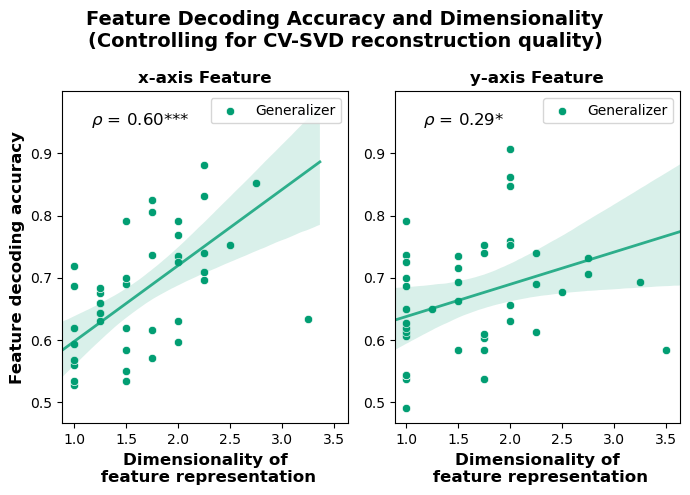

In [1040]:
pdf = training_feature_decoding[(training_feature_decoding.subgroup=="Generalizer")&(training_feature_decoding.roi==f"vmPFC_bilateral")].copy() #(training_feature_decoding.subgroup=="Generalizer")
dot_color=  colors.hex2color(participantgrouphex["Generalizer"])


def partialrankcorr(data,x, y,covar, ax=None,**kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,x_covar=covar,method="pearson",alternative="greater")
    rho,pval = res.r[0], res["p-val"][0]
    ax = ax if ax is not None else plt.gca()
    if pval<=0.05:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}{gen_pval_annot(pval,show_pval=False)}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    else:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)

fig, axes = plt.subplots(1,2,figsize=(7,5),
                         sharey=True,sharex=True)
for ax, (gname,gdf) in zip(axes, pdf.groupby("dimonaxis")): 
    
    sns.scatterplot(data=pdf[pdf.dimonaxis==gname].copy(),
                    x="est_dim",y="eval_acc",
                    #hue="subgroup",palette=participantgrouphex,
                    color=dot_color,label="Generalizer",
                    ax=ax)
    sns.regplot(data=gdf,
                x="est_dim",y="eval_acc",
                scatter=False,truncate=False,
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,
                line_kws={"alpha":0.8,"linewidth":2},
                x_partial="reconstruction_corr",
                ci=95, n_boot=10000,
                ax=ax)
    partialrankcorr(gdf,"est_dim","eval_acc","reconstruction_corr",ax=ax)

    ax.tick_params(axis='both', which='both', labelsize=10,labelleft=True, labelbottom=True)
    ax.set_ylabel("Feature decoding accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.set_xlabel("Dimensionality of\n feature representation",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.set_title("%s Feature"%(gname.replace(" ","-")),fontdict={"fontsize":12,"fontweight":"bold"})

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles=handles, labels=labels, title="")

fig.suptitle("Feature Decoding Accuracy and Dimensionality\n(Controlling for CV-SVD reconstruction quality)",
                   fontsize=14,fontweight="bold")
fig.tight_layout()
fig.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","vmPFC_dimonaxis_corrfeatureDC.png"),dpi=300)

## cross condition decoding

('stim_x', 'Generalizer') 0.24077592240775922
('stim_y', 'Generalizer') 0.013798620137986202


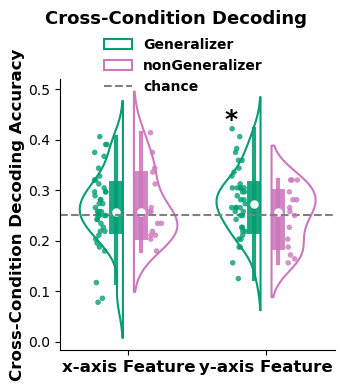

In [1316]:
pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("vmPFC"))].copy() # &(nclocnavidc_performance_dfsum.subid.isin(generalizers))
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.25

pdf_sum = pdf.groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))].copy().reset_index(drop=True)
pdf_sum["target"] = pd.Categorical(pdf_sum["target"],categories=["stim_x","stim_y"],ordered=True)

gs = sns.catplot(data=pdf_sum,
            x="target",y="eval_acc",
            kind="violin", inner="box", fill=False,split=True, gap=0.2,
            hue="subgroup",palette=participantgrouphex,
            inner_kws = dict(box_width = 10, whis_width=3,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.9
            )
gs.map_dataframe(sns.stripplot,x="target",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=0.8,size=4,
                 hue="subgroup",palette=participantgrouphex,dodge=True
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize=12,labelpad=2)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    ax.set_xticks([0,1],["x-axis Feature","y-axis Feature"],fontweight="bold",fontsize=12,rotation=0,ha="center")
    ax.axhline(0.25,label="chance",color="grey",ls='--')
    for j, (tar,tardf) in enumerate(pdf_sum.groupby(["target","subgroup"])):
        if tar[1] == "Generalizer":
            pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
            print(tar, pval)
            minorplus = 1*((j%2)==1)
            dw = [-.3,0.15][minorplus]
            ax.text(x=np.floor(j/2)+dw,y=1.01*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontweight="bold",size=18)
    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="lower center",bbox_to_anchor=(0.45,0.90),ncol = 1,
            prop = dict(weight="bold"),frameon=False)  
    #ax.legend([hs[-1]],[ls[-1]],loc="lower center",bbox_to_anchor=(0.45,0.95),ncol = 1,
    #        prop = dict(weight="bold"),frameon=False)  


#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.legend.remove()
gs.figure.suptitle("Cross-Condition Decoding",fontweight="bold",fontsize=13,x=0.35,y=0.95)
gs.tight_layout()

gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","vmPFC_traintestCCGP.png"),dpi=300)

## predicting test from train

0.0005999400059994001
0.9605039496050395
0.00019998000199980003
0.00019998000199980003


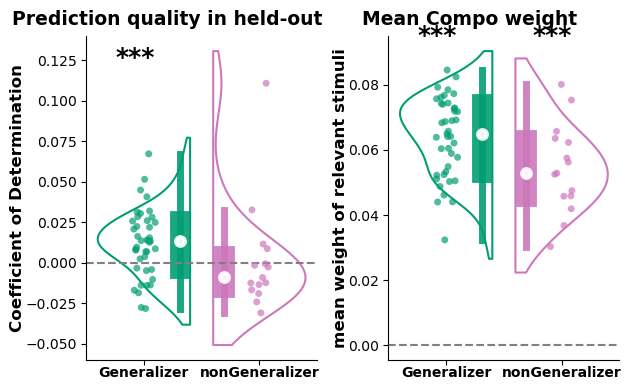

In [1317]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="vmPFC_bilateral")].copy() 
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight','eval_r2']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination",
                        "compoweight":"mean weight of relevant stimuli"}),
    categories=["Coefficient of Determination","mean weight of relevant stimuli"],ordered=True
)


# pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight']))].copy()

# pdf["metricname"] = pd.Categorical(
#     pdf.metricname.map({"compoweight":"Mean weight of relevant stimuli"}),
#     categories=["Mean weight of relevant stimuli"],ordered=True
# )

# pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()

# pdf["metricname"] = pd.Categorical(
#     pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
#     categories=["Coefficient of Determination"],ordered=True
# )

gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="metricname",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,dodge=False,
            kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.8,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.metricname==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    #ax.set_xticks([-.25,.25],["Generalizer","nonGeneralizer"],fontweight="bold",fontsize=12)
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,
             rotation=0,ha="center")
    ax.tick_params(axis='x', which='major', pad=1)
             
    ax.set_title('')
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(pval)
        ax.text(x=j-0.25,y=1.1*axdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
gs.axes.flatten()[0].set_title("Prediction quality in held-out",fontweight="bold",fontsize=13.5,x=0.35,y=1.01)
gs.axes.flatten()[1].set_title("Mean Compo weight",fontweight="bold",fontsize=13.5,x=0.35,y=1.01)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","vmPFC_trteEncodingSC.png"),dpi=300)


Generalizer 0.00039996000399960006
nonGeneralizer 0.6679332066793321


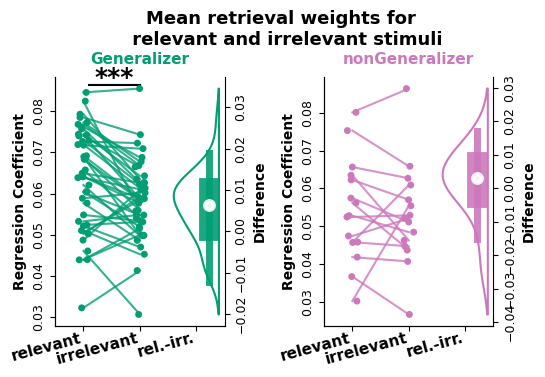

In [1341]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="vmPFC_bilateral")].copy()
compoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname==f"compoweight")].copy()[["subid","value"]].assign(metricname=mnames[0])
noncompoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname==f"noncompoweight")].copy()[["subid","value"]].assign(metricname=mnames[1])

assert compoweightpdf.shape[0]/len(subid_list) == 1
assert noncompoweightpdf.shape[0]/len(subid_list) == 1
compoweightpdf.sort_values(by="subid",inplace=True)
noncompoweightpdf.sort_values(by="subid",inplace=True)

retrievalweight_comparedf = pd.concat(
    [
        compoweightpdf,    
        noncompoweightpdf,
        pd.DataFrame({"subid":compoweightpdf.subid.values,
                        "value":compoweightpdf.value.values-noncompoweightpdf.value.values}).assign(metricname=mnames[2])

    ]
).reset_index(drop=True)
retrievalweight_comparedf["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in retrievalweight_comparedf["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True)


pdf = retrievalweight_comparedf[retrievalweight_comparedf.metricname.isin(mnames[:2])].copy()
pdf.metricname = pd.Categorical(pdf.metricname,categories=mnames,ordered=True)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            #col="metricname",
            sharex=True,sharey=False,
            col="subgroup",
            hue="subgroup",palette=participantgrouphex,
            kind="strip",
            height=4,aspect=0.7,
            ).set_titles('{col_name}')
gs.map_dataframe(sns.lineplot,x="metricname",y="value",
                #color="grey",
                units="subid",estimator=None,
                hue="subgroup",palette=participantgrouphex,
                alpha=0.8)


for ax,(sgname,sgdf) in zip(gs.axes.flatten(),pdf.groupby("subgroup")):
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=10)
    ax.set_xlabel("")
    ax.set_title(sgname,fontsize=11,fontweight="bold",y=1.02,color=participantgrouphex[sgname])
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,rotation=15,ha="right")
    ax.tick_params(axis='x', which='major', pad=0)
    plt.setp(ax.get_yticklabels(),fontsize=9,rotation=90,va="center")
    axvio = ax.twinx()
    axvio.spines[['top']].set_visible(False)
    axvio.axhline(y=0,color="grey",ls="--",xmin=1.9)
    rel_w = sgdf[sgdf.metricname==mnames[0]].value.values
    irr_w = sgdf[sgdf.metricname==mnames[1]].value.values
    diffdata = pd.DataFrame({"value":rel_w-irr_w,"metricname":mnames[2]})
    diffdata.metricname = pd.Categorical(diffdata.metricname,categories=mnames,ordered=True)
    axvio.set_ylabel("Difference",fontweight="bold",fontsize=10)
    plt.setp(axvio.get_yticklabels(),fontsize=9,rotation=90,va="center")
    sns.violinplot(data = diffdata,
                x="metricname",y="value",color=participantgrouphex[sgname],fill=False,
                inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                ax=axvio,split=True,alpha=1)
    pval = ttestpairedsamp_equiv_permutation(rel_w,irr_w)
    print(sgname,pval)
    if pval<0.05:
        ax.text(x=0.2,y=1.01*sgdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        ax.axhline(xmin=0.2,xmax=0.5,y=1.01*sgdf.value.max(),color="black")

            
gs.legend.remove()
gs.figure.suptitle(f"Mean retrieval weights for \n relevant and irrelevant stimuli",fontweight="bold",fontsize=13,y=0.93,x=0.4)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim",f"vmPFC_trteEncodingWDiff.png"),dpi=300)

In [ ]:
print(compo_retrieve_roisubset_df.metricname.unique())


['fit_corr_O2E' 'eval_corr_O2E' 'fit_corr_E2O' 'eval_corr_E2O' 'fit_r2'
 'eval_r2' 'fit_corr' 'eval_corr' 'reg_distmod' 'reg_percept'
 'compoweight_x' 'compoweight_y' 'compoweight' 'noncompoweight_x'
 'noncompoweight_y' 'noncompoweight' 'meanweightdiff' 'sumweightdiff']


[1, 2]

x
Generalizer 0.0341965803419658
nonGeneralizer 0.039196080391960805
y
Generalizer 0.008999100089991
nonGeneralizer 0.2343765623437656


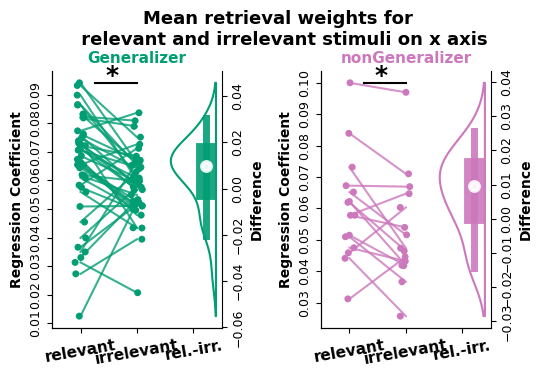

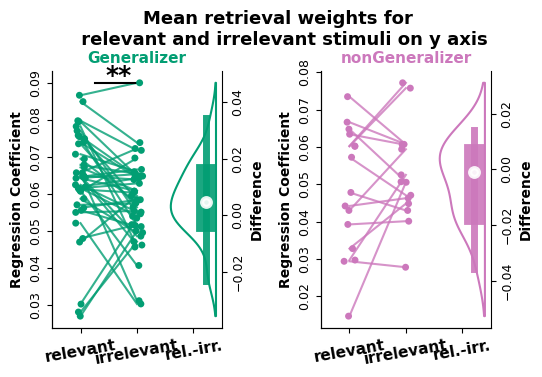

In [1321]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="vmPFC_bilateral")].copy()
mnames = ["relevant","irrelevant","rel.-irr."]
for axname in ["x","y"]:
    print(axname)
    compoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname==f"compoweight_{axname}")].copy()[["subid","value"]].assign(metricname=mnames[0])
    noncompoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname==f"noncompoweight_{axname}")].copy()[["subid","value"]].assign(metricname=mnames[1])
    
    assert compoweightpdf.shape[0]/len(subid_list) == 1
    assert noncompoweightpdf.shape[0]/len(subid_list) == 1
    compoweightpdf.sort_values(by="subid",inplace=True)
    noncompoweightpdf.sort_values(by="subid",inplace=True)

    retrievalweight_comparedf = pd.concat(
        [
            compoweightpdf,    
            noncompoweightpdf,
            pd.DataFrame({"subid":compoweightpdf.subid.values,
                          "value":compoweightpdf.value.values-noncompoweightpdf.value.values}).assign(metricname=mnames[2])

        ]
    ).reset_index(drop=True)
    retrievalweight_comparedf["subgroup"] = pd.Categorical(
        ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in retrievalweight_comparedf["subid"]],
        categories=["Generalizer","nonGeneralizer"],ordered=True)


    pdf = retrievalweight_comparedf[retrievalweight_comparedf.metricname.isin(mnames[:2])].copy()
    pdf.metricname = pd.Categorical(pdf.metricname,categories=mnames,ordered=True)
    
    gs = sns.catplot(data=pdf,
                x="metricname",y="value",
                #col="metricname",
                sharex=True,sharey=False,
                col="subgroup",
                hue="subgroup",palette=participantgrouphex,
                kind="strip",
                height=4,aspect=0.7,
                ).set_titles('{col_name}')
    gs.map_dataframe(sns.lineplot,x="metricname",y="value",
                    #color="grey",
                    units="subid",estimator=None,
                    hue="subgroup",palette=participantgrouphex,
                    alpha=0.8)


    for ax,(sgname,sgdf) in zip(gs.axes.flatten(),pdf.groupby("subgroup")):
        ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=10)
        ax.set_xlabel("")
        ax.set_title(sgname,fontsize=11,fontweight="bold",y=1,color=participantgrouphex[sgname])
        plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,rotation=10,ha="center")
        plt.setp(ax.get_yticklabels(),fontsize=9,rotation=90,va="center")
        axvio = ax.twinx()
        axvio.spines[['top']].set_visible(False)
        axvio.axhline(y=0,color="grey",ls="--",xmin=1.9)
        rel_w = sgdf[sgdf.metricname==mnames[0]].value.values
        irr_w = sgdf[sgdf.metricname==mnames[1]].value.values
        diffdata = pd.DataFrame({"value":rel_w-irr_w,"metricname":mnames[2]})
        diffdata.metricname = pd.Categorical(diffdata.metricname,categories=mnames,ordered=True)
        axvio.set_ylabel("Difference",fontweight="bold",fontsize=10)
        plt.setp(axvio.get_yticklabels(),fontsize=9,rotation=90,va="center")
        sns.violinplot(data = diffdata,
                    x="metricname",y="value",color=participantgrouphex[sgname],fill=False,
                    inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                    ax=axvio,split=True,alpha=1)
        pval = ttestpairedsamp_equiv_permutation(rel_w,irr_w)
        print(sgname,pval)
        if pval<0.05:
            ax.text(x=0.45,y=1*sgdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                    size=18,fontweight="bold")
            ax.axhline(xmin=0.25,xmax=0.5,y=1*sgdf.value.max(),color="black")

                
    gs.legend.remove()
    gs.figure.suptitle(f"Mean retrieval weights for \n relevant and irrelevant stimuli on {axname} axis",fontweight="bold",fontsize=13,y=0.93,x=0.4)
    gs.tight_layout()
    gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim",f"vmPFC_trteEncodingWDiff_{axname}.png"),dpi=300)

0.0071992800719928
0.22857714228577142


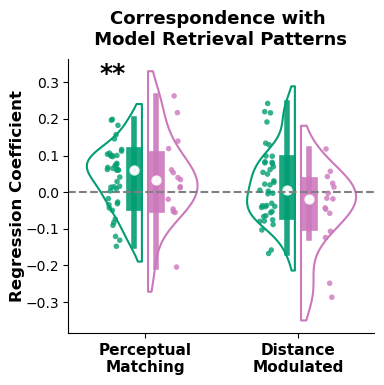

In [1226]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="vmPFC_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,
            kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1
            ).refline(y=0)
gs.map_dataframe(sns.stripplot,x="metricname",y="value",
                 jitter=0.1,
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 alpha=0.8,s=4
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11,rotation=0)
    for j,(tar,tardf) in enumerate(pdf.groupby(["metricname","subgroup"])):
        if tar[1]=="Generalizer":
            pval = ttest1samp_equiv_permutation(tardf.value.values)
            print(pval)
            minorplus = 1*((j%2)==1)
            dw = [-.3,0.15][minorplus]
            ax.text(x=np.floor(j/2)+dw,y=1.15*pdf.value.max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                    size=18,fontweight="bold")
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=13,y=0.95,x=0.4)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","vmPFC_trteEncoding.png"),dpi=300)

## predict test from loc

0.0005999400059994001
0.9123087691230877
0.00019998000199980003
0.00019998000199980003


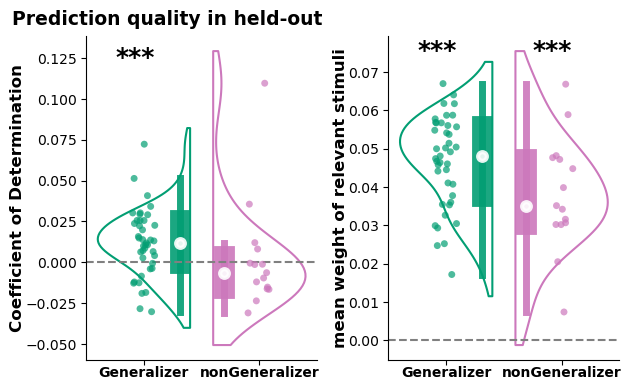

In [1346]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="vmPFC_bilateral")].copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['compoweight','eval_r2']))].copy()

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination",
                        "compoweight":"mean weight of relevant stimuli"}),
    categories=["Coefficient of Determination","mean weight of relevant stimuli"],ordered=True
)


gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="metricname",
            hue="subgroup",palette=participantgrouphex,
            #kind="bar",errorbar="se",fill=True,alpha=0.2,dodge=False,
            kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.8,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                 #color="grey",
                 hue="subgroup",palette=participantgrouphex,dodge=False,
                 alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.metricname==ax.title.get_text()]
    ax.set_ylabel(ax.title.get_text(),fontweight="bold",fontsize=12,labelpad=0)
    ax.set_xlabel('')
    #ax.set_xticks([-.25,.25],["Generalizer","nonGeneralizer"],fontweight="bold",fontsize=12)
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,
             rotation=0,ha="center")
    ax.tick_params(axis='x', which='major', pad=1)
             
    ax.set_title('')
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(pval)
        ax.text(x=j-0.25,y=1.1*axdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
gs.axes.flatten()[0].set_title("Prediction quality in held-out",fontweight="bold",fontsize=13.5,x=0.35,y=1.01)
gs.tight_layout()


Generalizer 0.00039996000399960006
nonGeneralizer 0.6835316468353164


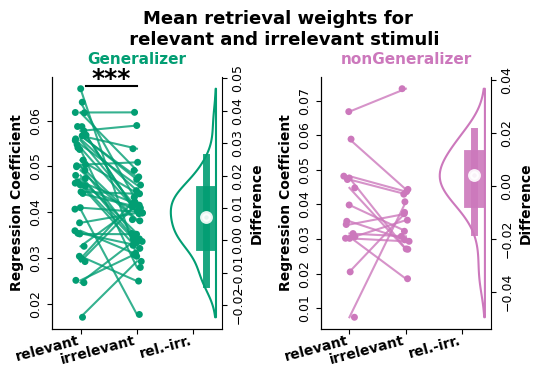

In [1347]:
compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.roi=="vmPFC_bilateral")].copy()
compoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname==f"compoweight")].copy()[["subid","value"]].assign(metricname=mnames[0])
noncompoweightpdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname==f"noncompoweight")].copy()[["subid","value"]].assign(metricname=mnames[1])

assert compoweightpdf.shape[0]/len(subid_list) == 1
assert noncompoweightpdf.shape[0]/len(subid_list) == 1
compoweightpdf.sort_values(by="subid",inplace=True)
noncompoweightpdf.sort_values(by="subid",inplace=True)

retrievalweight_comparedf = pd.concat(
    [
        compoweightpdf,    
        noncompoweightpdf,
        pd.DataFrame({"subid":compoweightpdf.subid.values,
                        "value":compoweightpdf.value.values-noncompoweightpdf.value.values}).assign(metricname=mnames[2])

    ]
).reset_index(drop=True)
retrievalweight_comparedf["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in retrievalweight_comparedf["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True)


pdf = retrievalweight_comparedf[retrievalweight_comparedf.metricname.isin(mnames[:2])].copy()
pdf.metricname = pd.Categorical(pdf.metricname,categories=mnames,ordered=True)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            #col="metricname",
            sharex=True,sharey=False,
            col="subgroup",
            hue="subgroup",palette=participantgrouphex,
            kind="strip",
            height=4,aspect=0.7,
            ).set_titles('{col_name}')
gs.map_dataframe(sns.lineplot,x="metricname",y="value",
                #color="grey",
                units="subid",estimator=None,
                hue="subgroup",palette=participantgrouphex,
                alpha=0.8)


for ax,(sgname,sgdf) in zip(gs.axes.flatten(),pdf.groupby("subgroup")):
    ax.set_ylabel("Regression Coefficient",fontweight="bold",fontsize=10)
    ax.set_xlabel("")
    ax.set_title(sgname,fontsize=11,fontweight="bold",y=1.02,color=participantgrouphex[sgname])
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=10,rotation=15,ha="right")
    ax.tick_params(axis='x', which='major', pad=0)
    plt.setp(ax.get_yticklabels(),fontsize=9,rotation=90,va="center")
    axvio = ax.twinx()
    axvio.spines[['top']].set_visible(False)
    axvio.axhline(y=0,color="grey",ls="--",xmin=1.9)
    rel_w = sgdf[sgdf.metricname==mnames[0]].value.values
    irr_w = sgdf[sgdf.metricname==mnames[1]].value.values
    diffdata = pd.DataFrame({"value":rel_w-irr_w,"metricname":mnames[2]})
    diffdata.metricname = pd.Categorical(diffdata.metricname,categories=mnames,ordered=True)
    axvio.set_ylabel("Difference",fontweight="bold",fontsize=10)
    plt.setp(axvio.get_yticklabels(),fontsize=9,rotation=90,va="center")
    sns.violinplot(data = diffdata,
                x="metricname",y="value",color=participantgrouphex[sgname],fill=False,
                inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                ax=axvio,split=True,alpha=1)
    pval = ttestpairedsamp_equiv_permutation(rel_w,irr_w)
    print(sgname,pval)
    if pval<0.05:
        ax.text(x=0.2,y=1.01*sgdf.value.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        ax.axhline(xmin=0.2,xmax=0.5,y=1.01*sgdf.value.max(),color="black")

            
gs.legend.remove()
gs.figure.suptitle(f"Mean retrieval weights for \n relevant and irrelevant stimuli",fontweight="bold",fontsize=13,y=0.93,x=0.4)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim",f"vmPFC_locteEncodingWDiff.png"),dpi=300)

## train-test separation

('Generalizer',) 0.00019998000199980003
('nonGeneralizer',) 0.00019998000199980003


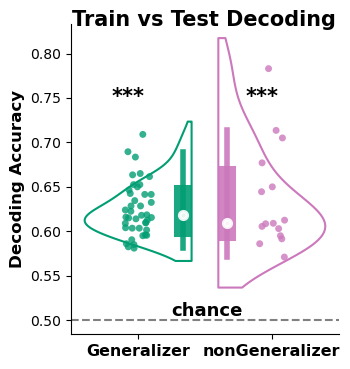

In [192]:
pdf = septraintestdc_performance_df[(septraintestdc_performance_df.roi=="vmPFC_bilateral")].copy() # &(nclocnavidc_performance_dfsum.subid.isin(generalizers))
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.5

pdf_sum = pdf.groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)


gs = sns.catplot(data=pdf_sum,
            x="subgroup",y="eval_acc",
            kind="violin", fill=False,split=True, gap=0,cut=True,
            inner="box",
            inner_kws = dict(box_width = 13, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),

            hue="subgroup",palette=participantgrouphex,
            #color="white", label=None,
            height=4,aspect=0.9
            )
gs.map_dataframe(sns.stripplot,x="subgroup",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=0.8,
                 hue="subgroup",palette=participantgrouphex,#dodge=True
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=11.5,rotation=0)
    ax.axhline(0.5,label="chance",color="grey",ls='--')
    for j, (tar,tardf) in enumerate(pdf_sum.groupby(["subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.eval_acc_above_chance.values)
        print(tar, pval)
        dw = [-.2,0.0][0]
        ax.text(x=j+dw,y=0.95*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontweight="bold",size=15)
    #hs,ls = ax.get_legend_handles_labels()
    #ax.legend([hs[0]],[ls[0]],loc="lower center",bbox_to_anchor=(0.3,0.85),ncol = 2,
    #        prop = dict(weight="bold",size=13),frameon=False)  
    ax.text(x=0.25,y=0.505,s="chance",fontweight="bold",size=13)
  
gs.figure.suptitle("Train vs Test Decoding",fontweight="bold",fontsize=15,x=0.58,y=0.91)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","traintest_separation.png"),dpi=300)

## beta weights

In [190]:
vmPFC_gtloceuc_wbbetaw_df = pd.read_csv(os.path.join(ROIRSAdir,"wbsearchlight_meangtlocweight_vmPFC.csv"))
vmPFC_gtloceuc_wbbetaw_df_long = pd.melt(vmPFC_gtloceuc_wbbetaw_df,id_vars=["subid"],var_name="stimuligroup",value_name="meancoef")
print(vmPFC_gtloceuc_wbbetaw_df_long.stimuligroup.unique())
vmPFC_gtloceuc_wbbetaw_df_long.head(5)

['localizer' 'trainingstim' 'teststim']


,subid,stimuligroup,meancoef
0,sub001,localizer,0.099441
1,sub002,localizer,0.035674
2,sub003,localizer,0.038860
3,sub004,localizer,-0.287853
4,sub005,localizer,0.057244


In [194]:
vmPFC_gtloceuc_wbbetaw_df_long["subgroup"] = pd.Categorical( 
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in vmPFC_gtloceuc_wbbetaw_df_long["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
vmPFC_gtloceuc_wbbetaw_df_long["stimuligroup_str"] = pd.Categorical(
    vmPFC_gtloceuc_wbbetaw_df_long["stimuligroup"].map(
        {"localizer":"localizer\npirate positions",
         "teststim": "treasure hunt\ntest stimuli",
         "trainingstim": "treasure hunt\ntraining stimuli",
         }),
    categories=["treasure hunt\ntraining stimuli",
                "treasure hunt\ntest stimuli",
                "localizer\npirate positions"],
    ordered=True
    )

c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)
c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)


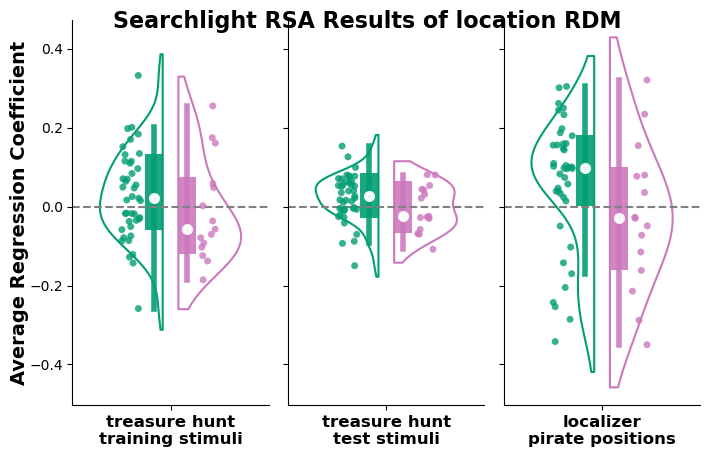

In [197]:
gs = sns.catplot(data=vmPFC_gtloceuc_wbbetaw_df_long.assign(constavar="participant"),
x="constavar",y="meancoef",
hue="subgroup",palette=participantgrouphex,
col="stimuligroup_str", sharey=True,sharex=False,facet_kws=dict(gridspec_kws={"wspace":0.1}),
kind="violin", split=True, inner="box", fill=False, gap=0.2,cut=True,
inner_kws = dict(box_width = 13, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
aspect=0.5,height=5
            ).set_titles("{col_name}").refline(y=0)

gs.map_dataframe(sns.stripplot,x="constavar",y="meancoef",
                 alpha=0.8,
                 hue="subgroup",palette=participantgrouphex,dodge=True
                 )


for j,ax in enumerate(gs.axes.flatten()):
    if j==0:
        ax.set_ylabel("Average Regression Coefficient",fontweight="bold",fontsize=14,labelpad=0)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    ax.set_xticks([0],[ax.get_title()])
    ax.set_title('')
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=12,rotation=0)

gs.legend.remove()    
for ax in gs.axes.flatten():
    ax.legend().remove()
  
gs.figure.suptitle("Searchlight RSA Results of location RDM",fontweight="bold",fontsize=16,x=0.45,y=0.9)
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","locationrdm_meancoef.png"),dpi=300)

## cross task decoding

('x-axis', 'Generalizer') 0.18637608517972967
('y-axis', 'Generalizer') 0.4221082055459382


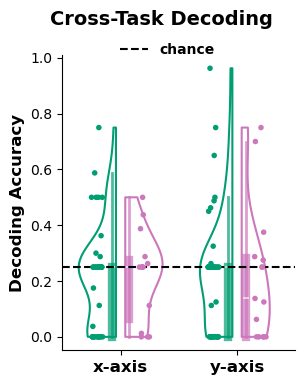

In [189]:
pdf = nclocnavidc_performance_dfsum[(nclocnavidc_performance_dfsum.roi.str.contains("vmPFC"))].copy() # &(nclocnavidc_performance_dfsum.subid.isin(generalizers))
#pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("HPC"))].copy()
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.25

#we only plot for test2loc bc we are using training to align the representations

pdf_sum = pdf[pdf.analysis=='test2loc'].groupby(["roi","subid","target"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["target_str"] = pd.Categorical(
    pdf_sum["target"].map({"stim_x":"x-axis",
                           "stim_y":"y-axis"}),
    categories=["x-axis","y-axis"],ordered=True)
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))].copy().reset_index(drop=True)
#pdf_sum["target"] = pd.Categorical(pdf_sum["target"],categories=["stim_x","stim_y"],ordered=True)

gs = sns.catplot(data=pdf_sum,
            x="target_str",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            kind="violin",split=True,gap=0.2,fill=False,cut=0,
            inner="box",inner_kws=dict(box_width=6, whis_width=2,alpha=0.7),
            #col="target_str",
            #color="white", label=None,
            height=4,aspect=0.8,
            )#.set_titles(template="{col_name}", fontweight="bold",fontsize=12)
gs.map_dataframe(sns.stripplot,x="target_str",y="eval_acc",
                 #color="grey",label="generalizers",
                 alpha=1,s=4,
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 )


for ax in gs.axes.flatten():
    ax.set_ylabel("Decoding Accuracy",fontweight="bold",fontsize=12)
    ax.set_xlabel("",fontweight="bold",fontsize=12)
    #ax.set_ylim([0,1])
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=12,rotation=0)
    ax.axhline(0.25,label="chance",color="k",ls='--')
    for j,(tar,tardf) in enumerate(pdf_sum.groupby(["target_str","subgroup"])):
        if tar[1]=="Generalizer":
            pval = scipy.stats.ttest_1samp(tardf.eval_acc_above_chance.values,0,alternative='two-sided').pvalue
            print(tar, pval)
            minorplus = 1*((j%2)==1)
            dw = [-.2,0.15][minorplus]
            ax.text(x=np.floor(j/2)+dw,y=0.83,s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontweight="bold",size=18)

    hs,ls = ax.get_legend_handles_labels()
    ax.legend([hs[-1]],[ls[-1]],loc="lower center",bbox_to_anchor=(0.45,0.95),ncol = 3,
            prop = {"weight":"bold"},frameon=False)  
gs.legend.remove()  
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.figure.suptitle("Cross-Task Decoding",fontweight="bold",fontsize=14,x=0.35,y=0.95)
gs.tight_layout()
gs.figure.savefig(os.path.join(ROIRSAdir,"vmPFChighdim","vmPFC_navilzerCCGP.png"),dpi=300)

# MDS result for all stim

In [622]:
rdm_mds_results = load(os.path.join(ROIRSAdir,"mds_results_rescaled.pkl"))

## Plot MDS result of V1

In [ ]:
stimdf = roi_data["V1_bilateral"][0]["stimdf"].copy()
stimdf_one_sess = stimdf[stimdf.stim_session==0].copy()
stimdf_one_sess["sg_name"] = stimdf_one_sess.stim_group.map({0:"test",1:"training"})
stimdf_one_sess.sort_values(["sg_name","training_axset","training_axlocTL","stim_x","stim_y"],inplace=True)
stimdf_one_sess["stim_name"] = ["[%d,%d]"%(x*2,y*2) for x,y in stimdf_one_sess[["stim_x","stim_y"]].to_numpy()]

sfilts = generate_filters(stimdf_one_sess)
plot_rdmds = {
    "train-test separation": compute_rdm_identity(stimdf_one_sess[sfilts["allstim"]].copy().stim_group.values),
    "test2d":compute_rdm(stimdf_one_sess[sfilts["test"]].copy()[["stim_x","stim_y"]],"euclidean"),
    "lzer2d":compute_rdm(stimdf_one_sess[sfilts["training_all"]].copy()[["stim_x","stim_y"]],"euclidean")
}
axticks = {
    "train-test separation": stimdf_one_sess[sfilts["allstim"]].copy()["stim_name"].values,
    "test2d":stimdf_one_sess[sfilts["test"]].copy()["stim_name"].values,
    "lzer2d":stimdf_one_sess[sfilts["training_all"]].copy()["stim_name"].values
}
   
for j, (k,v) in enumerate(plot_rdmds.items()):
    fig,ax=plt.subplots(1,1,figsize=(6,5))
    im = ax.imshow(v)
    ax.set_xticks(np.arange(v.shape[0]),axticks[k],rotation=90)
    ax.set_yticks(np.arange(v.shape[1]),axticks[k],rotation=0)
    for txt in ax.get_xticklabels():
        if '0' in txt.get_text():
            txt.set_color(train_test_color_pal["Training Stimuli"])
        else:
            txt.set_color(train_test_color_pal["Test Stimuli"])
    for txt in ax.get_yticklabels():
        if '0' in txt.get_text():
            txt.set_color(train_test_color_pal["Training Stimuli"])
        else:
            txt.set_color(train_test_color_pal["Test Stimuli"])
    if k=="train-test separation":
        ax.annotate(text="Training Stimuli",xy=(-0.2,-0.1),xycoords=ax.transAxes,
                    color=train_test_color_pal["Training Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text="Test Stimuli",xy=(-0.2,0.55),xycoords=ax.transAxes,
                    color=train_test_color_pal["Test Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text="Training Stimuli",xy=(0.6,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal["Training Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        ax.annotate(text="Test Stimuli",xy=(0.15,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal["Test Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        fig.suptitle("Model RDM",fontweight="bold",fontsize=16,y=0.95)
    else:
        txt = "Test Stimuli" if k=="test2d" else "Pirate Positions"
        txtcol = "Test Stimuli" if k=="test2d" else "Training Stimuli"
        ax.annotate(text=txt,xy=(-0.22,0.3),xycoords=ax.transAxes,
                    color=train_test_color_pal[txtcol],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text=txt,xy=(0.3,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal[txtcol],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        fig.suptitle("Model RDM",fontweight="bold",fontsize=18,y=0.95)
    
    cb = plt.colorbar(im,orientation="vertical",cax=None,ax=ax,fraction=0.1,pad=0.05,aspect=10)
    cb.ax.set_title("Dissimilarity",fontweight="bold",fontsize=16,y=0.23,x=1.8,rotation=90)
    cb.ax.set_yticks([v.min(),v.max()],["very\nsimilar","very\ndissimilar"],fontsize=15)


In [ ]:
eucrdm = compute_rdm(stimdf[["stim_x","stim_y"]].to_numpy(),"euclidean")
ftrdm  = compute_rdm_nomial(stimdf[["stim_x","stim_y"]].to_numpy())


In [ ]:
import sklearn.manifold


ssname = "training_nocenter"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

roirdm, roimdsdf = deepcopy(rdm_mds_results["aveRDM"][ssname][roi][cname]["G"]),deepcopy(rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"])

eucrdm = compute_rdm(roimdsdf[["stim_x","stim_y"]].to_numpy(),"euclidean")
ftrdm  = compute_rdm_nomial(roimdsdf[["stim_x","stim_y"]].to_numpy())
#roimdsdf[["MDS1","MDS2","MDS3"]] = sklearn.manifold.MDS(n_components=3,dissimilarity="precomputed",eps=1e-10,metric=True
#                                                        ).fit_transform(minmax_scale(roirdm,0,2))
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_x_str"] = roimdsdf["stim_x"].astype(str)
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"test",1:"training"})

np.fill_diagonal(roirdm,np.nan)
np.fill_diagonal(eucrdm,np.nan)
np.fill_diagonal(ftrdm,np.nan)
print(scipy.stats.spearmanr(lower_tri(roirdm)[0],
                            lower_tri(eucrdm)[0])
                            )
print(scipy.stats.spearmanr(lower_tri(roirdm)[0],
                            lower_tri(ftrdm)[0])
                            )
fig_rdm, axes_rdm = plt.subplots(1,3,figsize=(9,2.5))
plot_rdm_withlabel(eucrdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[0])
plot_rdm_withlabel(ftrdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[1])
plot_rdm_withlabel(roirdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[2])

pxfig = px.scatter_3d(roimdsdf,x="MDS1",y="MDS2",z="MDS3",
                color="stim_x_str",symbol="stim_y",
                color_discrete_map=dict(zip(["-2.0","-1.0","0.0","1.0","2.0"],[stimycolorhex[x] for x in [-2,-1,0,1,2]])),
                symbol_map=dict(zip([-2,-1,0,1,2],["square-open","square","cross","circle","circle-open"]))
                ) # ['circle', 'circle-open', 'cross', 'diamond', 'diamond-open', 'square', 'square-open', 'x']

pxfig.update_layout(#
    title_text=f"{roi} {ssname}",
    title_subtitle_text='%s Generalizers' % (cname),
    title_x=0.3,title_y=0.9,
    title_font_weight="bold",title_font_size=20,
    title_subtitle_font_size=20)


## imagery map in V1

### all stimuli

In [ ]:
ssname = "allstim"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"Generalizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=-20, azim=80,roll=92)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

### test stim only

In [ ]:
ssname = "test"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"MDS in bilateral V1\nGeneralizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=250,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

# Change the viewing angle
ax.view_init(elev=10, azim=71,roll=90)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)


## Plot MDS result of testgtlocParietalSup_bilateral

In [ ]:
rois

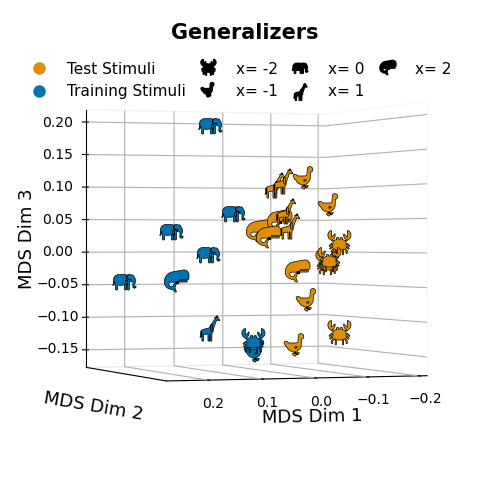

In [670]:
ssname = "allstim"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title="Generalizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"Test Stimuli",1:"Training Stimuli"})
roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(8,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y,sg), group in roimdsdf.groupby(['stim_x', 'stim_y','stim_group_str']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=train_test_color_pal[sg],#stimycolorhex[stim_y], 
            marker=stimxanimalmarkers[stim_x],
            s=400,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=train_test_color_pal[i], markersize=10, label='%s'%(i))
                for i in np.sort(roimdsdf["stim_group_str"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict={"weight":"bold","size":15},y=1) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13},labelpad=2)
ax.set_ylabel('MDS Dim 2',fontdict={"size":13},labelpad=0,rotation=15)
ax.set_zlabel('MDS Dim 3',fontdict={"size":13},labelpad=12)
ax.set_yticks([])
ax.tick_params(axis='both', which='both', pad=2)
ax.tick_params(axis='z', which='both', pad=8)
plt.setp(ax.get_xticklabels(),rotation=0,ha="center")
plt.setp(ax.get_zticklabels(),rotation=0,ha="center",va="center")

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Change the viewing angle
ax.view_init(elev=0, azim=70,roll=0)
ax.set_box_aspect([1, 1, 1],zoom=0.95) 
ax.legend(handles=color_legend + marker_legend, loc='center left', bbox_to_anchor=(0., 0.85),fontsize=11,ncol=4,frameon=False,columnspacing=0.5)


# Adjust the axis limits to avoid cropping
fig.tight_layout()
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)


In [ ]:
rdm_mds_results["aveRDM"].keys()

In [ ]:
ssname = "trainloc_all"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title="MDS in bilateral ParietalSup"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"test",1:"training"})
roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y,sg), group in roimdsdf.copy().groupby(['stim_x', 'stim_y','stim_group_str']):
    #for p in stimxanimalmarkers[stim_x]:
    #group['MDS3'] = group['MDS2']
    #group['MDS2'] = 0
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], #stim_group_pal[sg],#
            marker=stimxanimalmarkers[stim_x],
            s=250,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y = %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x = %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Change the viewing angle
ax.view_init(elev=0, azim=90,roll=0)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)



In [ ]:
# Change the viewing angle
ax.view_init(elev=150, azim=80,roll=100)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)


# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
fig
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

In [ ]:
rdm_mds_results["aveRDM"].keys()

In [ ]:
ssname = "test"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title="MDS in bilateral ParietalSup"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"Test Stimuli",1:"Training Stimuli"})
roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y,sg), group in roimdsdf.groupby(['stim_x', 'stim_y','stim_group_str']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=train_test_color_pal[sg],#stimycolorhex[stim_y], 
            marker=stimxanimalmarkers[stim_x],
            s=250,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=train_test_color_pal[i], markersize=10, label='%s stimuli'%(i))
                for i in np.sort(roimdsdf["stim_group_str"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Change the viewing angle
ax.view_init(elev=0, azim=80,roll=10)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)


# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

rescaled_ave_rdm = minmax_scale(roirdm,0,1)
np.fill_diagonal(rescaled_ave_rdm,np.nan)
sns.heatmap(rescaled_ave_rdm)

# Plot Parallel Axis Groups

## Distribution for main task

In [ ]:
rois

In [59]:
#load precalculated PS and null distribution of PS
ROIPS_dict = load(os.path.join(ROIRSAdir,"axisPS","PS_NCtrainingstim.pkl"))
sub_cs_perms, sub_cs_obs = ROIPS_dict["permutation"], ROIPS_dict["observation"]
PS_classification = pd.read_csv(os.path.join(ROIRSAdir,"axisPS","PS_classification.csv"))

Index(['Unnamed: 0', 'testgtlocTPMid_bilateral',
       'testgtlocParietalSup_bilateral', 'HPCPHPC_bilateral', 'HPC_bilateral',
       'vmPFC_bilateral', 'V1_bilateral', 'V2_bilateral', 'subid'],
      dtype='object')


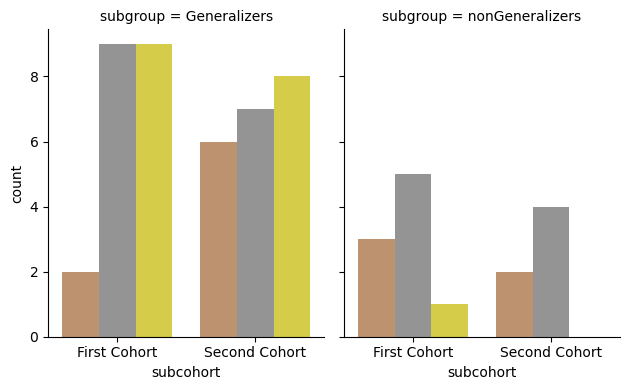

In [69]:
print(PS_classification.columns)
PS_classification["subgroup"] = pd.Categorical(
    ["Generalizers" if subid in generalizers else "nonGeneralizers" for subid in PS_classification["subid"]],
    categories=["Generalizers","nonGeneralizers"],ordered=True)
PS_classification["subcohort"] = pd.Categorical(
    ["First Cohort" if subid in cohort1ids else "Second Cohort" for subid in PS_classification["subid"]],
    categories=["First Cohort","Second Cohort"],ordered=True)

gs = sns.FacetGrid(PS_classification,col="subgroup",height=4,aspect=0.8)
gs.map_dataframe(sns.countplot,x="subcohort",hue="HPC_bilateral",palette=psgroupnum_huedict,legend="auto")


In [19]:
np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).shape

(41, 10000)

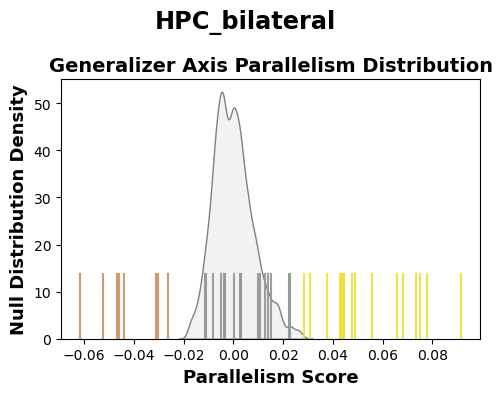

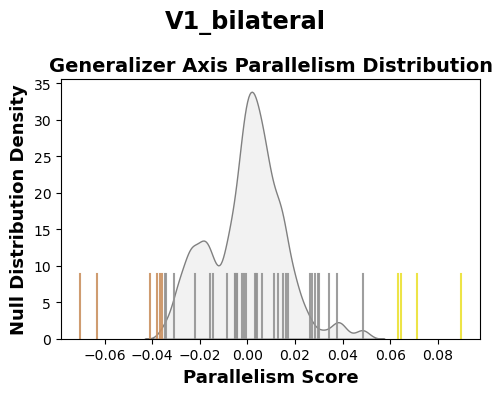

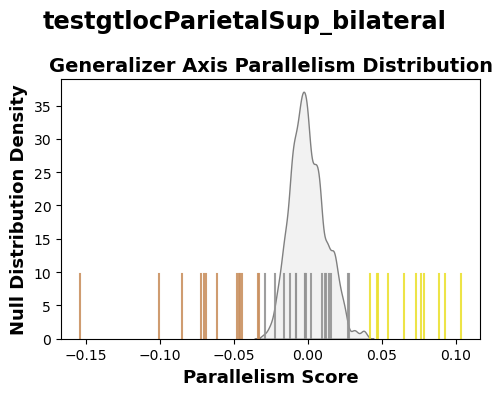

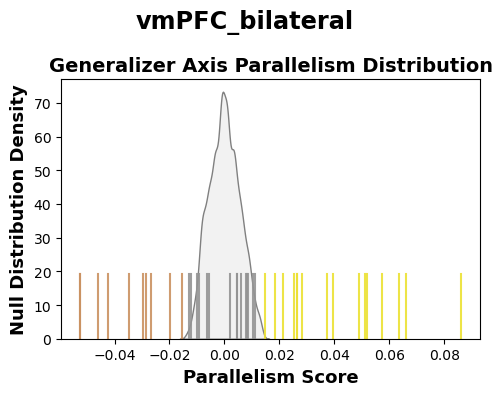

In [ ]:
sname, slist = "combined", subid_list        
plot_rois = ['HPC_bilateral', 'V1_bilateral','testgtlocParietalSup_bilateral','vmPFC_bilateral']
for j,roi in enumerate(plot_rois):
    fig_cs,axes_cs = plt.subplots(1,1,figsize=(7,4))
    GnG_colors = sns.color_palette(None,2)
    twinaxes_cs = []
    cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]

    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist]).mean(axis=0)
    #cs_G = G_null

    sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                x="null",bw_adjust=1,
                color="grey",fill=True,alpha=0.1,ax=axes_cs)
    #twinax = axes_cs.twinx()
    #sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_G).T,columns=["Generalizers"]),
    #            x="Generalizers",bw_adjust=1,
    #            color="blue",fill=True,alpha=0.5,ax=twinax)
    #sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_NG).T,columns=["nonGeneralizers"]),
    #            x="nonGeneralizers",bw_adjust=1,
    #            color="orange",fill=True,alpha=0.5,ax=twinax)
    axylim = axes_cs.get_ylim()
    axxlim = axes_cs.get_xlim()
    
    for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification[roi]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.9 #0.3 if abs(subrc)==1 else 0.9
            axes_cs.axvline(x,ymin=0,ymax=.25,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)

    G_csmu = np.mean(cs_G)
    #axes_cs.axvline(x=G_csmu,color=GnG_colors[0],label="Generalizers")
    NG_csmu = np.mean(cs_NG)
    Gp = (1 - np.mean([G_csmu>csn for csn in cs_null]))
    NGp = (1 - np.mean([NG_csmu>csn for csn in cs_null]))
    #if Gp<0.05:
    #    axes_cs.text(axxlim[0],0.8*axylim[1],f"Generalizers: mean PS={'%.3f' % G_csmu} ({gen_pval_annot(Gp)})",color=GnG_colors[0])
    #else:
    #    axes_cs.text(axxlim[0],0.8*axylim[1],f"Generalizers: mean PS={'%.3f' % G_csmu}",color=GnG_colors[0])
    
    axes_cs.set_title("Generalizer Axis Parallelism Distribution",fontweight="bold",fontsize=14)
    axes_cs.set_xlabel("Parallelism Score",fontsize=13,fontweight="bold")
    axes_cs.set_ylabel("Null Distribution Density",fontsize=13,fontweight="bold")

    #fig_cs.text(x=0.5, y=-.01, s='asterisks show uncorrected P-value of permutation test (one-sided)')
    fig_cs.suptitle(roi,fontweight="bold",fontsize="xx-large")
    fig_cs.tight_layout()


In [71]:
PS_aveactivitypattern = pd.DataFrame(sub_cs_obs)
print(PS_aveactivitypattern.columns)
print(PS_aveactivitypattern["HPC_bilateral"].unique())
PS_aveactivitypattern["subid"] = subid_list
PS_aveactivitypattern["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in PS_aveactivitypattern["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True)
PS_aveactivitypattern["subcohort"] = pd.Categorical(
    ["First Cohort" if subid in cohort1ids else "Second Cohort" for subid in PS_aveactivitypattern["subid"]],
    categories=["First Cohort","Second Cohort"],ordered=True)


Index(['testgtlocTPMid_bilateral', 'testgtlocParietalSup_bilateral',
       'HPCPHPC_bilateral', 'HPC_bilateral', 'vmPFC_bilateral', 'V1_bilateral',
       'V2_bilateral'],
      dtype='object')
[ 0.06572263 -0.03866208 -0.00839792  0.0261322  -0.03130063  0.00014483
 -0.04700746  0.07785895  0.01489999 -0.04018034  0.04456537 -0.00231996
  0.01645424  0.01878181  0.04414408 -0.00392369 -0.08734444  0.01078163
  0.02222451  0.09145123  0.05409282  0.05561454  0.01992889  0.07327479
 -0.0032589   0.00276925  0.02270042  0.04279134  0.06822866 -0.02037652
  0.01278388 -0.05239915  0.04867094  0.02016448  0.00997932 -0.04400137
  0.04338192 -0.04606441  0.03092633 -0.00519644 -0.01147921 -0.03050144
  0.0029443  -0.02613643 -0.01103446  0.0130361  -0.06167195 -0.05296489
  0.00531513  0.04784154  0.02815725  0.07510907  0.04423767  0.03753488
  0.01384959  0.00982412]


In [72]:
print(participantgrouphex)
PS_aveactivitypattern.subgroup.unique()
ax.get_title()

{'Generalizer': '#029e73', 'nonGeneralizer': '#cc78bc'}


'nonGeneralizer'

In [82]:
def correlation_equiv_permutation(y1,y2,corrfun,corr_kwargs={},n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: corrfun(y1,y2),
                                       n_resamples=n_perm,permutation_type="pairings",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res

HPC_bilateral vmPFC_bilateral Generalizer
rho = 0.5294, pval = 0.0006
HPC_bilateral vmPFC_bilateral nonGeneralizer
rho = 0.3695, pval = 0.1830


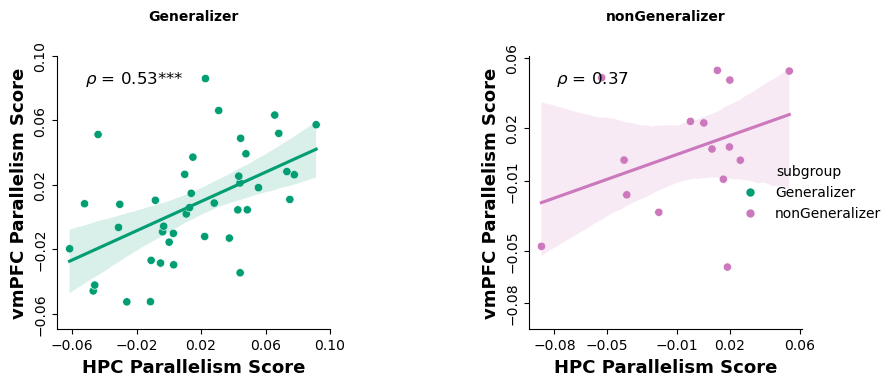

In [168]:
def pearsonrcorr(data,x, y, ax=None,**kwargs):
    res = scipy.stats.pearsonr(data[x], data[y])
    rho,pval = res.statistic, res.pvalue
    corrfun = lambda y1,y2: scipy.stats.pearsonr(y1,y2).statistic
    pval = correlation_equiv_permutation(data[x],data[y],corrfun,n_perm=10000,return_ponly=True)
    ax = ax if ax is not None else plt.gca()
    if pval<=0.05:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}{gen_pval_annot(pval,show_pval=False)}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    else:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    print(f"rho = {rho:.4f}, pval = {pval:.4f}")

shortnames = {
    "vmPFC_bilateral":"vmPFC",
    "HPC_bilateral":"HPC",
    "V1_bilateral":"V1",
    "testgtlocParietalSup_bilateral":"Superior Parietal"
}
for xvar in ["HPC_bilateral"]:#,"vmPFC_bilateral"]:
    for yvar in ["vmPFC_bilateral"]:#,"testgtlocParietalSup_bilateral","V1_bilateral"]:
        gs = sns.relplot(
            PS_aveactivitypattern,
            x=xvar,
            y=yvar,
            col="subgroup",
            hue="subgroup",
            palette=participantgrouphex,
            kind="scatter",
            height=4,aspect=1,
            facet_kws={"sharey":False,"sharex":False}
        ).set_titles("{col_name}",fontweight="bold",fontsize=16,y=1.1)
        #gs.map_dataframe(pearsonrcorr,x=xvar,y=yvar)
        for ax in gs.axes.flatten():
            print(xvar, yvar,  ax.get_title())
            pearsonrcorr(data=PS_aveactivitypattern[PS_aveactivitypattern["subgroup"]==ax.get_title()].copy(),
                        x=xvar,
                        y=yvar,ax=ax)
            sns.regplot(data=PS_aveactivitypattern[PS_aveactivitypattern["subgroup"]==ax.get_title()].copy(),
                        x=xvar,
                        y=yvar,scatter=False,
                        color=participantgrouphex[ax.get_title()],
                        ax=ax)
            ax.set_xlabel(f"{shortnames[xvar]} Parallelism Score",fontsize=13,fontweight="bold")
            ax.set_ylabel(f"{shortnames[yvar]} Parallelism Score",fontsize=13,fontweight="bold")
            xl,yl = ax.get_xlim(), ax.get_ylim()
            ax.set_aspect(1)
            newl = min(xl[0],yl[0])
            newh = max(xl[1],yl[1])
            ax.set_xlim(newl,newh)
            ax.set_ylim(newl,newh)
            ax.set_xticks(np.round(np.linspace(newl*0.9, newh,5),2))
            ax.set_yticks(np.round(np.linspace(newl*0.9, newh,5),2))
            plt.setp(ax.get_yticklabels(),rotation=90,va="center")
        gs.fig.tight_layout()




In [88]:
axes_set = np.array([[0,1],[1,0]])
axes_location = np.eye(4)


In [ ]:
x_locs = np.array([(np.atleast_2d(al).T @ (axes_set[[0],:])) for al in axes_location])
y_locs = np.array([(np.atleast_2d(al).T @ (axes_set[[1],:])) for al in axes_location])
print(x_locs)
print(y_locs)


from multivariate.pirateOMutils import parallel_axes_cosine_sim
parallel_axes_cosine_sim(x_locs,y_locs)

[[[0. 1.]
  [0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 1.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 1.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]
  [0. 1.]]]
[[[1. 0.]
  [0. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [1. 0.]
  [0. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [1. 0.]
  [0. 0.]]

 [[0. 0.]
  [0. 0.]
  [0. 0.]
  [1. 0.]]]


ValueError: could not broadcast input array from shape (4,2) into shape (4,)

In [86]:
(np.array([[0,1]]).T) @ np.array([[1,0,0,0]])

array([[0, 0, 0, 0],
       [1, 0, 0, 0]])

In [85]:
(np.array([[1,0]]).T) @ np.array([[1,0,0,0]])

array([[1, 0, 0, 0],
       [0, 0, 0, 0]])

In [22]:
sub_cs_perms.keys()

dict_keys(['allgtlocPrecentral_left', 'HPC_bilateral', 'V1_bilateral', 'vmPFC_bilateral', 'testgtlocParietalSup_bilateral'])

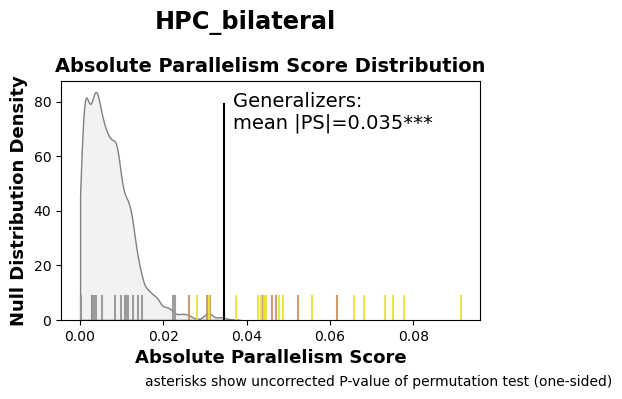

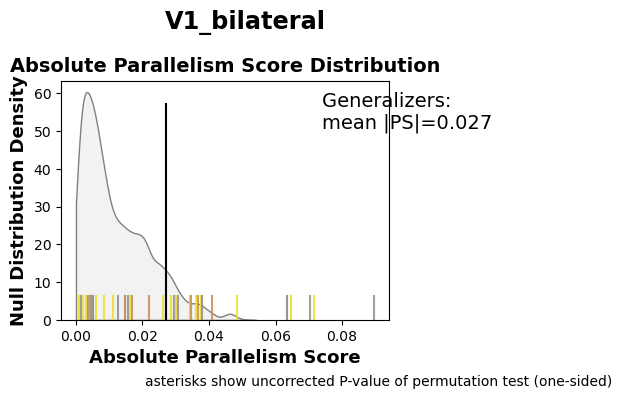

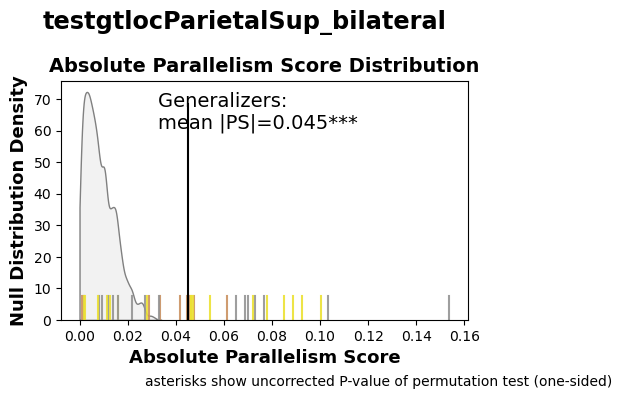

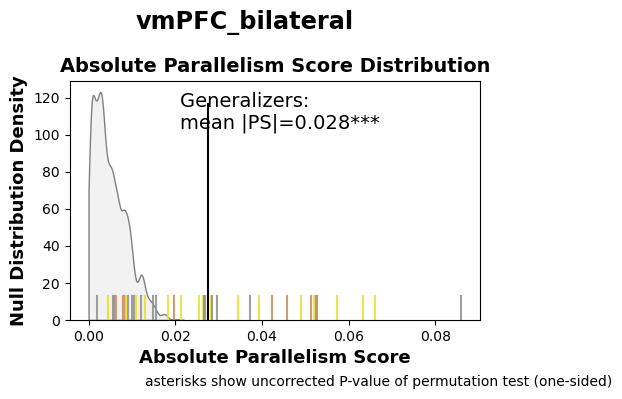

In [ ]:
# Look at the absolute value of PS, we should get sth like a  half-normal distribution  for the null of abs(PS)

GnG_colors = ["black","grey"]
plotng = False

sname, slist = "combined", subid_list        
plot_rois = ['HPC_bilateral','V1_bilateral','testgtlocParietalSup_bilateral','vmPFC_bilateral']
for j,roi in enumerate(plot_rois):
    fig_cs,axes_cs = plt.subplots(1,1,figsize=(5,3.8))
    cs_null = np.abs(np.mean(sub_cs_perms[roi],axis=0))
    #cs_null = np.mean(np.abs(sub_cs_perms[roi]),axis=0)
    cs_G = [np.abs(cs) for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
    cs_NG = [np.abs(cs) for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]
    
    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist]).mean(axis=0)
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    cs_null = Gabs_null

    sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                x="null",bw_adjust=1,common_norm=True,
                clip=(0,None),
                color="grey",fill=True,alpha=0.1,ax=axes_cs)
    axylim = axes_cs.get_ylim()
    axxlim = axes_cs.get_xlim()

    for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification["HPC_bilateral"]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.9
            axes_cs.axvline(abs(x),ymin=0,ymax=.1,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)

    G_csmu = np.mean(cs_G)
    axes_cs.axvline(x=G_csmu,ymin=0,ymax=.9,color=GnG_colors[0],label="Generalizers")
    Gp = (1 - np.mean([G_csmu>csn for csn in cs_null]))
    if Gp<0.01:
        axes_cs.text(1.3*axxlim[1],0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu}{gen_pval_annot(Gp,show_pval=False)}",color=GnG_colors[0],size=14)
    else:
        axes_cs.text(1.3*axxlim[1],0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu}",color=GnG_colors[0],size=14)
    if plotng:    
        NG_csmu = np.mean(cs_NG)
        axes_cs.axvline(x=NG_csmu,color=GnG_colors[1],label="Generalizers")
        NGp = (1 - np.mean([NG_csmu>csn for csn in nGabs_null]))
        if NGp<0.01:
            axes_cs.text(axxlim[0],0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu} ({gen_pval_annot(NGp)})",color=GnG_colors[1])
        else:
            axes_cs.text(axxlim[0],0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu}",color=GnG_colors[1])

    axes_cs.set_title("Generalizer Absolute Parallelism Score Distribution",fontweight="bold",fontsize=14)
    axes_cs.set_xlabel("Absolute Parallelism Score",fontsize=13,fontweight="bold")
    axes_cs.set_ylabel("Null Distribution Density",fontsize=13,fontweight="bold")

        

    fig_cs.text(x=0.3, y=-.01, s='asterisks show uncorrected P-value of permutation test (one-sided)')
    fig_cs.suptitle(roi,fontweight="bold",fontsize="xx-large")
    fig_cs.tight_layout()


## Distribution for localizer task

In [41]:
#load precalculated PS and null distribution of PS 
ROIPS_dict = load(os.path.join(ROIRSAdir,"axisPS","PS_NCtrainingloc.pkl"))
lzersub_cs_perms, lzersub_cs_obs = ROIPS_dict["permutation"], ROIPS_dict["observation"]


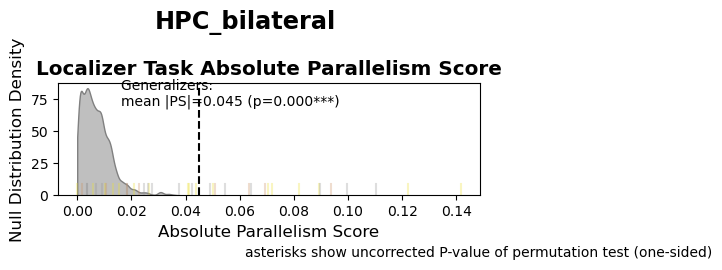

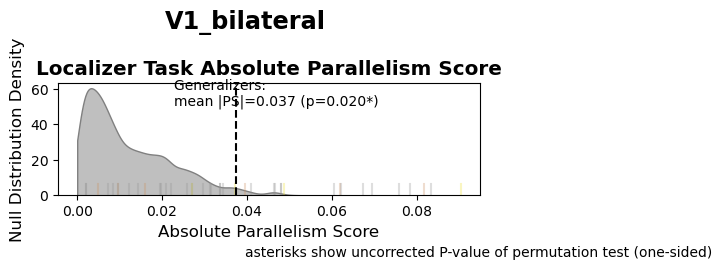

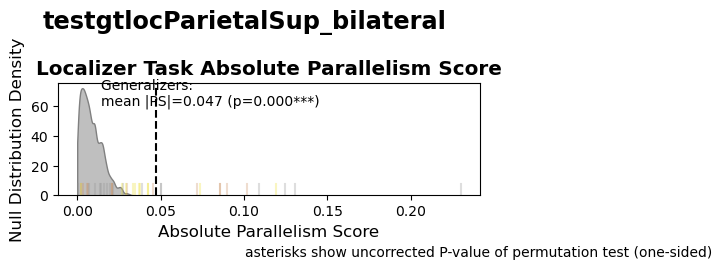

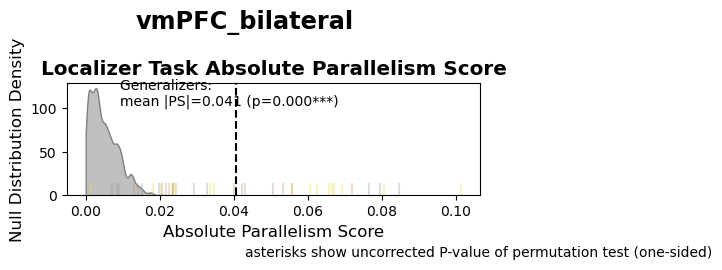

In [49]:
# Look at the absolute value of PS, we should get sth like a  half-normal distribution  for the null of abs(PS)

GnG_colors = ["black","grey"]
plotng = False

sname, slist = "combined", subid_list        
plot_rois = ['HPC_bilateral','V1_bilateral','testgtlocParietalSup_bilateral','vmPFC_bilateral']
for j,roi in enumerate(plot_rois):
    fig_cs,axes_cs = plt.subplots(1,1,figsize=(5,2.5))
    cs_null = np.abs(np.mean(lzersub_cs_perms[roi],axis=0))
    cs_G = [np.abs(cs) for cs,subid in zip(lzersub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
    cs_NG = [np.abs(cs) for cs,subid in zip(lzersub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]

    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist]).mean(axis=0)
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    cs_null = Gabs_null
    
    sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                x="null",bw_adjust=1,common_norm=True,
                clip=(0,None),
                color="grey",fill=True,alpha=0.5,ax=axes_cs)
    axylim = axes_cs.get_ylim()
    axxlim = axes_cs.get_xlim()

    for x,subid,subrc in zip(lzersub_cs_obs[roi],subid_list,PS_classification[roi]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.3
            axes_cs.axvline(abs(x),ymin=0,ymax=.1,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)

    G_csmu = np.mean(cs_G)
    axes_cs.axvline(x=G_csmu,color=GnG_colors[0],label="Generalizers",linestyle="--")
    Gp = (1 - np.mean([G_csmu>csn for csn in Gabs_null]))
    if Gp<0.05:
        axes_cs.text(axxlim[1]*0.4,0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu} ({gen_pval_annot(Gp)})",color=GnG_colors[0])
    else:
        axes_cs.text(axxlim[1]*0.4,0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu}",color=GnG_colors[0])
    if plotng:    
        NG_csmu = np.mean(cs_NG)
        axes_cs.axvline(x=NG_csmu,color=GnG_colors[1],label="nonGeneralizers",linestyle="--")
        NGp = (1 - np.mean([NG_csmu>csn for csn in nGabs_null]))
        if NGp<0.05:
            axes_cs.text(axxlim[1]*0.4,0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu} ({gen_pval_annot(NGp)})",color=GnG_colors[1])
        else:
            axes_cs.text(axxlim[1]*0.4,0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu}",color=GnG_colors[1])
        
    axes_cs.set_title("Localizer Task Absolute Parallelism Score",fontweight="bold",fontsize="x-large")
    axes_cs.set_xlabel("Absolute Parallelism Score",fontsize="large")
    axes_cs.set_ylabel("Null Distribution Density",fontsize="large")

        

    fig_cs.text(x=0.5, y=-.01, s='asterisks show uncorrected P-value of permutation test (one-sided)')
    fig_cs.suptitle(roi,fontweight="bold",fontsize="xx-large")
    fig_cs.tight_layout()


## MDS plots

In [138]:
PSAXrdm_mds_results = load(os.path.join(ROIRSAdir,'axisPS','MDS',"ParallAx_nonmetricmds_results.pkl")) # nonmetric_
mds_output_dir = os.path.join(ROIRSAdir,'axisPS','MDS')

### Animation

In [139]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.animation as animation
def update_view(num,angles,ax):
    angle = angles[num]
    # Normalize the angle to the range [-180, 180] for display
    angle_norm = (angle + 180) % 360 - 180

    # Cycle through a full rotation of elevation, then azimuth, roll, and all
    elev = azim = roll = 0
    if angle <= 360:
        elev = angle_norm
    elif angle <= 360*2:
        azim = angle_norm
    elif angle <= 360*3:
        roll = angle_norm
    else:
        elev = azim = roll = angle_norm
    ax.view_init(elev, azim, roll)
    ax.set_title('Elevation: %d°, Azimuth: %d°, Roll: %d°' % (elev, azim, roll))
    return ax

MovieWriter ffmpeg unavailable; using Pillow instead.


(noncenter) training stimuli MDS
 in top-left Generalizers


MovieWriter ffmpeg unavailable; using Pillow instead.


(noncenter) training stimuli MDS
 in top-right Generalizers


MovieWriter ffmpeg unavailable; using Pillow instead.


(noncenter) training stimuli MDS
 in orthogonal Generalizers


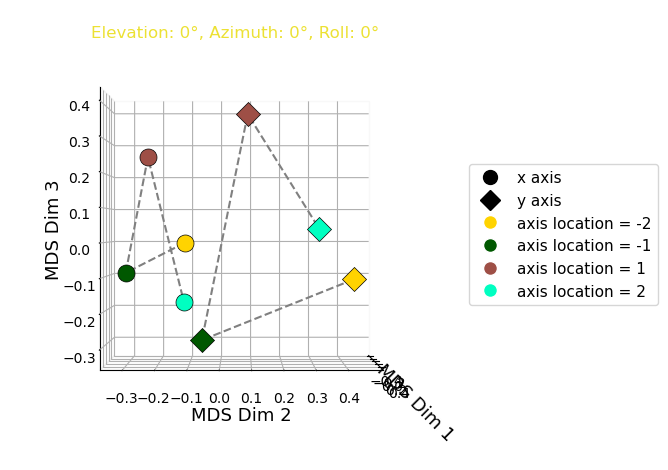

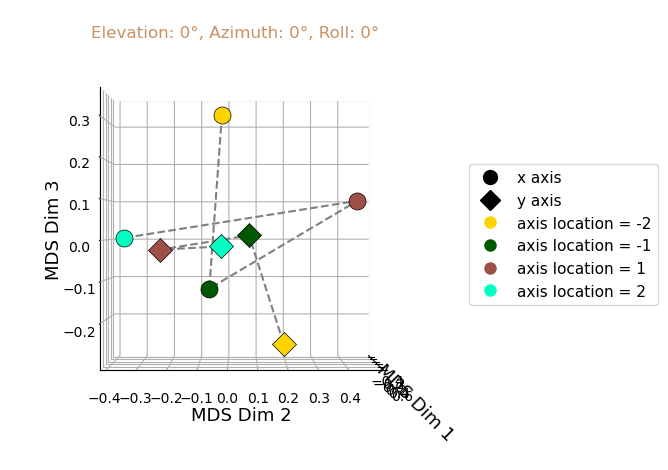

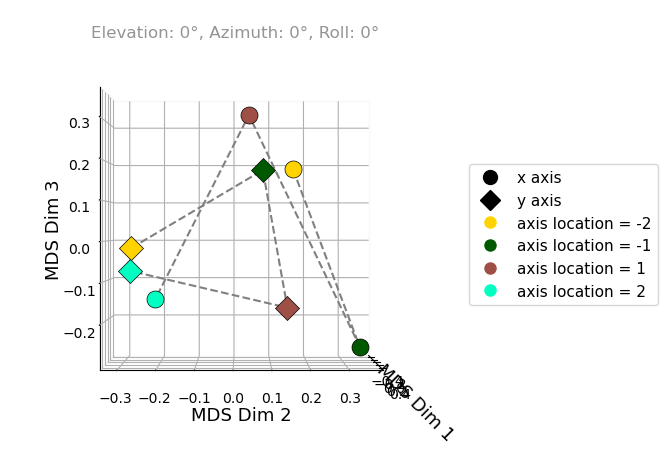

In [140]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
ncompo = 3

for psgroupname in ['top-left', 'top-right','orthogonal']:
    plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"
    print(plot_title)
    
    roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])

    roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot each group with different color and marker
    for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
        ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
                color=stimycolorhex[tl], marker=axis_group_markers[ta],
                s=150,edgecolor='black',linewidth=0.5,
                label=f'{ta},{tl}')

    for ta,group in roimdsdf.groupby('training_axsetstr'):
        ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
                color="grey",linestyle="--")    

    # Create custom legends
    color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                    for i in np.sort(roimdsdf["training_axlocTL"].unique())]
    marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                    for i in np.sort(roimdsdf["training_axsetstr"].unique())]

    # Set plot title and labels
    ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
    ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
    ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
    ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

    ax.set_box_aspect([1, 1, 1]) 
    ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    # Adjust the axis limits to avoid cropping
    fig.tight_layout(pad=0.4)
    ax.view_init(elev=0, azim=0,roll=0)

    angles = np.arange(0, 360*4 + 1,10)
    # Creating the Animation object
    ani = animation.FuncAnimation(
        fig, func=update_view, frames=range(len(angles)), fargs=(angles,ax), interval=500)

    ani.save(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.gif"),fps=2)


### static

In [141]:

def cal_PS(X:np.ndarray,stim_locs:np.ndarray, uniqueaxlocs:list)->float:
    """calculate PS for a single run

    Parameters
    ----------
    X : np.ndarray
        activity pattern matrix of the run, shape = (nstim, nvoxel)
    stim_locs : np.ndarray
        locations corresponding to the stimuli in the activity pattern matrix
    uniqueaxlocs : list
        unique axis locations    

    Returns
    -------
    float
        calculated parallelism score (average cosine similarity between axes)
    """
    xlocs, ylocs = stim_locs[:,0], stim_locs[:,1]
    assert all([np.sum(xlocs == j)==1 for j in uniqueaxlocs])
    assert all([np.sum(ylocs == j)==1 for j in uniqueaxlocs])

    # pick x/y stims and put them into same order
    xstims = np.array([X[xlocs== j,:][0] for j in uniqueaxlocs])
    ystims = np.array([X[ylocs == j,:][0] for j in uniqueaxlocs])
    return upper_tri(parallel_axes_cosine_sim(xstims,ystims))[0].mean()

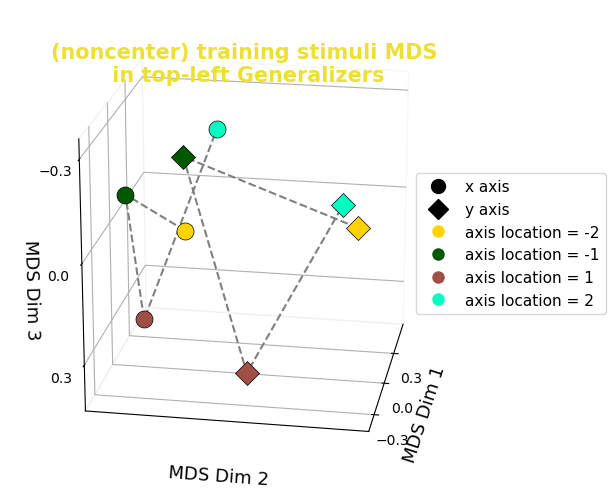

MDS - PS = 0.9062642234550026


In [142]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'top-left'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=0.9,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=0, azim=-100,roll=0)
ax.view_init(elev=-20, azim=170,roll=180)

ax.set_box_aspect([1, 1, 1]) 

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks([])
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)

plt.show()
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

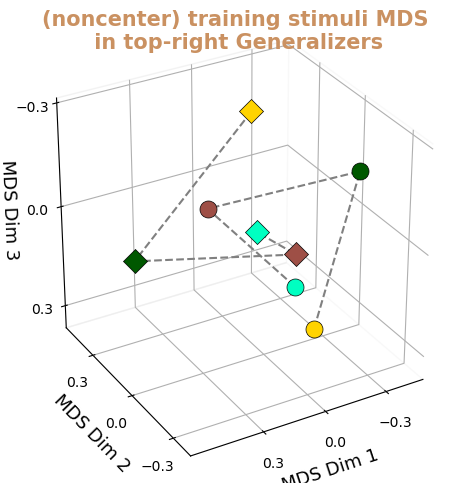

MDS - PS = -0.6531801141289265


In [187]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'top-right'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=20, azim=-100,roll=0)
ax.view_init(elev=-30, azim=-60,roll=180, vertical_axis='z')

ax.set_box_aspect([1, 1, 1]) 

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)
ax.legend().remove()
plt.show()
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

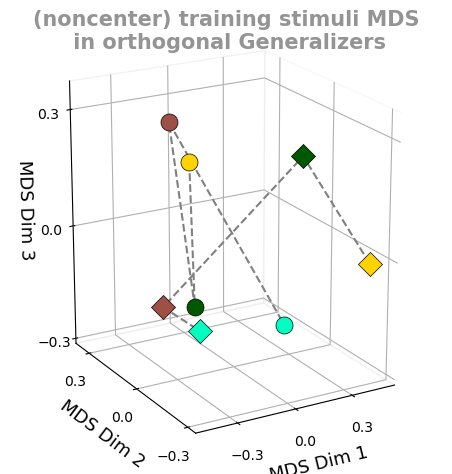

MDS - PS = 0.06262685595947472


In [250]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'orthogonal'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=0, azim=125,roll=0)
ax.view_init(elev=20, azim=-120,roll=0)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout()
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)
ax.legend().remove()
ax.set_box_aspect([0.8, 0.9, 1]) 

plt.show()
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

### pieced together static

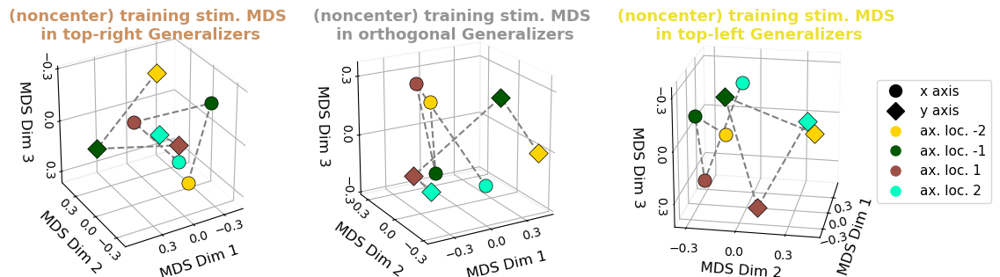

In [351]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"

ncompo = 3
fig = plt.figure(figsize=(14,5.5))
#view_inits = {"top-left":[0,-100,0],"top-right":[20,-100,0],"orthogonal":[0,125,0]}
view_inits = {"top-left":[-20,170,180],"top-right":[-30,-60,180],"orthogonal":[20,-120,0]}
#ax.view_init(elev=-20, azim=170,roll=180)
for jgroup,psgroupname in enumerate(['top-right','orthogonal','top-left']):

    plot_title=f"(noncenter) training stim. MDS\n in {psgroupname} Generalizers"

    roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])
    roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

    roimdsdf# = roimdsdf.iloc[[0,1]].copy()
    ax = fig.add_subplot(1,3,jgroup+1, projection='3d')


    # Plot each group with different color and marker
    for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
        ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
                color=stimycolorhex[tl], marker=axis_group_markers[ta],
                s=120,edgecolor='black',linewidth=0.5,
                label=f'{ta},{tl}')

    for ta,group in roimdsdf.groupby('training_axsetstr'):
        ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
                color="grey",linestyle="--")    

    # Create custom legends
    color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='ax. loc. %d'%(i))
                    for i in np.sort(roimdsdf["training_axlocTL"].unique())]
    marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                    for i in np.sort(roimdsdf["training_axsetstr"].unique())]

    # Set plot title and labels
    ax.set_title(plot_title,y=0.95,fontdict={"weight":"bold","size":13,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
    ax.set_xlabel('MDS Dim 1',fontdict={"size":12},labelpad=0.05)
    ax.set_ylabel('MDS Dim 2',fontdict={"size":12},labelpad=0.1)
    ax.set_zlabel('MDS Dim 3',fontdict={"size":12},labelpad=0.1)

    ax.view_init(*view_inits[psgroupname])
    ax.set_box_aspect([1, 1, 1]) 

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    def compute_ticks(data,decplace=1):
        min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
        ran = max_val - min_val
        D = np.ceil(ran/10**(-decplace)/2).astype(int)
        ticks = np.linspace(min_val,max_val,D,endpoint=True)
        return ticks
    ticks = [-0.3,0,0.3]
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_zticks(ticks)
    plt.setp(ax.get_xticklabels(), rotation=15,ha="center",va="center")
    plt.setp(ax.get_zticklabels(), rotation=-90,ha="center",va="center")
    # Adjust the axis limits to avoid cropping
    ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.95, 0.5),fontsize=11)
    if jgroup<2:
        ax.legend().remove()
        plt.setp(ax.get_yticklabels(), rotation=-45,ha="center",va="center")
    if jgroup==0:
        ax.set_box_aspect([1,1,1], zoom=0.9) 
    elif jgroup==1:
        ax.set_box_aspect([1, 1, 1], zoom=0.95) 
    else:
        ax.set_box_aspect([1, 1,1 ], zoom=0.95)
       # ax.set_yticks([])
    ax.tick_params(pad=0)

fig.subplots_adjust(hspace=0,left=0,right=0.7,bottom=0.05,top=1)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
plt.show()

## Correlation between fit and eval in CVPS in all possible splits

In [ ]:
ROIPS_PTA_cvres = load(os.path.join(ROIRSAdir,"ROI_PTARSA_locpairheldout.pkl"))["PS"]

ROIPS_PTA_cvres_dfs = []
n_PSCV_split = 3
for roi in ROIPS_PTA_cvres.keys():
    tmpdf = pd.DataFrame()
    tmpdf["fit"] = sum([[x["fit"][j] for x in ROIPS_PTA_cvres[roi][roi]] for j in range(n_PSCV_split)],[])
    tmpdf["eval"] = sum([[x["eval"][j] for x in ROIPS_PTA_cvres[roi][roi]] for j in range(n_PSCV_split)],[])
    tmpdf["subid"] = subid_list * n_PSCV_split
    tmpdf["HPCpscat"] = list(PS_classification["HPC_bilateral"]) * n_PSCV_split
    ROIPS_PTA_cvres_dfs.append(tmpdf.assign(roi=roi))
ROIPS_PTA_cvres_df = pd.concat(ROIPS_PTA_cvres_dfs,axis=0).reset_index(drop=True)
ROIPS_PTA_cvres_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in ROIPS_PTA_cvres_df["subid"]]
print(ROIPS_PTA_cvres_df.shape)
print(ROIPS_PTA_cvres_df.shape[0]==ROIPS_PTA_cvres_df.roi.nunique()*len(subid_list)*n_PSCV_split)
ROIPS_PTA_cvres_df.head(5)

In [ ]:
sns.relplot(data=ROIPS_PTA_cvres_df,x="fit",y="eval",hue="HPCpscat",row="subgroup",col="roi",kind="scatter",facet_kws={"sharey":False})

## PTARSA 2v2 AVE

In [61]:
PTAregRSA_CVres = load(os.path.join(ROIRSAdir,'axisPS','RSAleavonerunoutAVE',"ROI_PTARSA_2v2.pkl"))
PTAregRSA_CVres.keys()


dict_keys(['RSA', 'PS'])

In [66]:
PS_classification = pd.read_csv(os.path.join(ROIRSAdir,"axisPS","PS_classification.csv"))
PS_classification.columns

Index(['Unnamed: 0', 'testgtlocTPMid_bilateral',
       'testgtlocParietalSup_bilateral', 'HPCPHPC_bilateral', 'HPC_bilateral',
       'vmPFC_bilateral', 'V1_bilateral', 'V2_bilateral', 'subid'],
      dtype='object')

In [ ]:
np.random.permutation(list(itertools.combinations([-2,-1,1,2],2)))[0]

In [65]:
ROIRSA_PTA_cvres = pd.concat(PTAregRSA_CVres["RSA"],axis=0).reset_index(drop=True)
ROIRSA_PTA_cvres.head(5)

,modelrdm,coefficient,analysis,adjR2,R2,heldoutrun,subid,subgroup,cohort,PSGROUProi,RSAroi
0,PTA_ax,-0.094806,train stim Compete PTAhigh Cartesian,0.105074,0.171365,0-1,sub001,Generalizer,first cohort,testgtlocTPMid_bilateral,testgtlocTPMid_bilateral
1,PTA_locNomial,-0.341475,train stim Compete PTAhigh Cartesian,0.105074,0.171365,0-1,sub001,Generalizer,first cohort,testgtlocTPMid_bilateral,testgtlocTPMid_bilateral
2,gtlocEuclidean,-0.250164,train stim Compete PTAhigh Cartesian,0.105074,0.171365,0-1,sub001,Generalizer,first cohort,testgtlocTPMid_bilateral,testgtlocTPMid_bilateral
3,gtlocEuclidean,-0.259793,train stim betweenxy Cartesian,0.067492,0.067492,0-1,sub001,Generalizer,first cohort,testgtlocTPMid_bilateral,testgtlocTPMid_bilateral
4,PTA_locEuc,-0.313049,train stim betweenxy PTA low,0.098000,0.098000,0-1,sub001,Generalizer,first cohort,testgtlocTPMid_bilateral,testgtlocTPMid_bilateral


In [94]:
print(ROIRSA_PTA_cvres.analysis.unique())
print(ROIRSA_PTA_cvres.RSAroi.unique())
ROIRSA_PTA_cvres.columns

['train stim Compete PTAhigh Cartesian' 'train stim betweenxy Cartesian'
 'train stim betweenxy PTA low' 'train stim betweenxy PTA high'
 'train stim betweenxy Compete PTAhigh Cartesian'
 'train stim betweenxy Compete PTAlow Cartesian']
['testgtlocTPMid_bilateral' 'testgtlocParietalSup_bilateral'
 'HPCPHPC_bilateral' 'HPC_bilateral' 'vmPFC_bilateral' 'V1_bilateral'
 'V2_bilateral']


Index(['modelrdm', 'coefficient', 'analysis', 'adjR2', 'R2', 'heldoutrun',
       'subid', 'subgroup', 'cohort', 'PSGROUProi', 'RSAroi'],
      dtype='object')

In [67]:
ROIRSA_PTA_cvres_meandf = ROIRSA_PTA_cvres.groupby([ 'PSGROUProi', 'analysis', 'subid', 'modelrdm'])[['adjR2', 'R2', 'coefficient']].mean().reset_index()
ROIRSA_PTA_cvres_meandf["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in ROIRSA_PTA_cvres_meandf["subid"]]
PSHPCcat = PS_classification[["subid","HPC_bilateral","vmPFC_bilateral"]].copy()
PSHPCcat["HPCpscat"] = PSHPCcat["HPC_bilateral"].map({-1:"top-right",0:"orthogonal",1:"top-left"})
PSHPCcat["HPCpscat_bin"] = PSHPCcat["HPC_bilateral"].map({-1:"parallel",0:"orthogonal",1:"parallel"})
PSHPCcat["vmPFCpscat"] = PSHPCcat["vmPFC_bilateral"].map({-1:"top-right",0:"orthogonal",1:"top-left"})
PSHPCcat["vmPFCpscat_bin"] = PSHPCcat["vmPFC_bilateral"].map({-1:"parallel",0:"orthogonal",1:"parallel"})
PSHPCcat["subid"] = PSHPCcat["subid"].astype(str)
ROIRSA_PTA_cvres_meandf["subid"] = ROIRSA_PTA_cvres_meandf["subid"].astype(str)
ROIRSA_PTA_cvres_meandf = ROIRSA_PTA_cvres_meandf.merge(PSHPCcat[["subid","HPCpscat","HPCpscat_bin","vmPFCpscat","vmPFCpscat_bin"]],on="subid",how="left")
ROIRSA_PTA_cvres_meandf

,PSGROUProi,analysis,subid,modelrdm,adjR2,R2,coefficient,subgroup,HPCpscat,HPCpscat_bin,vmPFCpscat,vmPFCpscat_bin
0,HPCPHPC_bilateral,train stim Compete PTAhigh Cartesian,sub001,PTA_ax,-0.010029,0.064788,0.008795,Generalizer,top-left,parallel,top-left,parallel
1,HPCPHPC_bilateral,train stim Compete PTAhigh Cartesian,sub001,PTA_locNomial,-0.010029,0.064788,0.070202,Generalizer,top-left,parallel,top-left,parallel
2,HPCPHPC_bilateral,train stim Compete PTAhigh Cartesian,sub001,gtlocEuclidean,-0.010029,0.064788,0.052947,Generalizer,top-left,parallel,top-left,parallel
3,HPCPHPC_bilateral,train stim Compete PTAhigh Cartesian,sub002,PTA_ax,-0.005593,0.068895,0.107175,nonGeneralizer,top-right,parallel,top-right,parallel
4,HPCPHPC_bilateral,train stim Compete PTAhigh Cartesian,sub002,PTA_locNomial,-0.005593,0.068895,-0.094279,nonGeneralizer,top-right,parallel,top-right,parallel
...,...,...,...,...,...,...,...,...,...,...,...,...
3915,vmPFC_bilateral,train stim betweenxy PTA low,sub125,PTA_locEuc,0.031711,0.031711,-0.044424,Generalizer,top-left,parallel,orthogonal,orthogonal
3916,vmPFC_bilateral,train stim betweenxy PTA low,sub127,PTA_locEuc,0.087969,0.087969,0.211093,Generalizer,top-left,parallel,top-right,parallel
3917,vmPFC_bilateral,train stim betweenxy PTA low,sub128,PTA_locEuc,0.068228,0.068228,-0.148863,Generalizer,top-left,parallel,orthogonal,orthogonal
3918,vmPFC_bilateral,train stim betweenxy PTA low,sub129,PTA_locEuc,0.059887,0.059887,-0.033450,Generalizer,orthogonal,orthogonal,top-left,parallel


In [96]:
ROIRSA_PTA_cvres_meandf["PSGROUProi"].unique()

array(['HPCPHPC_bilateral', 'HPC_bilateral', 'V1_bilateral',
       'V2_bilateral', 'testgtlocParietalSup_bilateral',
       'testgtlocTPMid_bilateral', 'vmPFC_bilateral'], dtype=object)

('orthogonal', 'Generalizer') 0.25477452254774524
('orthogonal', 'nonGeneralizer') 0.14978502149785022
('parallel', 'Generalizer') 0.0035996400359964
('parallel', 'nonGeneralizer') 0.5865413458654135


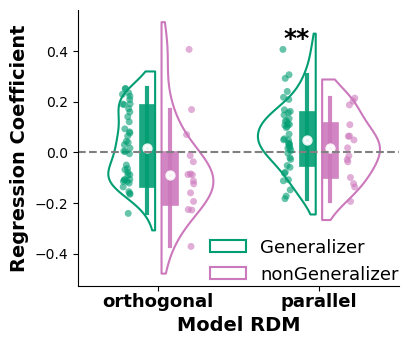

In [77]:
plt_pdf = ROIRSA_PTA_cvres_meandf[(ROIRSA_PTA_cvres_meandf.analysis=='train stim betweenxy Compete PTAhigh Cartesian')].copy().reset_index(drop=True)
plt_pdf = plt_pdf[plt_pdf.PSGROUProi=="HPC_bilateral"].copy()     
plt_pdf["modelrdm_shortname"] = pd.Categorical(
    plt_pdf["modelrdm"].map({"PTA_locNomial":"parallel","gtlocEuclidean":"orthogonal"}),
)   
gs = sns.catplot(
    plt_pdf,
    x="modelrdm_shortname",y="coefficient",
    hue="subgroup",palette=participantgrouphex,
    kind="violin",split=True,inner="box",gap=0.1,fill=False,cut=True,
    inner_kws = dict(box_width = 12, whis_width=3,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
    height=3.5,aspect=1.2
)
gs.refline(y=0)
gs.map_dataframe(sns.stripplot,x="modelrdm_shortname",y="coefficient",
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 jitter=0.05,linewidth=0,alpha=0.6,size=5)
gs.set_xlabels("Model RDM",fontsize=14,fontweight="bold")
gs.set_ylabels("Regression Coefficient",fontsize=14,fontweight="bold")
sns.move_legend(gs, "upper right", bbox_to_anchor=(0.72, 0.35), fontsize=13,title="")
for ax in gs.axes.flatten():
    plt.setp(ax.get_xticklabels(), rotation=0,fontsize=13,fontweight="bold")
    ax.tick_params(axis='x',pad=1)
    for j, (gname,gdf) in enumerate(plt_pdf.groupby(["modelrdm_shortname","subgroup"])):
        pval = ttest1samp_equiv_permutation(gdf["coefficient"])
        print(gname,pval)
        ax.text(np.floor(j/2)-0.22,y=0.42,s=f"{gen_pval_annot(pval,show_pval=False)}",fontsize=18,fontweight="bold",color="black")

#gs.fig.suptitle("ROI Cross-validated RSA",x=0.4,fontsize=14,fontweight="bold")

('orthogonal', 'Generalizer') 0.22397760223977603
('orthogonal', 'nonGeneralizer') 0.7195280471952805
('parallel', 'Generalizer') 0.5767423257674232
('parallel', 'nonGeneralizer') 0.33236676332366766


Text(0.4, 1.1, 'ROI Cross-validated RSA (vmPFC)')

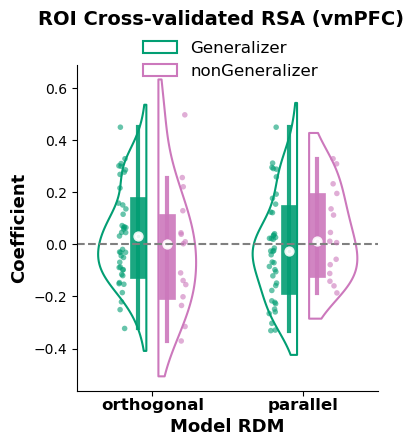

In [313]:
plt_pdf = ROIRSA_PTA_cvres_meandf[(ROIRSA_PTA_cvres_meandf.analysis=='train stim betweenxy Compete PTAhigh Cartesian')].copy().reset_index(drop=True)
plt_pdf = plt_pdf[plt_pdf.PSGROUProi=="vmPFC_bilateral"].copy()     
plt_pdf["modelrdm_shortname"] = pd.Categorical(
    plt_pdf["modelrdm"].map({"PTA_locNomial":"parallel","gtlocEuclidean":"orthogonal"}),
)   
gs = sns.catplot(
    plt_pdf,
    x="modelrdm_shortname",y="coefficient",
    hue="subgroup",palette=participantgrouphex,
    kind="violin",split=True,inner="box",gap=0.2,fill=False,cut=True,
    inner_kws = dict(box_width = 12, whis_width=3,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
    height=4,aspect=1
)
gs.refline(y=0)
gs.map_dataframe(sns.stripplot,x="modelrdm_shortname",y="coefficient",
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 jitter=0.05,linewidth=0,alpha=0.6,size=4)
gs.set_xlabels("Model RDM",fontsize=13,fontweight="bold")
gs.set_ylabels("Coefficient",fontsize=13,fontweight="bold")
sns.move_legend(gs, "upper right", bbox_to_anchor=(0.6, 1.06), fontsize=12,title="")
for ax in gs.axes.flatten():
    plt.setp(ax.get_xticklabels(), rotation=0,fontsize=12,fontweight="bold")
    ax.tick_params(axis='x',pad=1)
    for j, (gname,gdf) in enumerate(plt_pdf.groupby(["modelrdm_shortname","subgroup"])):
        pval = ttest1samp_equiv_permutation(gdf["coefficient"])
        print(gname,pval)
        ax.text(np.floor(j/2)-0.22,y=0.32,s=f"{gen_pval_annot(pval,show_pval=False)}",fontsize=18,fontweight="bold",color="black")

gs.fig.suptitle("ROI Cross-validated RSA (vmPFC)",x=0.4,y=1.1,fontsize=14,fontweight="bold")

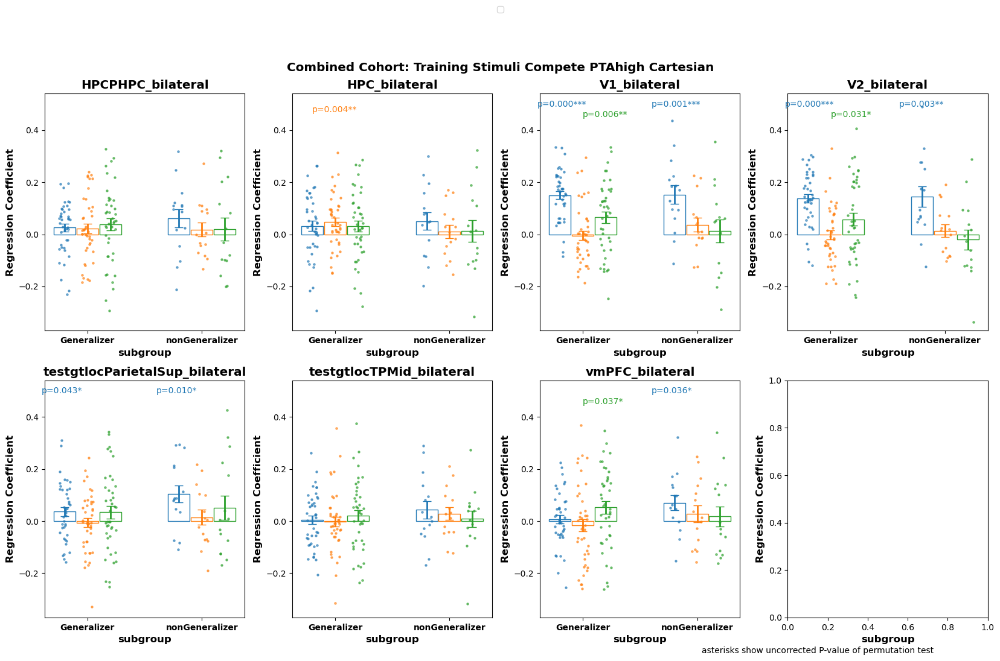

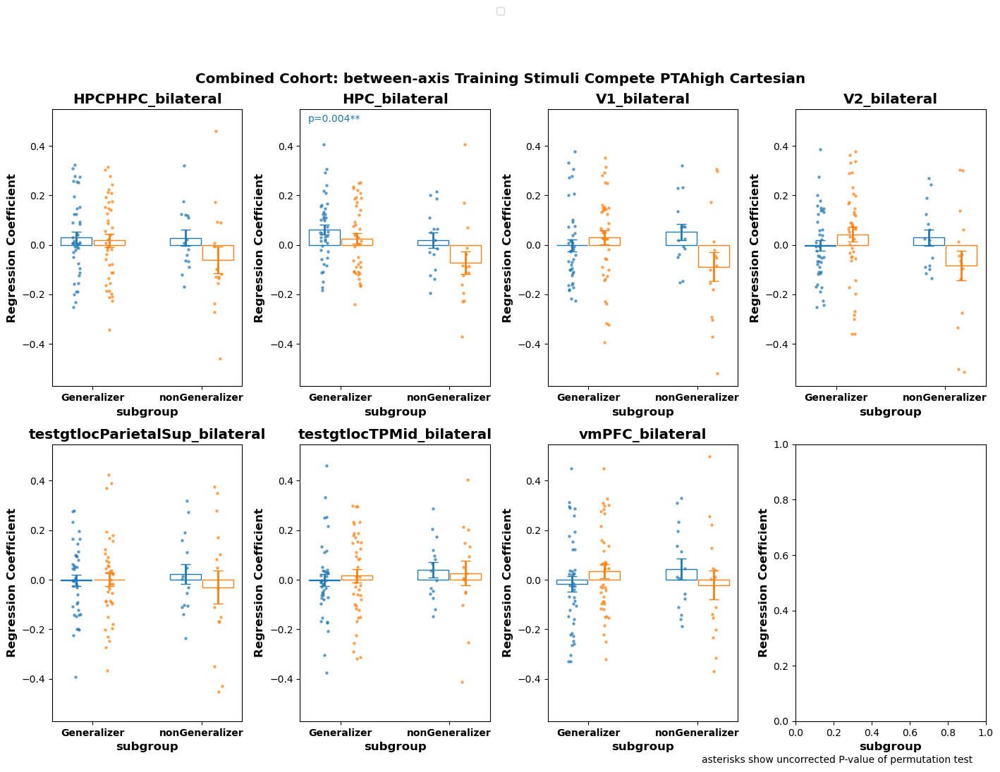

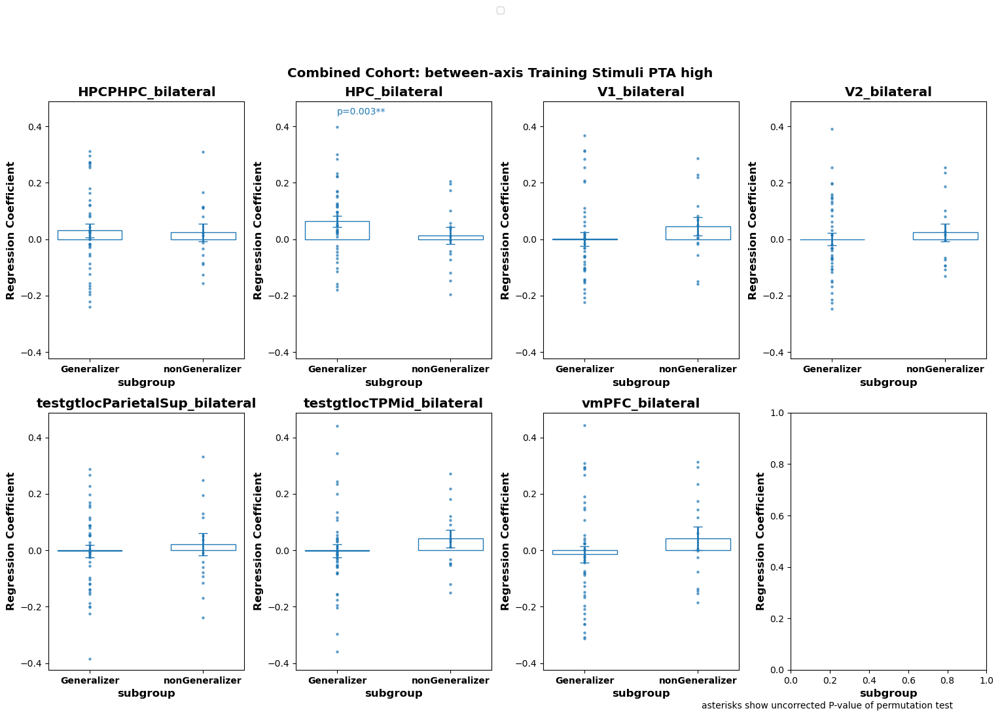

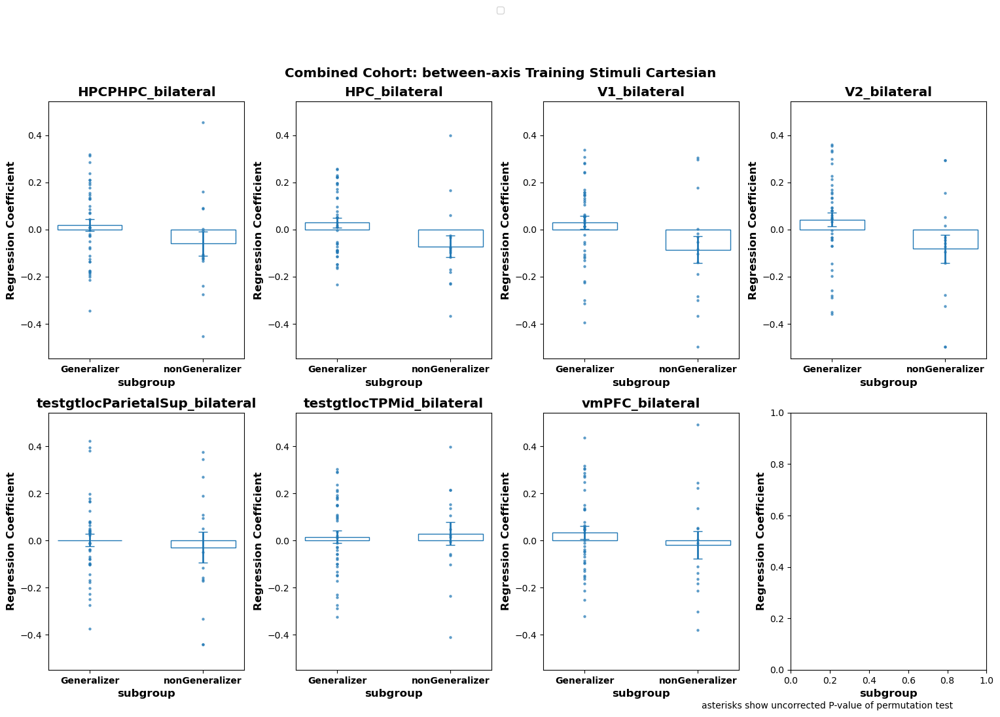

In [1379]:
# test if coefficients are significantly above zero subgroup HPCrepcat
xvar, gvar, yvar, yvartest = "subgroup", "modelrdm",   "coefficient", "coefficient"



plt_ana = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   
                   ["Training Stimuli Compete PTAhigh Cartesian",
                    'between-axis Training Stimuli Compete PTAhigh Cartesian',
                    "between-axis Training Stimuli PTA high",
                    "between-axis Training Stimuli Cartesian"                       
                   ]))
aprs    = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   [1.2,1.4,1.3,1.3]))

plot_subset_df = ROIRSA_PTA_cvres_meandf.copy().reset_index(drop=True)
for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = plot_subset_df[(plot_subset_df.analysis==a)].copy().reset_index(drop=True)
        #curr_pdf = curr_pdf[curr_pdf.subid.isin(generalizers)].copy().reset_index(drop=True)
        curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar])
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "PSGROUProi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=2,pcols=4,hrow=5,wcol=5/aprs[a],
                                    #prows=1,pcols=2,hrow=5,wcol=5/aprs[a],
                                    statfunc= ttest1samp_equiv_permutation)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel(xvar,fontweight="bold",fontsize="large")        
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend(hs,ls,loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of permutation test')
        fig.tight_layout()


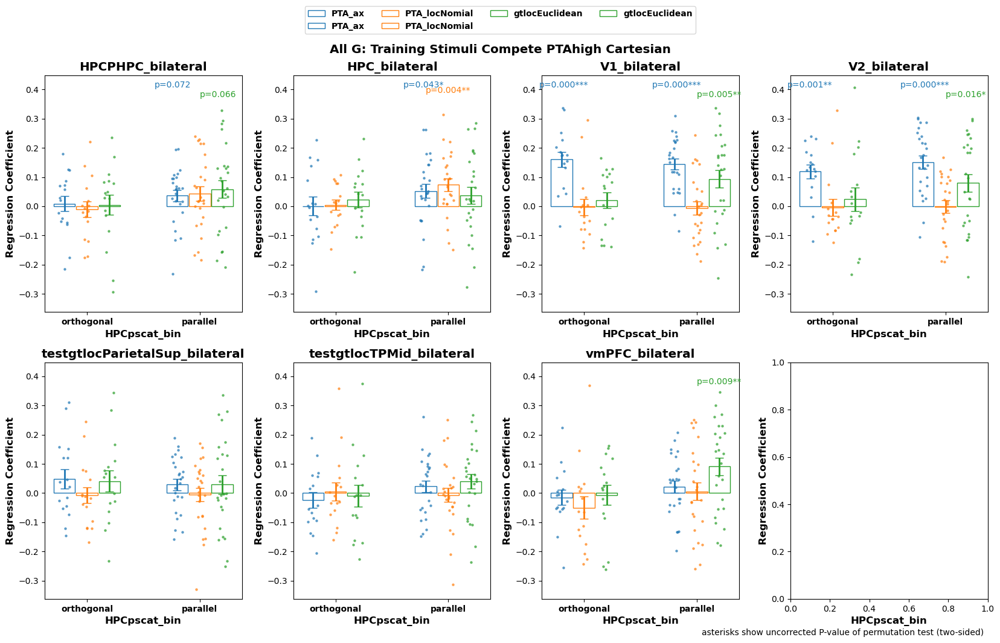

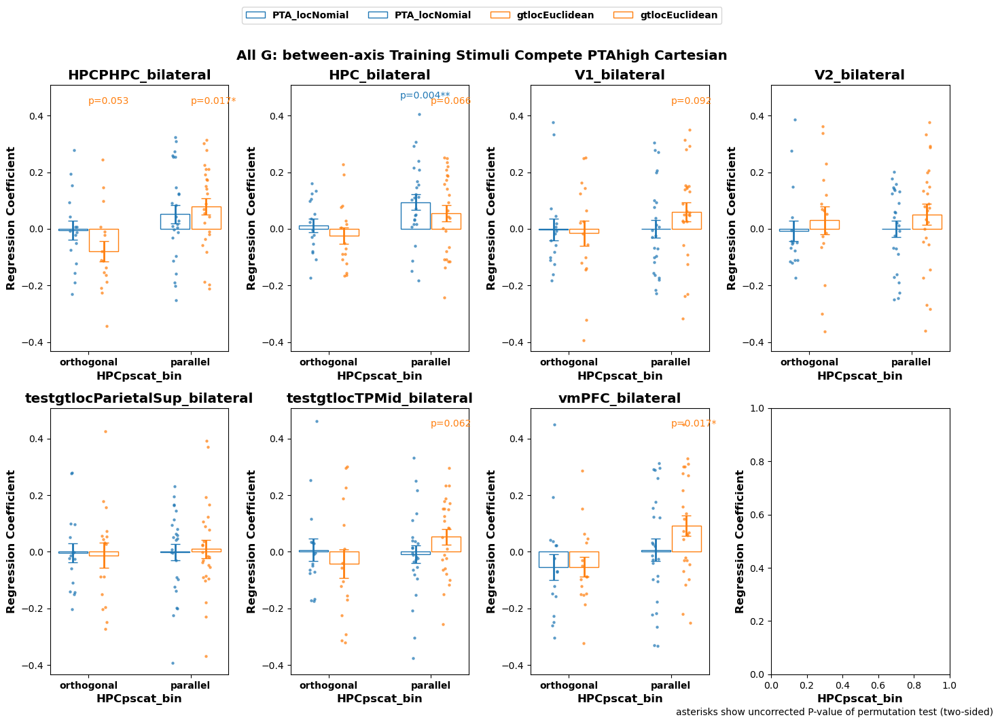

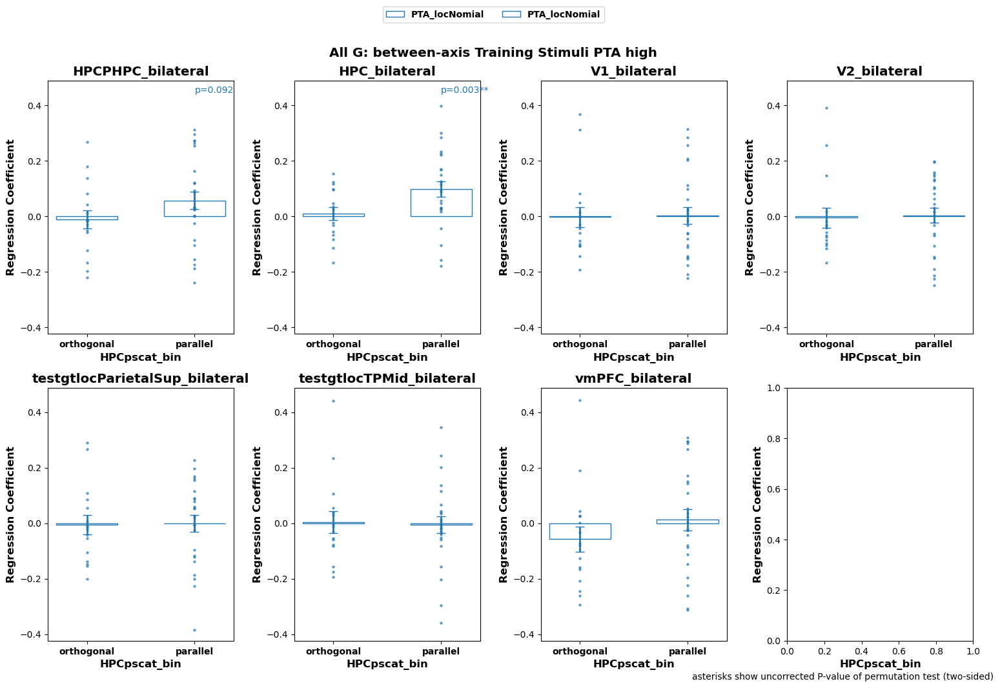

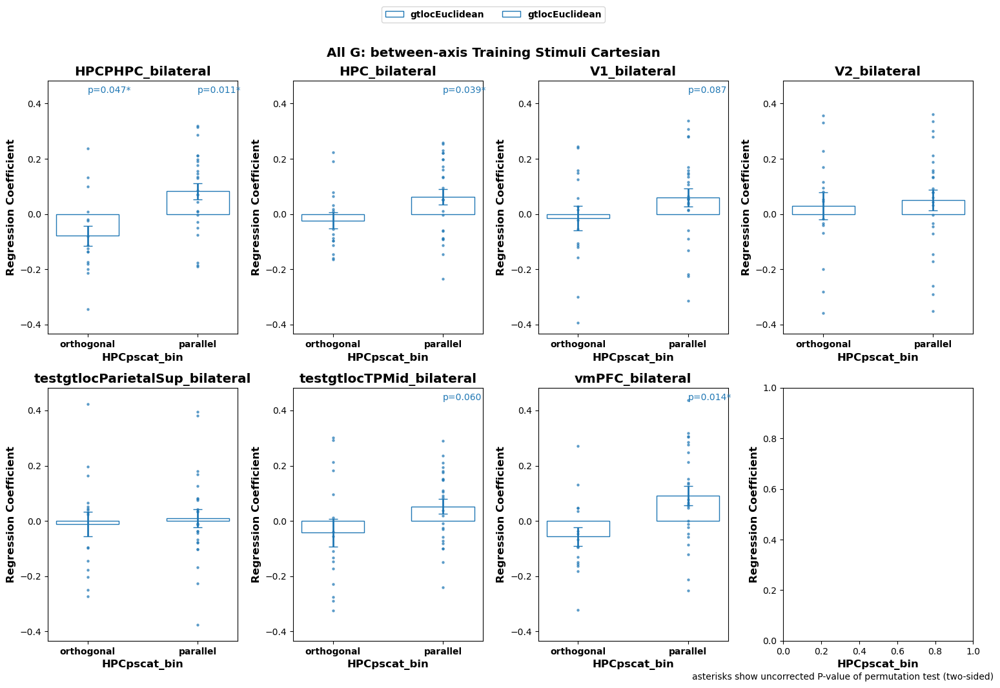

In [115]:
# test if coefficients are significantly above zero subgroup HPCrepcat
xvar, gvar, yvar, yvartest = "HPCpscat_bin", "modelrdm",   "coefficient", "coefficient"



plt_ana = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   
                   ["Training Stimuli Compete PTAhigh Cartesian",
                    'between-axis Training Stimuli Compete PTAhigh Cartesian',
                    "between-axis Training Stimuli PTA high",
                    "between-axis Training Stimuli Cartesian"                       
                   ]))
aprs    = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   [1.2,1.4,1.3,1.3]))

plot_subset_df = ROIRSA_PTA_cvres_meandf.copy().reset_index(drop=True)
for cname,clist in zip(["All G"],[generalizers]):
    for a, atitle in plt_ana.items():
        curr_pdf = plot_subset_df[(plot_subset_df.analysis==a)].copy().reset_index(drop=True)
        curr_pdf = curr_pdf[curr_pdf.subid.isin(generalizers)].copy().reset_index(drop=True)
        curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar])
        #curr_pdf[gvar] = pd.Categorical(curr_pdf[gvar])
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "PSGROUProi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=2,pcols=4,hrow=5,wcol=5/aprs[a],
                                    #prows=1,pcols=2,hrow=5,wcol=5/aprs[a],
                                    statfunc= ttest1samp_equiv_permutation)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel(xvar,fontweight="bold",fontsize="large")
        
            
        hs,ls = axes.flatten()[0].get_legend_handles_labels()
        fig.legend(hs,ls,loc="upper center",bbox_to_anchor=(0.5,1.05),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of permutation test (two-sided)')
        fig.tight_layout()


## Correlation between PS of lzer and navi

In [ ]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'orthogonal'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=0, azim=125,roll=0)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout()
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)
ax.legend().remove()
ax.set_box_aspect([0.8, 0.9, 1]) 

plt.show()
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

In [ ]:
taskPSdf = pd.concat(
    [pd.DataFrame(
        {"subid":subid_list,
        "navi_PS": sub_cs_obs[roi],
        "lzer_PS": lzersub_cs_obs[roi],
        "HPC_PScat": PS_classification["HPC_bilateral"]}
    ).assign(roi=roi) for roi in ["HPC_bilateral","V1_bilateral","testgtlocParietalSup_bilateral","vmPFC_bilateral"]
    ]
).reset_index(drop=True)
taskPSdf["subgroup"] = ["Generalizers" if subid in generalizers else "nonGeneralizers" for subid in taskPSdf["subid"]]

In [ ]:
taskPSdf

In [ ]:
list(itertools.combinations([-2,-1,1,2],2))


In [ ]:
gs = sns.relplot(data=taskPSdf,x="navi_PS",y="lzer_PS",hue="HPC_PScat",row="subgroup",col="roi",kind="scatter",facet_kws={"sharex":False,"sharey":False})
gs.map_dataframe(sns.regplot,x="navi_PS",y="lzer_PS",scatter=False)

## MDS plots

In [ ]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'top-left'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=0, azim=-10,roll=0)
#ax.view_init(elev=0, azim=0,roll=-40)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

In [ ]:
%matplotlib inline
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'top-right'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d',axisbelow=False)

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    group.sort_values("training_axlocTR",inplace=True)
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1.2,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=10, azim=110,roll=0)
ax.view_init(elev=25, azim=120,roll=-135)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)
ax.legend().remove()
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout()
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.png"),bbox_inches='tight',dpi=300,pad_inches=0.5)

In [ ]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.animation as animation
def update_view(num,angles,ax):
    angle = angles[num]
    # Normalize the angle to the range [-180, 180] for display
    angle_norm = (angle + 180) % 360 - 180

    # Cycle through a full rotation of elevation, then azimuth, roll, and all
    elev = azim = roll = 0
    if angle <= 360:
        elev = angle_norm
    elif angle <= 360*2:
        azim = angle_norm
    elif angle <= 360*3:
        roll = angle_norm
    else:
        elev = azim = roll = angle_norm
    ax.view_init(elev, azim, roll)
    ax.set_title('Elevation: %d°, Azimuth: %d°, Roll: %d°' % (elev, azim, roll))
    return ax

ax.view_init(elev=0, azim=0,roll=0)
angles = np.arange(0, 360*4 + 1,10)
# Creating the Animation object
ani = animation.FuncAnimation(
    fig, func=update_view, frames=range(len(angles)), fargs=(angles,ax), interval=500)

plt.show()
ani.save(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.gif"),fps=30)

In [ ]:
ani.save(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.gif"),fps=2)

In [ ]:
ani.to_jshtml(fps=10)

In [ ]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'orthogonal'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=10, azim=115,roll=0)
ax.view_init(elev=10, azim=60,roll=0)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1.05, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

In [ ]:
import matplotlib.animation as animation
def update_view(num,angles,ax):
    X, Y, Z = axes3d.get_test_data(0.05)
    ax.contour(X, Y, Z)
    angle = angles[num]
    # Normalize the angle to the range [-180, 180] for display
    angle_norm = (angle + 180) % 360 - 180

    # Cycle through a full rotation of elevation, then azimuth, roll, and all
    elev = azim = roll = 0
    if angle <= 360:
        elev = angle_norm
    elif angle <= 360*2:
        azim = angle_norm
    elif angle <= 360*3:
        roll = angle_norm
    else:
        elev = azim = roll = angle_norm
    ax.view_init(elev, azim, roll)
    ax.set_title('Elevation: %d°, Azimuth: %d°, Roll: %d°' % (elev, azim, roll))
    #return ax
    
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Grab some example data and plot a basic wireframe.
X, Y, Z = axes3d.get_test_data(0.05)
ax.contour(X, Y, Z)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

angles = np.arange(0, 360*4 + 1,5)
# Creating the Animation object
ani = animation.FuncAnimation(
    fig, func=update_view, frames=range(len(angles)), fargs=(angles,ax), interval=1000)

plt.show()